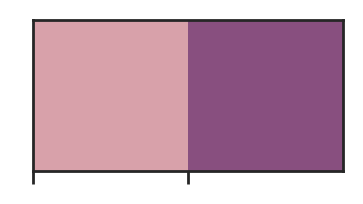

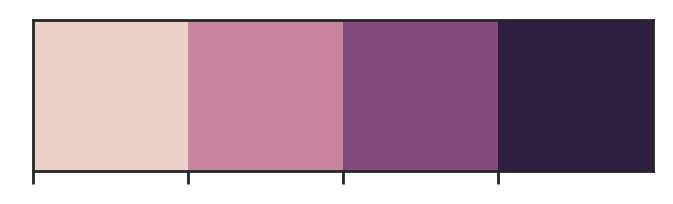

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"

import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams["font.size"] = 20
rcParams['figure.dpi'] = 100
rcParams["savefig.dpi"] = 300
rcParams["savefig.bbox"] = 'tight'

import seaborn as sns
sns.set_context("paper")
sns.set_style("ticks")

import numpy as np
import pandas as pd
import pickle
from scipy import interpolate

import os
import requests
from io import BytesIO
from io import StringIO

from astropy.table import Table
from astropy.table import join
from astropy.io import ascii
import astropy.constants as c

from scipy import interpolate
from sklearn import svm
from arviz import hpd

# Function to get NASA Exoplanet Archive catalogs 
# from Dan Foreman-Mackey (https://github.com/dfm/exopop)
def get_catalog(name, basepath="data"):
    fn = os.path.join(basepath, "{0}.h5".format(name))
    if os.path.exists(fn):
        return pd.read_hdf(fn, name)
    if not os.path.exists(basepath):
        os.makedirs(basepath)
    print("Downloading {0}...".format(name))
    url = ("http://exoplanetarchive.ipac.caltech.edu/cgi-bin/nstedAPI/"
           "nph-nstedAPI?table={0}&select=*").format(name)
    r = requests.get(url)
    if r.status_code != requests.codes.ok:
        r.raise_for_status()
        
    fh = BytesIO(r.content)
    df = pd.read_csv(fh)
    df.to_hdf(fn, name, format="t")
    return df

#To track the provenance of different columns, we want a function to prepend an informative string to each column name.
#We will do this before merging tables to make tracking the information easier.
def prepend_dataframe_columns(df, prefix):
    df.columns = [prefix+col for col in df.columns]
    return 


#Suppressing astropy units warnings
import warnings
from astropy.utils.exceptions import AstropyWarning

warnings.filterwarnings('ignore', category=UserWarning, append=True)
warnings.simplefilter('ignore', category=AstropyWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

#Suppressing Pandas chained assignment warnings
pd.options.mode.chained_assignment = None  # default='warn'

# Consistent color map throughout
cpal = sns.cubehelix_palette(4)
cmap = sns.cubehelix_palette(start=3, light=0.95, as_cmap=True)
tt_cmap = sns.cubehelix_palette(2, light=0.7, dark=0.4, as_cmap=True)
tt_cpal = sns.cubehelix_palette(2, light=0.7, dark=0.4, as_cmap=False)

sns.set_palette(cpal)
sns.palplot(tt_cpal)
sns.palplot(cpal)

fig_overwrite = False

### Load the CKS VII table (merged with several literature tables)
This table is the output of the merge-tables.ipynb notebook

In [2]:
cks = pd.read_parquet('../data/cks-merged.parquet')

### MIST v1.1 isochrones
For plotting and sample selection purposes

In [3]:
#Non-rotating solar metallicity MIST isochrones
mist  = np.genfromtxt('../data/isochrones/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.iso', skip_header=10, names=True)
#Non-rotating Fe/H = -0.25 MIST isochrones
mistm = np.genfromtxt('../data/isochrones/MIST_v1.2_feh_m0.25_afe_p0.0_vvcrit0.0_basic.iso', skip_header=10, names=True)
#Non-rotating Fe/H = +0.25 MIST isochrones
mistp = np.genfromtxt('../data/isochrones/MIST_v1.2_feh_p0.25_afe_p0.0_vvcrit0.0_basic.iso', skip_header=10, names=True)
#Rotating (v/vcrit=0.4) solar metallicity MIST isochrones
mistr = np.genfromtxt('../data/isochrones/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.4_basic.iso', skip_header=10, names=True)

### H-R Diagram and selection of main sequence stars (Figure 1)

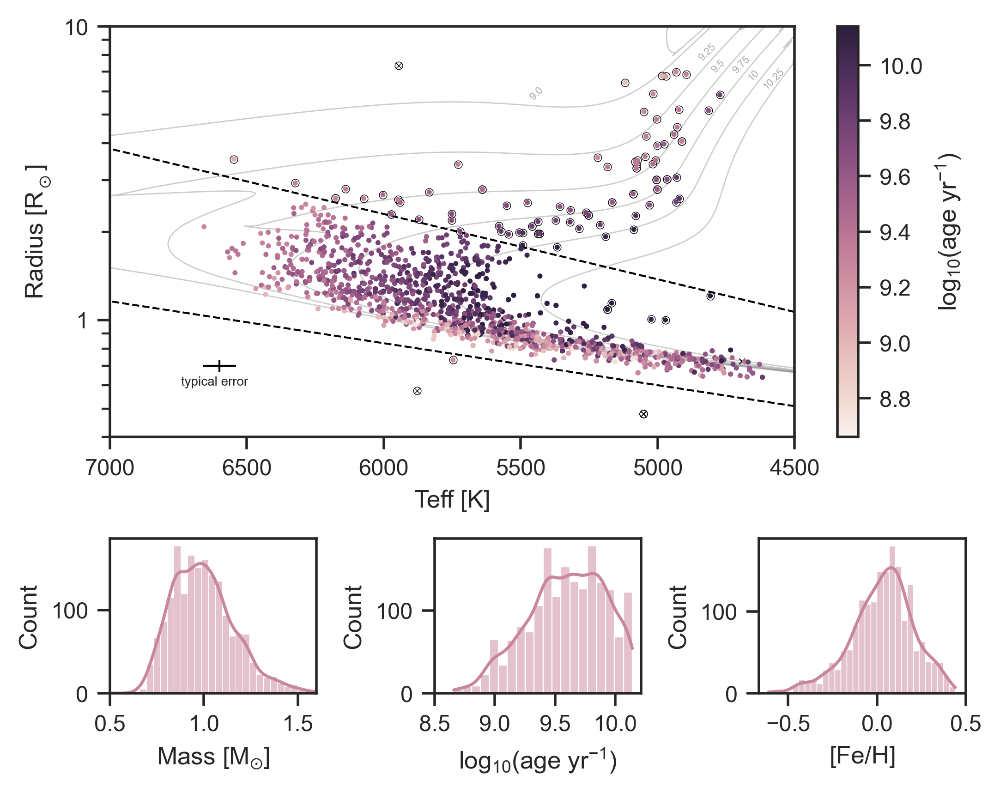

In [4]:
def maxage_teff(rstar):
    arg = (mistp['log10_isochrone_age_yr']==10.25)&(mistp['EEP']<500)
    f = interpolate.interp1d(10.**mistp['log_R'][arg], 
                             10.**mistp['log_Teff'][arg], 
                             kind='cubic', fill_value='extrapolate')
    return f(rstar)


def hrd_plot(fig_path=None):

    _teff = np.linspace(4500,7000,10)

    #We wish to remove stars that obviously fall below the main sequence as these may have unreliable stellar parameters
    m_onms = cks['f18_R'] > 10.**((cks['f18_Teff']-5500)/7000 - 0.15)
    #Our study will focus stars which have not evolved far off the main sequence
    m_unevolved = cks['f18_R'] < 10.**((cks['f18_Teff']-5500)/4500 + 0.25)
    #Some cool stars appear to be elevated from the main-sequence, corresponding to ages older than the universe
    #even if they are metal-rich.
    m_unelevated = cks['f18_Teff'] > maxage_teff(cks['f18_R'])

    #Combining masks
    m_ms = m_onms&m_unevolved&m_unelevated

    #Plotting the HRD
    fig = plt.figure(figsize=(5*1.1,4*1.1), dpi=200)
    ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=3, rowspan=2)
    ax2 = plt.subplot2grid((3, 3), (2, 0), colspan=1)
    ax3 = plt.subplot2grid((3, 3), (2, 1), colspan=1)
    ax4 = plt.subplot2grid((3, 3), (2, 2), colspan=1)

    ax1.plot(cks['f18_Teff'][~np.isfinite(cks['f18_logAiso'])], cks['f18_R'][~np.isfinite(cks['f18_logAiso'])], 'kx', ms=2, mew=0.25)
    ax1.plot(cks['f18_Teff'][~m_ms], cks['f18_R'][~m_ms], 'ko', mfc="None", ms=3, mew=0.25)
    scpl = ax1.scatter(cks['f18_Teff'], cks['f18_R'], c=cks['f18_logAiso'], s=4, cmap=cmap, lw=0, zorder=999)

    ax1.plot(_teff, 10.**((_teff-5500)/4500 + 0.25), '--', color='k', lw=0.75) #upper boundary
    ax1.plot(_teff, 10.**((_teff-5500)/7000 - 0.15), '--', color='k', lw=0.75) #lower boundary

    for la in [9.,9.25,9.5,9.75,10,10.25]:
        __ = mist['log10_isochrone_age_yr']==la
        ax1.plot(10.**mist['log_Teff'][__], 10.**mist['log_R'][__], color='k', alpha=0.2, lw=0.5)
        __ &= (mist['EEP']==505)
        ax1.text(10.**mist['log_Teff'][__]+30, 1.05*10.**mist['log_R'][__], 
                 str(la), rotation=45, color='darkgrey', size=4)

    ax1.errorbar(6600,0.7, 
                 xerr=np.nanmedian(cks['f18_E_Teff']),
                 yerr=np.nanmedian(cks['f18_E_R']),
                 fmt='.', ms=0, color='k', lw=0.75)
    ax1.text(6740,0.6,'typical error',size=5)

    ax1.set_xlabel('Teff [K]')
    ax1.set_ylabel(r'Radius [$\mathregular{R_\odot}$]')
    ax1.set_xlim(7000,4500)
    ax1.semilogy()
    ax1.set_ylim(0.4,10)
    ax1.set_yticks([1,10])
    ax1.set_yticklabels(['1','10'])
    fig.colorbar(scpl, label=r'log$_\mathregular{10}$(age yr$^\mathregular{-1}$)', ax=ax1)

    sns.histplot(cks['f18_Miso'][m_ms], kde=True, ax=ax2, color=cpal[1])
    sns.histplot(cks['f18_logAiso'][m_ms], kde=True, ax=ax3, color=cpal[1])
    sns.histplot(cks['f18_[Fe/H]'][m_ms], kde=True, ax=ax4, color=cpal[1])

    ax2.set_xlim(0.5,1.6)
    ax3.set_xticks([8.5,9,9.5,10])
    ax4.set_xticks([-0.5,0,0.5])
    ax2.set_xlabel(r'Mass [M$_\mathregular{\odot}$]')
    ax3.set_xlabel(r'log$_\mathregular{10}$(age yr$^\mathregular{-1}$)')
    ax4.set_xlabel(r'[Fe/H]')

    plt.tight_layout()
    
    if fig_path:
        plt.savefig(fig_path)
    plt.show()

    return m_ms, m_onms, m_unevolved, m_unelevated

m_ms, m_onms, m_unevolved, m_unelevated = hrd_plot() #Masks to be used later

### Empirical open cluster gyrochrones ([Curtis et al. 2020](https://arxiv.org/abs/2010.02272))
We will use published gyrochrones derived from open clusters to empirically age-rank planet hosts

In [5]:
# Curtis et al. 2020 table
def curtis_bprp_teff(bprp):
    #Estimating effective temperature from the dereddened Gaia DR2 (Bp-Rp) color
    bprp  = np.array(bprp)
    coeff = [-416.585, 39780.0, -84190.5, 85203.9, -48225.9, 15598.5, -2694.76, 192.865]    
    teff  = np.array([np.sum([co*_bprp**i for i,co in enumerate(coeff)]) for _bprp in bprp])
    mask  = (bprp>=0.55) & (bprp<=3.25)
    teff[~mask] = np.nan
    return teff

def curtis_gyrochrone(bprp, kind):
    bprp = np.array(bprp)
    
    if kind=='kepler': #Kepler lower envelope
        bprp_min, bprp_max = 0.6, 2.1
        coeff = [36.4756, -202.718, 414.752, -395.161, 197.800, -50.0287, 5.05738]
        
    elif kind=='pleiades-ro':
        bprp_min, bprp_max = 0.6, 1.3
        coeff = [37.068, -188.02, 332.32, -235.78, 60.395]

    elif kind=='pleiades-quad':
        bprp_min, bprp_max = 0.6, 1.3
        coeff = [-8.467, 19.64, -5.438]
        
    elif kind=='praesepe':
        bprp_min, bprp_max = 0.6, 2.4
        coeff = [-330.810, 1462.48, -2569.35, 2347.13, -1171.90, 303.620, -31.9227]
        
    elif kind=='ngc6811':
        bprp_min, bprp_max = 0.65, 1.95 
        coeff = [-594.019, 2671.90, -4791.80, 4462.64, -2276.40, 603.772, -65.0830]
        
    elif kind=='ngc752':
        bprp_min, bprp_max = 1.32, 2.24
        coeff = [6.80, 5.63] 
    
    elif kind=='ngc6819+ruprecht147':
        bprp_min, bprp_max = 0.62, 2.07
        coeff = [-271.783, 932.879, -1148.51, 695.539, -210.562, 25.8119]
        
    prot  = np.array([np.sum([co*_bprp**i for i,co in enumerate(coeff)]) for _bprp in bprp])
    mask  = (bprp>=bprp_min) & (bprp<=bprp_max)
    prot[~mask] = np.nan
    
    return prot
        

#Re-casting the Curtis et al. 2020 polynomial relations in Teff

def curtis_teff_gyrochrone(teff, kind):
    
    _bprp = np.linspace(0,5,10000)
    _teff = curtis_bprp_teff(_bprp)
    _prot = curtis_gyrochrone(_bprp, kind)
    
    _ = (np.isfinite(_teff)) & (np.isfinite(_prot))
    
    # Be cognizant that using "extrapolate" means the resulting relations will be unreliable
    # outside the Teff ranges over which they were derived, but for our purposes it is effective 
    f = interpolate.interp1d(_teff[_], _prot[_], kind='cubic', fill_value='extrapolate')
    
    return f(teff)


def curtis_teff_bprp(teff):
    #Invert Teff-BpRp relation
    
    _bprp = np.linspace(0.55,3.25,10000)
    _teff = curtis_bprp_teff(_bprp)
    
    _ = (np.isfinite(_teff)) & (np.isfinite(_bprp))
    
    # Be cognizant that using "extrapolate" means the resulting relations will be unreliable
    # outside the Teff ranges over which they were derived, but for our purposes it is effective 
    f = interpolate.interp1d(_teff[_], _bprp[_], kind='cubic', fill_value='extrapolate')
    
    return f(teff)

### Sample selection and masking of unreliable data
Described in Section 2 of the paper. We also define new dataframe columns which are used to construct various subsamples.

In [6]:
# Computing additional columns
cks['d20_ruwe'][cks['d20_ruwe']>1e4]=np.inf #There are two sources that are significant outliers in RUWE (>1e20)
cks['f18_depth_ppm'] = (cks['f18_Rp/R*']**2.0)/1e-6
cks['single_transit_snr'] = 1.0e6*((1.0*c.R_earth.value)/(cks['f18_R']*c.R_sun.value))**2. * 1.0/cks['stlr_rrmscdpp03p0']
cks['Rcut'] = 10.**((cks['f18_Teff']-5500)/4500 + 0.25) #Fulton & Petigura use 0.2 instead of 0.25
cks['rs_prec'] = 100.*np.max([cks['f18_e_R'], cks['f18_E_R']], axis=0)/cks['f18_R'] #Fractional stellar radius precision
cks['rp_prec'] = 100.*np.max([cks['f18_e_Rp'], cks['f18_E_Rp']], axis=0)/cks['f18_Rp'] #Fractional planet radius precision
cks['ror_prec'] = 100.*np.max([cks['f18_e_Rp/R*'], cks['f18_E_Rp/R*']], axis=0)/cks['f18_Rp/R*'] #Fractional radius ratio precision

cks['nkoi'] = [np.sum(cks['f18_KOI_int']==k) for k in cks['f18_KOI_int']]
cks['f18_age_gyr'] = 10.**(cks['f18_logAiso'])/1.0e9
cks['f18_agelo_gyr'] = 10.**((cks['f18_logAiso']-cks['f18_e_logAiso']))/1.0e9
cks['f18_agehi_gyr'] = 10.**((cks['f18_logAiso']+cks['f18_E_logAiso']))/1.0e9

# Threshold parameters for masks
mstar_min, mstar_max = 0.75, 1.25
period_max = 100.
r8_max = 1.1
rcf_max = 1.05
abs_feh_max = 0.3
ruwe_max = 1.4
ag_max = 2
av_max = 0.5
gkp_max = 1.0
snr_min = 0.25
dlogage_max = 1.0
rperr_max = 0.2
ageerr_max = 0.25
rtau_min = 0.6
koiscore_min = 0.8

print(len(cks), 'planets')

# Remove False Positives
m_disp = cks['p17_Disp'] != 'FP'
print(len(cks[~m_disp]), 'planets with FP disposition')

# Remove stars with flux contamination determined from Gaia
m_r8 = cks['f18_r8'] < r8_max
print(len(cks[~m_r8]), 'planets fail r8 cut')

# Exclude stars with flux contamination from follow-up high-res imaging
m_rcf = np.invert(cks['f18_RCF'] >= rcf_max)
print(len(cks[~m_rcf]), 'planets fail RCF cut')

# Exclude any subgiants or giants
m_ms = m_onms & m_unevolved & m_unelevated
print(len(cks[~m_ms]), 'planets fail stellar radius cut')

# Exclude long period planets
m_period = cks['f18_P'] < period_max
print(len(cks[~m_period]), 'planets fail period cut')

# Limit the stellar masses
m_mass = (mstar_min<=cks['f18_Miso']) & (cks['f18_Miso']<=mstar_max)
print(len(cks[~m_mass]), 'planets fail stellar mass cut')

# Limit the metallicity
m_feh = abs(cks['f18_[Fe/H]'])<abs_feh_max
print(len(cks[~m_feh]), 'planets fail stellar metallicity cut')

# No transit depth disagreement between FP2018 and DR25
m_depth = abs(cks['f18_depth_ppm'] - cks['dr25_koi_depth'])<10000
print(len(cks[~m_depth]), 'planets fail transit depth agreement cut')

# Signal-to-noise cut
m_snr = cks['single_transit_snr'] > snr_min
print(len(cks[~m_snr]), 'planets fail SNR cut')

# Age disagreement between FP18 and B20
m_deltaage = abs(cks['f18_logAiso'] - cks['b20_log10_iso_age'])< dlogage_max
print(len(cks[~m_deltaage]), 'planets fail age agreement test')

# Precise ages
m_ageerr = np.all(np.array([cks['f18_e_logAiso'], cks['f18_E_logAiso']])<ageerr_max, axis=0)
print(len(cks[~m_ageerr]), 'planets fail age precision cut')

# Well-determined planet radii
m_rperr = np.all(np.array([cks['f18_e_Rp']/cks['f18_Rp'], cks['f18_E_Rp']/cks['f18_Rp']])<rperr_max, axis=0)
print(len(cks[~m_rperr]), 'planets fail radius precision cut')

# Small planets
m_rp = cks['f18_Rp']<10.0
print(len(cks[~m_rp]), 'planets fail radius cut')

# RUWE cut
m_ruwe = cks['d20_ruwe']<ruwe_max
print(len(cks[~m_ruwe]), 'planets fail RUWE cut')

# Stars with discrepant Kp and Gaia mags
m_deltamag = abs(cks['gaia_phot_g_mean_mag']-cks['dr25_koi_kepmag'])<gkp_max
print(len(cks[~m_deltamag]), 'planets fail Gaia-Kepler brightness agreement test')

# Stars with low Gaia reddening
#m_red = cks['gaia_a_g_val']<ag_max
m_red = cks['l20_Av']<av_max
print(len(cks[~m_red]), 'planets fail reddening cut')

# Stars with discrepant Gaia and isochrone parallaxes
m_plx = abs(cks['f18_plx']-cks['f18_plxspec'])/np.min(np.array([cks['f18_e_plxspec'],cks['f18_E_plxspec']]), axis=0) < 4
print(len(cks[~m_plx]), 'planets fail parallax agreement test')

# Planets with grazing transits
m_nongrazing = cks['p20_Rtau'] >= rtau_min
print(len(cks[~m_nongrazing]), 'planets with grazing transits')

# KOI score
m_koiscore = cks['dr25_koi_score']>koiscore_min

m = m_disp&\
    m_r8&\
    m_rcf&\
    m_ms&\
    m_period&\
    m_mass&\
    m_feh&\
    m_rperr&\
    m_rp&\
    m_ruwe&\
    m_deltamag&\
    m_plx&\
    m_nongrazing & m_red & m_depth #& m_snr  & m_deltaage


common_cuts = m_ms & m_disp & m_period & m_rp & m_rperr & (cks['f18_Miso']>0.5) #& m_koiscore
cc = m_ms & m_disp & m_period & m_rp & m_rperr & (cks['f18_Miso']>0.5)

print("--"*40)
print("Base sample")
print(len(cks[common_cuts]), 'planets remaining after cuts in base sample')
print(len(np.unique(np.array(cks['f18_KOI_int'][common_cuts]))), 'unique hosts remaining after cuts in base sample')

print("--"*40)
print("Filtered sample")
print(len(cks[m]), 'planets remaining after cuts in filtered sample')
print(len(np.unique(np.array(cks['f18_KOI_int'][m]))), 'unique hosts remaining after cuts in filtered sample')

print("--"*40)
print("Hot star sample")
hot_stars = common_cuts & (cks['f18_Teff']>5500.)
print(len(cks[hot_stars]), 'planets remaining after cuts in filtered sample')
print(len(np.unique(np.array(cks['f18_KOI_int'][hot_stars]))), 'unique hosts remaining after cuts in filtered sample')

mask_dict = {1: 'False positive disposition',
             2: 'Flux contamination from Gaia',
             3: 'Flux contamination from imaging',
             4: 'Evolved stars',
             5: 'Long periods', 
             6: 'Stellar mass cut',
             7: 'Stellar metallicity cut', 
             8: 'Transit depth disagreement', 
             9: 'Earth-sized transit SNR',
             10: 'Age disagreement between F18 and B20', 
             11: 'Low precision in planet radius',
             12: 'Small planets', 
             13: 'Gaia RUWE > 1.4', 
             14: 'Discrepant Gaia G and Kepler Kp magnitudes', 
             15: 'Large Gaia reddening',
             16: 'Discrepant trigonometric and spectroscopic parallaxes',
             17: 'Grazing transits'}

1913 planets
149 planets with FP disposition
137 planets fail r8 cut
78 planets fail RCF cut
105 planets fail stellar radius cut
223 planets fail period cut
253 planets fail stellar mass cut
219 planets fail stellar metallicity cut
179 planets fail transit depth agreement cut
233 planets fail SNR cut
184 planets fail age agreement test
814 planets fail age precision cut
96 planets fail radius precision cut
153 planets fail radius cut
234 planets fail RUWE cut
140 planets fail Gaia-Kepler brightness agreement test
216 planets fail reddening cut
99 planets fail parallax agreement test
601 planets with grazing transits
--------------------------------------------------------------------------------
Base sample
1443 planets remaining after cuts in base sample
871 unique hosts remaining after cuts in base sample
--------------------------------------------------------------------------------
Filtered sample
732 planets remaining after cuts in filtered sample
466 unique hosts remaining after

### P-R evolution plots

In [7]:
def pr_evolution_plot(smpl, 
                      age_bins=np.arange(9,10.25,0.25),
                      fig_path=None, scatter_kwargs={'rasterized': True}):
    
    # Van Eylen et al. 2018 valley
    xvalley = np.log10([0.1,100])
    yvalley = -0.09*xvalley+0.37

    _x = np.log10(cks['f18_P'][smpl])
    _y = np.log10(cks['f18_Rp'][smpl])
    _z = cks['f18_Miso'][smpl]
    _yerrlo, _yerrhi = cks['f18_e_Rp'][smpl], cks['f18_E_Rp'][smpl]

    fig, ax = plt.subplots(4,len(age_bins)-1, figsize=(0.7*16,0.7*14))

    for i in range(len(age_bins)-1):

        ax1 = ax[0][i]
        ax2 = ax[1][i]
        ax3 = ax[2][i]
        ax4 = ax[3][i]

        ax1.set_xlabel('Period [days]')
        ax1.set_xticks(np.log10([1,3,10,30,100]))
        ax1.set_xticklabels(['1','3','10','30','100'])
        ax1.set_yticks(np.log10([0.5,1,2,4,8]))
        ax1.set_yticklabels(['0.5','1','2','4','8'])    
        ax1.set_xlim(-0.5,2)
        ax1.set_ylim(np.log10(0.5),np.log10(10))    


        #Using CKS VII ages
        if i==0:
            _arg = (cks['f18_logAiso'][smpl] < age_bins[i+1])
            ax1.set_title(r'log$_\mathregular{10}$(age yr$^\mathregular{-1}$) < '+str(age_bins[i+1]), size=12)
            
        elif i==len(age_bins)-2:
            _arg = (age_bins[i] <= cks['f18_logAiso'][smpl])
            ax1.set_title(r'$\mathregular{log_{10}(age~yr^{-1})~\geq} $'+str(age_bins[i]), size=12)
        else:
            _arg = (age_bins[i] <= cks['f18_logAiso'][smpl]) & (cks['f18_logAiso'][smpl] < age_bins[i+1])
            ax1.set_title(r'log$_\mathregular{10}$(age yr$^\mathregular{-1}$) = '+str(age_bins[i])+'-'+str(age_bins[i+1]), size=12)


        sns.kdeplot(np.log10(cks['f18_P'][m_disp]), np.log10(cks['f18_Rp'][m_disp]), fill=True, thresh=0, cmap=cmap, ax=ax1)
        sns.scatterplot(x=_x[_arg], y=_y[_arg], color='white', edgecolor='darkgrey', alpha=0.8, s=12, linewidth=1, ax=ax1, **scatter_kwargs)
        ax1.plot(xvalley, yvalley, color='k', ls='--', lw=0.5, label='Radius valley\n(Van Eylen et al. 2018)')
        ax1.text(0.05,0.9,r'$\mathregular{n_{pl}}$ = '+str(len(_x[_arg])), size=8, transform=ax1.transAxes)
        
        # Completeness contour
        _cc = pd.read_csv('../data/cks_completeness_contour_25pct.csv')
        ax1.fill_between(np.log10(_cc['p']), np.log10(0.5), np.log10(_cc['rp']), 
                         color='grey', 
                         alpha=0.25, 
                         lw=1)

        ax2.hist(cks['f18_Rp'][smpl][_arg], 
                  bins=np.arange(0,10,0.375),#bins=np.linspace(0,7.5,21), 
                  histtype='step', 
                  color=cpal[1], 
                  lw=2, 
                  density=True)
        ax2.set_xlim(-0.5,8.5)
        ax2.set_ylim(0,0.75)
        ax2.axvspan(1.59,1.77,color='darkgrey',lw=0,alpha=0.5)
        ax2.set_xlabel('Planet radius [R$_\mathregular{\oplus}$]')


        itv_arg = (cks['f18_Rp'][smpl]>1.6)&(cks['f18_Rp'][smpl]<1.9)
        
        ax3.plot(cks['f18_Teff'][smpl], cks['f18_R'][smpl], '.', color='lightgrey', **scatter_kwargs)
        ax3.plot(cks['f18_Teff'][smpl][_arg], cks['f18_R'][smpl][_arg], '.', color=cpal[1], **scatter_kwargs)
        ax3.plot(cks['f18_Teff'][smpl][_arg&itv_arg], cks['f18_R'][smpl][_arg&itv_arg], '.', color=cpal[1], mec='k', lw=0.5, **scatter_kwargs)
        ax3.invert_xaxis()
        ax3.set_xlabel('Teff [K]')

        ax4.set_xlabel(r'$\mathregular{M_\star [M_\odot]}$')
        ax4.axvline(1, color='lightgrey')
        ax4.axhline(0, color='lightgrey')
        ax4.plot(cks['f18_Miso'][smpl], cks['f18_[Fe/H]'][smpl], '.', color='lightgrey', **scatter_kwargs)
        ax4.plot(cks['f18_Miso'][smpl][_arg], cks['f18_[Fe/H]'][smpl][_arg], '.', color=cpal[1], **scatter_kwargs)
        ax4.plot(cks['f18_Miso'][smpl][_arg&itv_arg], cks['f18_[Fe/H]'][smpl][_arg&itv_arg], '.', color=cpal[1], mec='k', lw=0.5, **scatter_kwargs)

        if i==0:
            ax1.set_ylabel('Planet radius [R$_\mathregular{\oplus}$]')
            ax2.set_ylabel('Probability density')
            ax3.set_ylabel(r'Radius [R$_\odot$]')
            ax4.set_ylabel('[Fe/H]')

        else:
            ax1.set_ylabel('')
            ax1.set_yticklabels('')
            ax2.set_ylabel('')
            ax2.set_yticklabels('')
            ax3.set_ylabel('')
            ax3.set_yticklabels('')
            ax4.set_ylabel('')
            ax4.set_yticklabels('')

    plt.subplots_adjust(wspace=0, hspace=0.4)
    if fig_path:
        plt.savefig(fig_path)

### Figure 2

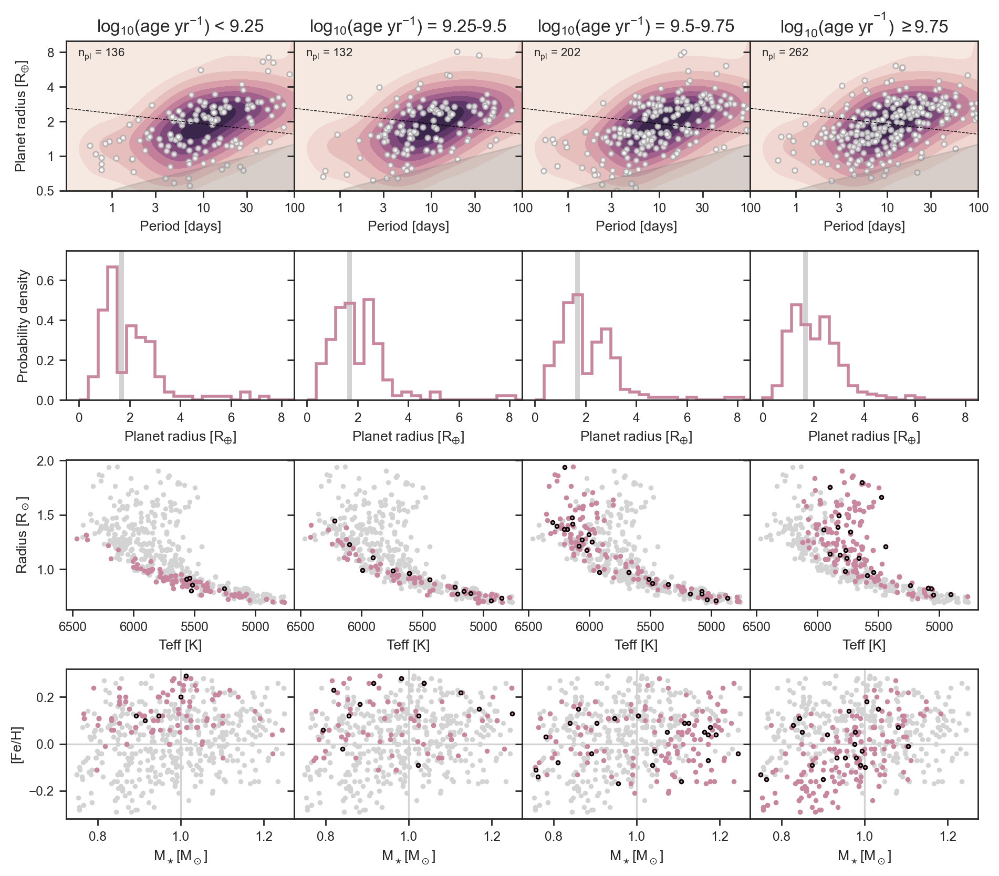

In [8]:
pr_evolution_plot(m, fig_path='../figures/pr-filtered.pdf')

### Figure 3

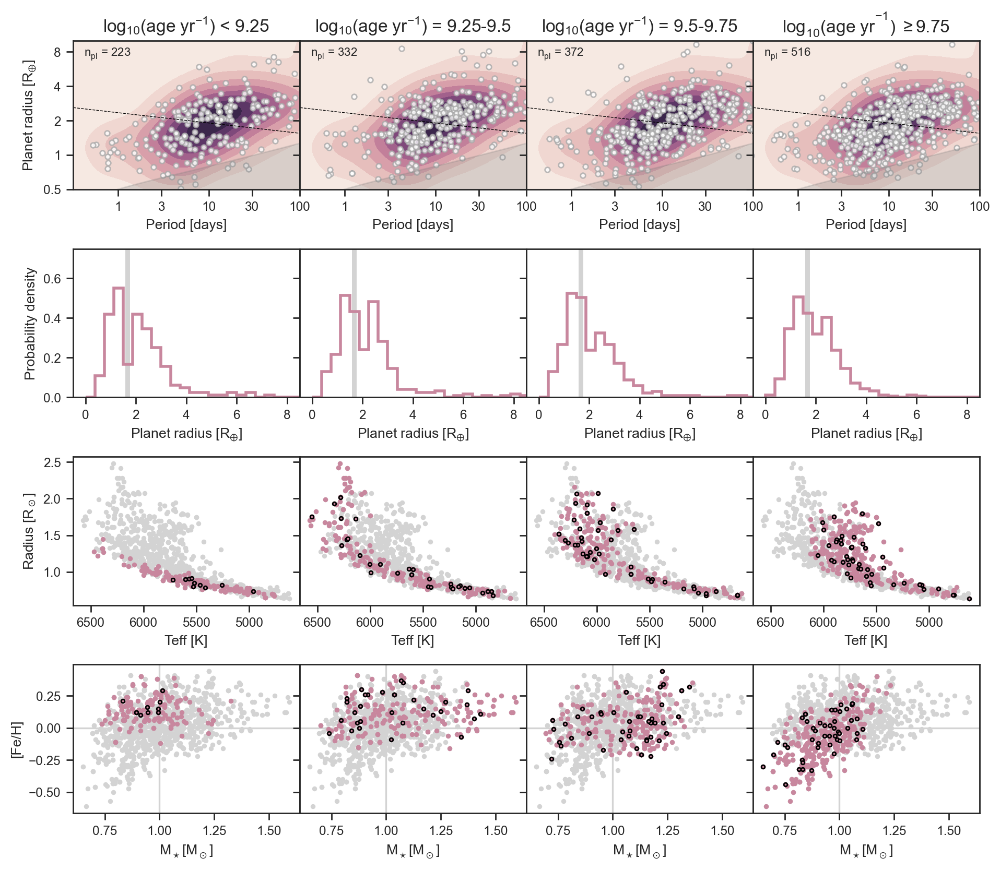

In [9]:
pr_evolution_plot(cc, fig_path='../figures/pr-base.pdf')

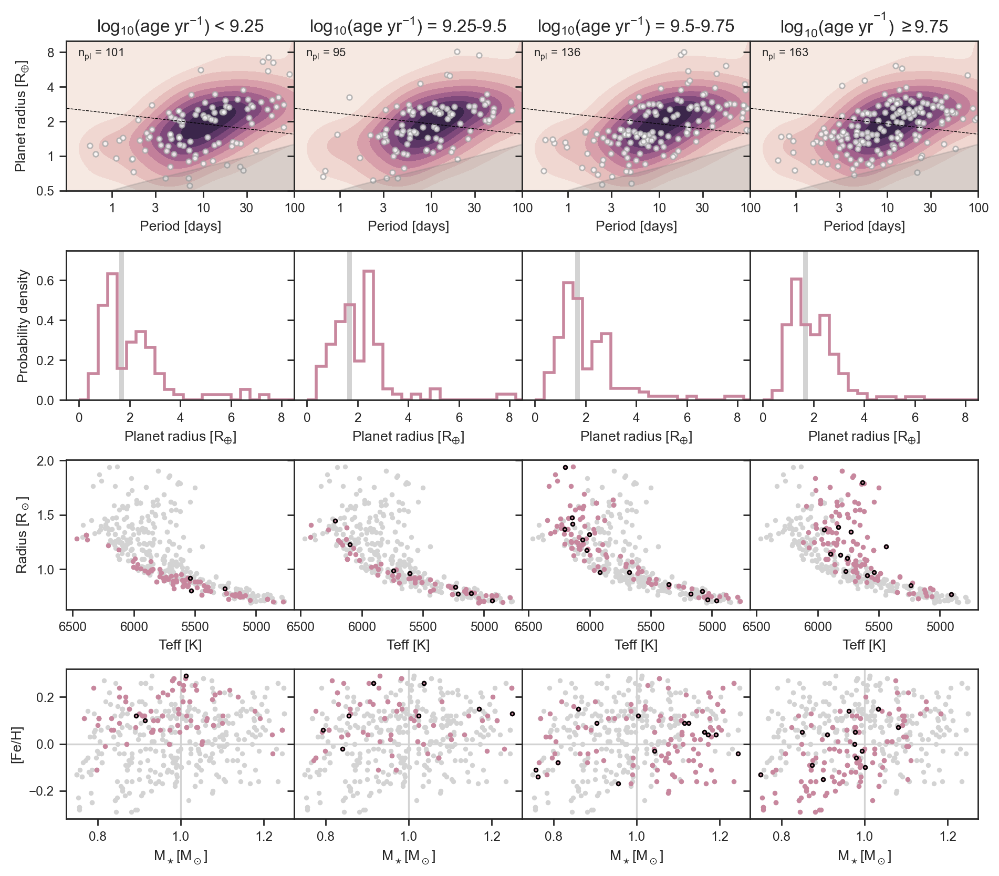

In [10]:
pr_evolution_plot(m&(cks['rp_prec']<6), fig_path='../figures/pr-filtered-precise.pdf')

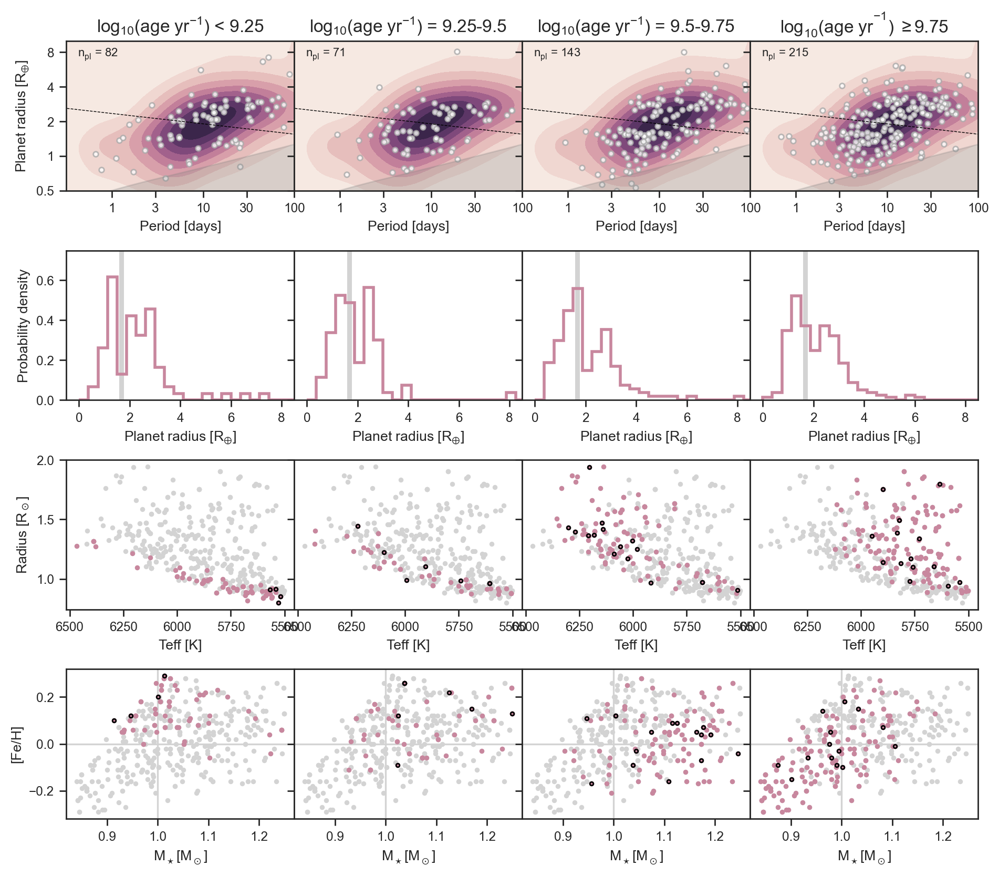

In [11]:
pr_evolution_plot(hot_stars&m, fig_path=None)

### Defining the samples for the SVC analysis (Figure 6)

Number of planets in isochrone-selected sample (1-1.8 Gyr): 156
Number of planets in isochrone-selected sample (<1.8 Gyr): 238
Number of planets in isochrone-selected hot star sample (<1.8 Gyr): 124
Number of planets in rotation-selected sample (<2.7 Gyr): 190


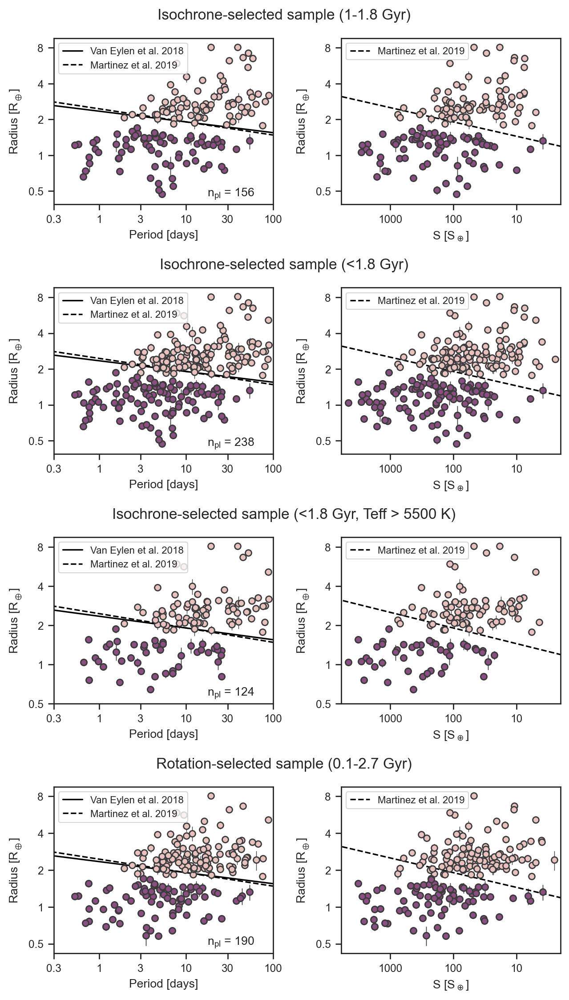

In [12]:
def v18_valley(p):
    #Van Eylen et al. 2018 radius valley in period-radius space
    log10rp = -0.09*np.log10(p)+0.37
    return 10.**log10rp

def m19_valley(p):
    #Martinez et al. 2019 radius valley in period-radius space
    log10rp = -0.11*np.log10(p)+0.39
    return 10.**log10rp

def m19_svalley(s):
    #Martinez et al. 2019 radius valley in period-insolation space
    log10rp = 0.12*np.log10(s) + 0.04
    return 10.**log10rp

def v18_valley_shifted(p):
    #Van Eylen et al. 2018 radius valley shifted, used to classify sample
    log10rp = -0.09*np.log10(p)+0.30
    return 10.**log10rp


iso_yng = common_cuts & (cks['f18_logAiso']>9.0) & (cks['f18_logAiso']<=9.25)
iso_old = common_cuts & (cks['f18_logAiso']>9.25)
iso_allyng = common_cuts & (cks['f18_logAiso']<=9.25)

iso_hot = common_cuts & (cks['f18_Teff']>5500) & (cks['f18_logAiso']<=9.25)

#Preparing isochrone-selected samples for SVC analysis
xiso, yiso, ziso = cks['f18_P'][iso_yng], cks['f18_Rp'][iso_yng], cks['f18_Sinc'][iso_yng]
exiso = [cks['f18_e_P'][iso_yng], cks['f18_E_P'][iso_yng]]
eyiso = [cks['f18_e_Rp'][iso_yng], cks['f18_E_Rp'][iso_yng]]
eziso = [cks['f18_e_Sinc'][iso_yng], cks['f18_E_Sinc'][iso_yng]]

xiso, yiso, ziso = np.array(xiso), np.array(yiso), np.array(ziso)
npl_iso = len(xiso)
print('Number of planets in isochrone-selected sample (1-1.8 Gyr):', npl_iso)

#Preparing isochrone-selected samples for SVC analysis
xiso_all, yiso_all, ziso_all = cks['f18_P'][iso_allyng], cks['f18_Rp'][iso_allyng], cks['f18_Sinc'][iso_allyng]
exiso_all = [cks['f18_e_P'][iso_allyng], cks['f18_E_P'][iso_allyng]]
eyiso_all = [cks['f18_e_Rp'][iso_allyng], cks['f18_E_Rp'][iso_allyng]]
eziso_all = [cks['f18_e_Sinc'][iso_allyng], cks['f18_E_Sinc'][iso_allyng]]

xiso_all, yiso_all, ziso_all = np.array(xiso_all), np.array(yiso_all), np.array(ziso_all)
npl_iso_all = len(xiso_all)
print('Number of planets in isochrone-selected sample (<1.8 Gyr):', npl_iso_all)

#Preparing isochrone-selected samples for SVC analysis
xhot, yhot, zhot = cks['f18_P'][iso_hot], cks['f18_Rp'][iso_hot], cks['f18_Sinc'][iso_hot]
exhot = [cks['f18_e_P'][iso_hot], cks['f18_E_P'][iso_hot]]
eyhot = [cks['f18_e_Rp'][iso_hot], cks['f18_E_Rp'][iso_hot]]
ezhot = [cks['f18_e_Sinc'][iso_hot], cks['f18_E_Sinc'][iso_hot]]

xhot, yhot, zhot = np.array(xhot), np.array(yhot), np.array(zhot)
npl_hot = len(xhot)
print('Number of planets in isochrone-selected hot star sample (<1.8 Gyr):', npl_hot)


#Preparing rotation-selected sample for SVC analysis
gyro = common_cuts & m_ruwe & (cks['f18_Teff']<6000.)

gyro_yng = gyro & (cks['prot']<curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))&\
                  (cks['prot']>curtis_teff_gyrochrone(cks['f18_Teff'], kind='pleiades-quad'))&\
                  (cks['Prot_flag']=='a')


gyro_old = gyro & (cks['prot']>=curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))
gyro_nop = gyro & (np.isnan(cks['prot']))


xgyro, ygyro, zgyro = cks['f18_P'][gyro_yng], cks['f18_Rp'][gyro_yng], cks['f18_Sinc'][gyro_yng]
exgyro = [cks['f18_e_P'][gyro_yng], cks['f18_E_P'][gyro_yng]]
eygyro = [cks['f18_e_Rp'][gyro_yng], cks['f18_E_Rp'][gyro_yng]]
ezgyro = [cks['f18_e_Sinc'][gyro_yng], cks['f18_E_Sinc'][gyro_yng]]
npl_gyro = len(xgyro)

xgyro, ygyro, zgyro = np.array(xgyro), np.array(ygyro), np.array(zgyro)


print('Number of planets in rotation-selected sample (<2.7 Gyr):', npl_gyro)


#Flags for SVC analysis
flag_iso = np.zeros(len(xiso), dtype=bool)
flag_iso[yiso<v18_valley_shifted(xiso)] = 1

flag_iso_all = np.zeros(len(xiso_all), dtype=bool)
flag_iso_all[yiso_all<v18_valley_shifted(xiso_all)] = 1

flag_hot = np.zeros(len(xhot), dtype=bool)
flag_hot[yhot<v18_valley_shifted(xhot)] = 1

flag_gyro = np.zeros(len(xgyro), dtype=bool)
flag_gyro[ygyro<v18_valley_shifted(xgyro)] = 1

xdata = [xiso, xiso_all, xhot, xgyro]
ydata = [yiso, yiso_all, yhot, ygyro]
zdata = [ziso, ziso_all, zhot, zgyro]
flags = [flag_iso, flag_iso_all, flag_hot, flag_gyro]
xerr = [exiso, exiso_all, exhot, exgyro]
yerr = [eyiso, eyiso_all, eyhot, eygyro]
zerr = [eziso, eziso_all, ezhot, ezgyro]


def sample_plot(fig_path=None):
    
    ebar_kwargs = {'rasterized':True, 'mec':'#3b3b3b', 'ecolor':'#3b3b3b', 'fmt':'o', 'lw':0.5, 'ms':5}
    
    cmap = sns.cubehelix_palette(2, light=0.8, dark=0.4, as_cmap=True)
    cpal = sns.cubehelix_palette(2, light=0.8, dark=0.4)

    sample_labels = ['Isochrone-selected sample (1-1.8 Gyr)',
                     'Isochrone-selected sample (<1.8 Gyr)',
                     'Isochrone-selected sample (<1.8 Gyr, Teff > 5500 K)',
                     'Rotation-selected sample (0.1-2.7 Gyr)']

    for i in range(4):
        plt.subplot(4,2,2*i+1)
        plt.figtext(0.5, 1.01-(0.25*i*1.02), sample_labels[i], ha='center', va='center', size=12)

        plt.plot([0.1,100],v18_valley([0.1,100]),'k', label='Van Eylen et al. 2018')    
        plt.plot([0.1,100],m19_valley([0.1,100]),'k--', label='Martinez et al. 2019')    

        plt.errorbar(xdata[i], ydata[i], xerr=xerr[i], yerr=yerr[i], color=cpal[0], **ebar_kwargs)
        plt.errorbar(xdata[i][flags[i]==1], ydata[i][flags[i]==1], 
                 xerr=[xerr[i][0][flags[i]==1], xerr[i][1][flags[i]==1]], 
                 yerr=[yerr[i][0][flags[i]==1], yerr[i][1][flags[i]==1]], color=cpal[1], **ebar_kwargs)

        plt.xlabel('Period [days]')
        plt.ylabel(r'Radius [$\mathregular{R_\oplus}$]')
        plt.loglog()

        xticks = [0.3,1,3,10,30,100]
        yticks = [0.5,1,2,4,8]

        plt.xticks(xticks, [str(xt) for xt in xticks])
        plt.yticks(yticks, [str(yt) for yt in yticks])

        plt.xlim(0.3,100)
        plt.minorticks_off()
        plt.legend(prop={'size':8})
        plt.text(0.7,0.05,
                 r'n$_\mathregular{pl}$ = '+str(int(len(xdata[i]))), transform=plt.gca().transAxes)



        plt.subplot(4,2,2*i+2)
        plt.plot([1,1e4],m19_svalley([1,1e4]),'k--', label='Martinez et al. 2019')    

        plt.errorbar(zdata[i], ydata[i], xerr=zerr[i], yerr=yerr[i], color=cpal[0], **ebar_kwargs)
        plt.errorbar(zdata[i][flags[i]==1], ydata[i][flags[i]==1], 
                 xerr=[zerr[i][0][flags[i]==1], zerr[i][1][flags[i]==1]], 
                 yerr=[yerr[i][0][flags[i]==1], yerr[i][1][flags[i]==1]], color=cpal[1], **ebar_kwargs)


        plt.xlabel(r'S [S$_\oplus$]')
        plt.ylabel(r'Radius [$\mathregular{R_\oplus}$]')
        plt.loglog()
        plt.legend(loc='upper left', prop={'size':8})

        xticks = [10,100,1000]
        yticks = [0.5,1,2,4,8]

        plt.xticks(xticks, [str(xt) for xt in xticks])
        plt.yticks(yticks, [str(yt) for yt in yticks])
        plt.xlim(6000,2)
        plt.minorticks_off()

    plt.gcf().set_size_inches(6.5,11)
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.5)
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
    
sample_plot('../figures/samples.pdf')

### Plotting the rotation-selected sample in the H-R diagram (Figure 4)

/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in log10
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in log10


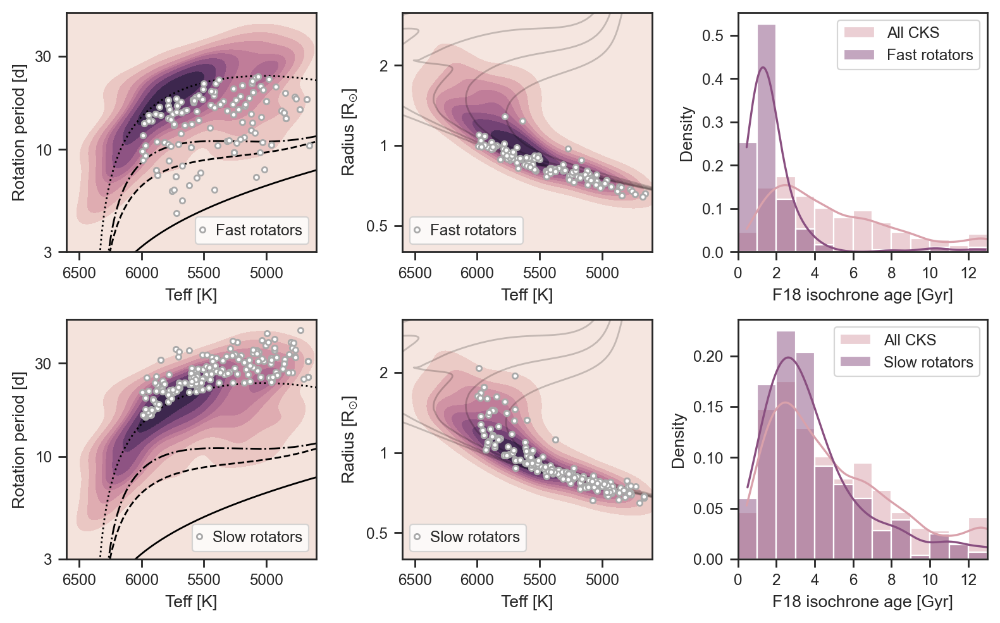

In [13]:
def gyro_hrd_plot(fig_path=None):

    smpl_labels = ['Fast rotators', 'Slow rotators']

    fig, ax = plt.subplots(nrows=2,ncols=3, figsize=(8,5))

    for i,smpl in enumerate([gyro_yng, gyro_old]):
        _ax = ax[i][0]

        #Gyrochronology diagram
        arg = (np.isfinite(cks['f18_Teff'])) & (np.isfinite(cks['Prot']))
        sns.kdeplot(x=cks['f18_Teff'][arg], y=np.log10(cks['Prot'][arg]), fill=True, thresh=0, cmap=cmap, ax=_ax)

        bprp = np.linspace(0,5,1000)
        teff = curtis_bprp_teff(bprp)

        _ax.plot(teff, np.log10(curtis_gyrochrone(bprp, kind='pleiades-quad')), 'k-', lw=1)
        _ax.plot(teff, np.log10(curtis_gyrochrone(bprp, kind='praesepe')), 'k--', lw=1)
        _ax.plot(teff, np.log10(curtis_gyrochrone(bprp, kind='ngc6811')), 'k-.', lw=1)
        _ax.plot(teff, np.log10(curtis_gyrochrone(bprp, kind='ngc6819+ruprecht147')), 'k:', lw=1)

        _ax.set_xlim(6600,4600)
        _ax.set_ylim(0.5,1.7)
        _ax.set_yticks(np.log10([3,10,30]))
        _ax.set_yticklabels(['3','10','30'])
        _ax.set_xlabel('Teff [K]')
        _ax.set_ylabel('Rotation period [d]')

        _ax.errorbar(cks['f18_Teff'][smpl], np.log10(cks['prot'][smpl]), 
                      fmt='o', color='white', mec='darkgrey', ms=3, mew=1, ecolor='darkgrey', label=smpl_labels[i])
        _ax.legend(loc='lower right', handlelength=0.1)


        #H-R diagram
        _ax = ax[i][1]
        arg = (np.isfinite(cks['f18_Teff'])) & (np.isfinite(cks['f18_R']))
        sns.kdeplot(x=cks['f18_Teff'][arg], y=np.log10(cks['f18_R'][arg]), fill=True, thresh=0, cmap=cmap, ax=_ax)

        _ax.errorbar(cks['f18_Teff'][smpl], np.log10(cks['f18_R'][smpl]), 
                      fmt='o', color='white', mec='darkgrey', ms=3, mew=1, ecolor='darkgrey', label=smpl_labels[i])


        for la in [9.,9.25,9.5,9.75,10]:
            arg = mist['log10_isochrone_age_yr']==la
            _ax.plot(10.**mist['log_Teff'][arg], mist['log_R'][arg], color='k', lw=1, alpha=0.2)

        _ax.set_ylim(-0.4,0.5)    
        _ax.set_xlim(6600,4600)
        
        _ax.set_yticks(np.log10([0.5,1,2]))
        _ax.set_yticklabels(['0.5','1','2'])    
        _ax.set_xlabel('Teff [K]')
        _ax.set_ylabel(r'Radius [R$_\mathregular{\odot}$]')
        _ax.legend(handlelength=0.1)

        #Age distributions
        _ax = ax[i][2]

        _x1 = (10.**cks['f18_logAiso'])/1.0e9
        _x2 = (10.**cks['f18_logAiso'][smpl])/1.0e9

        sns.histplot(_x1, color=tt_cpal[0], ax=_ax, kde=True, stat='density', bins=np.arange(0,14), label='All CKS')
        sns.histplot(_x2, color=tt_cpal[1], ax=_ax, kde=True, stat='density', bins=np.arange(0,14), label=smpl_labels[i])
        _ax.set_xlim(0,13)
        _ax.set_xticks(np.arange(0,14,2))
        _ax.set_xlabel('F18 isochrone age [Gyr]')
        _ax.legend()

    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
    return

gyro_hrd_plot('../figures/gyro-sample.pdf')

### Support Vector Classification analysis (Figure 7)
The code below was adapted from a [scikitlearn tutorial](https://scikit-learn.org/stable/auto_examples/svm/plot_svm_margin.html)
(Code source: Gaël Varoquaux. Modified for documentation by Jaques Grobler. License: BSD 3 clause.)

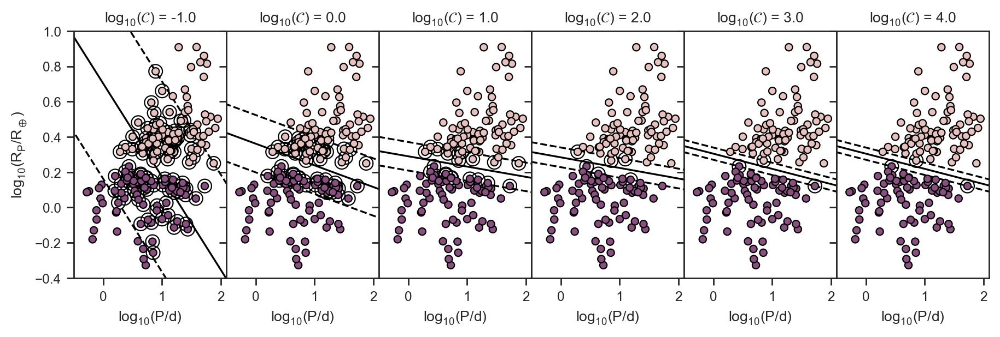

In [14]:
def regularization_plot(xdata=xiso, 
                        ydata=yiso, 
                        flag=flag_iso,
                        fig_path=None, scatter_kwargs={'rasterized': True}):
    
    cmap = sns.cubehelix_palette(2, light=0.8, dark=0.4, as_cmap=True)
    
    np.random.seed(1701)

    X = np.array([np.log10(xdata), 
                  np.log10(ydata)]).T

    Y = flag

    fignum = 1

    fig, ax = plt.subplots(nrows=1,ncols=6,figsize=(0.6*18,0.6*5),sharex=True)

    for i,penalty in enumerate([1e-1,1e0,1e1,1e2,1e3,1e4]):

        clf = svm.SVC(kernel='linear', C=penalty)
        clf.fit(X, Y)

        # Get the separating hyperplane
        w = clf.coef_[0]
        a = -w[0] / w[1]
        xx = np.linspace(-1, 2.2)
        yy = a * xx - (clf.intercept_[0]) / w[1]

        # Plot the parallels to the separating hyperplane that pass through the
        # support vectors (margin away from hyperplane in direction
        # perpendicular to hyperplane). This is sqrt(1+a^2) away vertically in
        # 2-d.
        margin = 1 / np.sqrt(np.sum(clf.coef_ ** 2))
        yy_down = yy - np.sqrt(1 + a ** 2) * margin
        yy_up = yy + np.sqrt(1 + a ** 2) * margin

        ax[i].plot(xx, yy, 'k-')
        ax[i].plot(xx, yy_down, 'k--')
        ax[i].plot(xx, yy_up, 'k--')

        ax[i].scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1], s=80,
                    facecolors='none', zorder=10, edgecolors='k', **scatter_kwargs)
        ax[i].scatter(X[:, 0], X[:, 1], c=Y, zorder=10, cmap=cmap, edgecolors='k', **scatter_kwargs)

        plt.axis('tight')
        x_min = -2
        x_max = 2
        y_min = -1
        y_max = 1

        XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j]
        Z = clf.predict(np.c_[XX.ravel(), YY.ravel()])

        # Plot result in scatter plot
        Z = Z.reshape(XX.shape)

        ax[i].set_title(r'$\mathregular{log_{10}}$($\mathcal{C}$) = '+str(np.log10(penalty)))
        ax[i].set_ylim(-0.4,1)
        ax[i].set_xlim(-0.5,2.1)
        ax[i].set_xticks([0,1,2])
        ax[i].set_xlabel(r'$\mathregular{log_{10}(P/d)}$')
        if i==0:
            ax[i].set_ylabel(r'$\mathregular{log_{10}(R_P/R_\oplus)}$')

        if i>0:
            ax[i].set_yticklabels([])

    plt.subplots_adjust(wspace=0)
    if fig_path:
        plt.savefig(fig_path)
    
    return

regularization_plot(fig_path='../figures/regularization.pdf')

### SVC with errorbars from bootstrapping (Figure 10)

Sample A (isoc_fgk_1to2)
 & 5 & $-0.09^{+0.06}_{-0.06}$ & $0.33^{+0.06}_{-0.07}$ & $0.14^{+0.01}_{-0.01}$\\
 & 10 & $-0.08^{+0.06}_{-0.04}$ & $0.31^{+0.05}_{-0.05}$ & $0.11^{+0.01}_{-0.01}$\\
 & 100 & $-0.06^{+0.02}_{-0.04}$ & $0.29^{+0.02}_{-0.04}$ & $0.07^{+0.01}_{-0.01}$\\
 & 1000 & $-0.06^{+0.02}_{-0.04}$ & $0.29^{+0.03}_{-0.03}$ & $0.06^{+0.01}_{-0.01}$\\
--------------------------------------------------------------------------------
Sample B (isoc_fgk_lt2)
 & 5 & $-0.1^{+0.07}_{-0.05}$ & $0.32^{+0.06}_{-0.06}$ & $0.14^{+0.01}_{-0.01}$\\
 & 10 & $-0.08^{+0.05}_{-0.05}$ & $0.3^{+0.04}_{-0.07}$ & $0.11^{+0.01}_{-0.01}$\\
 & 100 & $-0.07^{+0.04}_{-0.04}$ & $0.29^{+0.04}_{-0.05}$ & $0.06^{+0.01}_{-0.01}$\\
 & 1000 & $-0.08^{+0.07}_{-0.03}$ & $0.3^{+0.04}_{-0.05}$ & $0.05^{+0.01}_{-0.02}$\\
--------------------------------------------------------------------------------
Sample C (isoc_fg_lt2)
 & 5 & $-0.12^{+0.06}_{-0.06}$ & $0.32^{+0.05}_{-0.05}$ & $0.14^{+0.01}_{-0.02}$\\
 & 10 & $-

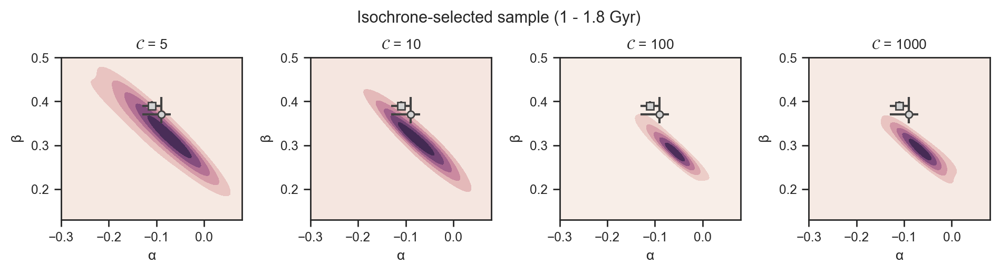

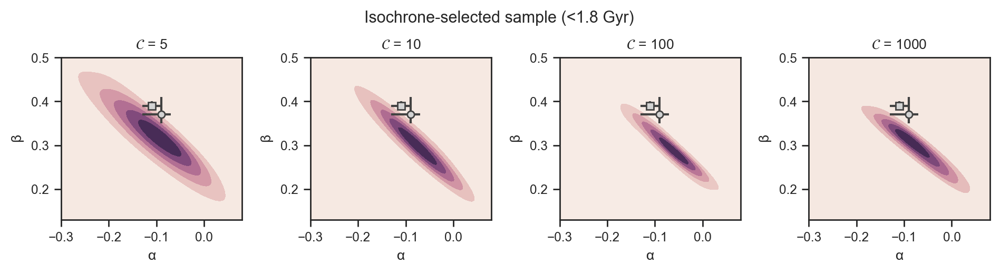

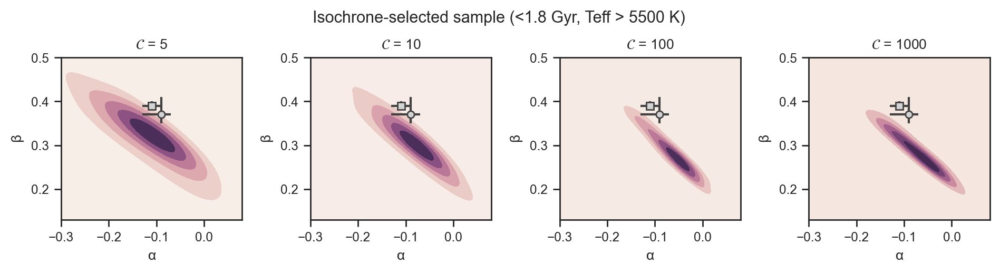

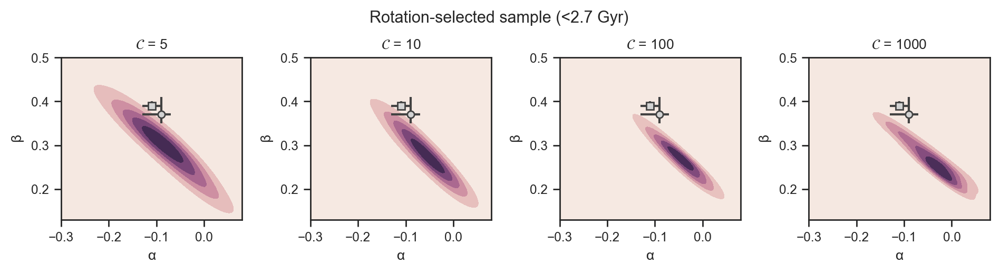

In [15]:
from sklearn.utils import resample
from astropy.stats import bootstrap

cmap = sns.cubehelix_palette(start=3, light=0.98, as_cmap=True)

def svm_analysis(xdata, ydata, flag, 
                 nboot=1000,
                 sboot=50,
                 penalty=[5,10,100,1000],
                 fig_title=None,
                 fig_path=None,
                 plot_lit='pr',
                 plot=False, 
                 xrange=(-0.3,0.08), 
                 yrange=(0.13,0.5),
                 sigfig=2):
    
    X = np.array([np.log10(xdata), np.log10(ydata)]).T
    Y = flag
    
    np.random.seed(1701)
    fig, ax = plt.subplots(nrows=1, ncols=len(penalty), figsize=(2.4*len(penalty),2.4))

    slopes = [[] for _ in range(len(penalty))]
    intercepts = [[] for _ in range(len(penalty))]
    margins = [[] for _ in range(len(penalty))]
    
    
    table_row = []
    
    for i,p in enumerate(penalty):
    
        for _ in range(nboot):

            #Resample the data with replacement
            arg = np.random.choice(len(X),sboot,replace=True)

            _X = X[arg]
            _Y = Y[arg]

            clf = svm.SVC(kernel='linear', C=p)
            clf.fit(_X, _Y)

            # Get the separating hyperplane
            w = clf.coef_[0]
            a = -w[0] / w[1]
            xx = np.linspace(-2, 2)
            yy = a * xx - (clf.intercept_[0]) / w[1]

            # Plot the parallels to the separating hyperplane that pass through the
            # support vectors (margin away from hyperplane in direction
            # perpendicular to hyperplane). This is sqrt(1+a^2) away vertically in
            # 2-d.
            margin = 1 / np.sqrt(np.sum(clf.coef_ ** 2))
            yy_down = yy - np.sqrt(1 + a ** 2) * margin
            yy_up = yy + np.sqrt(1 + a ** 2) * margin

            # Save the results
            slopes[i].append(a)
            intercepts[i].append((-clf.intercept_[0]) / w[1] ) #remember offset
            margins[i].append(np.sqrt(1 + a ** 2) * margin)    

            # Plot the line, the points, and the nearest vectors to the plane
            if plot==True:
                plt.figure(fignum, figsize=(4, 3))
                plt.clf()
                plt.plot(xx, yy, 'k-')
                plt.plot(xx, yy_down, 'k--')
                plt.plot(xx, yy_up, 'k--')

                plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1], s=80,
                            facecolors='none', zorder=10, edgecolors='k')
                plt.scatter(X[:, 0], X[:, 1], c=Y, zorder=10, cmap=plt.cm.Paired,
                            edgecolors='k')

                plt.axis('tight')
                plt.title('log10(C)='+str(np.log10(penalty)))
                plt.show()
    
    
    
        _df = pd.DataFrame({'slopes': slopes[i], 'intercepts': intercepts[i]})

        sns.kdeplot(x=_df['slopes'], y=_df['intercepts'],
                    cmap=cmap, ax=ax[i], fill='True', thresh=0, levels=7, bw_method='scott', bw_adjust=2)

        
        if plot_lit=='pr':
            #Van Eylen et al. 2018 values
            ax[i].errorbar(-0.09, 0.37, xerr=np.array([[0.04,0.02]]).T,
                           yerr=np.array([[0.02,0.04]]).T, fmt='o', mfc='lightgrey', color='#424242', lw=1.5)

            #Martinez et al. 2019 values
            ax[i].errorbar(-0.11, 0.39, xerr=np.array([[0.02,0.02]]).T,
                           yerr=np.array([[0.01,0.01]]).T, fmt='s', mfc='lightgrey', color='#424242', lw=1.5)
        elif plot_lit=='sr':
            #Martinez et al. 2019 values
            ax[i].errorbar(0.12, 0.04, xerr=np.array([[0.02,0.02]]).T,
                           yerr=np.array([[0.03,0.03]]).T, fmt='s', mfc='lightgrey', color='#424242', lw=1.5)
            
            pass

        ax[i].set_title(r'$\mathcal{C}$ = '+str(int(p)))
        ax[i].set_xlabel(r'$\mathregular{\alpha}$')
        ax[i].set_ylabel(r'$\mathregular{\beta}$')
        ax[i].set_xlim(xrange[0],xrange[1])
        ax[i].set_ylim(yrange[0],yrange[1])

        slope_err = (hpd(np.array(slopes[i]), 0.68)-np.median(slopes[i])).round(sigfig)
        intercept_err = (hpd(np.array(intercepts[i]), 0.68)-np.median(intercepts[i])).round(sigfig)
        margin_err = (hpd(np.array(margins[i]), 0.68)-np.median(margins[i])).round(sigfig)
    
        #Print LaTeX table rows
        print(' & '+ str(p)+' & $'+str(np.median(slopes[i]).round(sigfig))+'^{+'+str(slope_err[1])+'}_{'+str(slope_err[0])+'}$'+\
                         ' & $'+str(np.median(intercepts[i]).round(sigfig))+'^{+'+str(intercept_err[1])+'}_{'+str(intercept_err[0])+'}$'+\
                        ' & $'+str(np.median(margins[i]).round(sigfig))+'^{+'+str(margin_err[1])+'}_{'+str(margin_err[0])+'}$'+'\\\\')
        
    
    if fig_title:
        plt.figtext(0.5, 1.02, fig_title, ha='center', va='center', size=11)
    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    print('--'*40)
    
    return slopes, intercepts, margins

print('Sample A (isoc_fgk_1to2)')
slopes_A, intercepts_A, margins_A = svm_analysis(xdata=xiso, ydata=yiso, flag=flag_iso, fig_title='Isochrone-selected sample (1 - 1.8 Gyr)', fig_path='../figures/jointplots-a.pdf')    
print('Sample B (isoc_fgk_lt2)')
slopes_B, intercepts_B, margins_B = svm_analysis(xdata=xiso_all, ydata=yiso_all, flag=flag_iso_all, fig_title='Isochrone-selected sample (<1.8 Gyr)', fig_path='../figures/jointplots-b.pdf')
print('Sample C (isoc_fg_lt2)')
slopes_C, intercepts_C, margins_C = svm_analysis(xdata=xhot, ydata=yhot, flag=flag_hot, fig_title='Isochrone-selected sample (<1.8 Gyr, Teff > 5500 K)', fig_path='../figures/jointplots-c.pdf')
print('Sample D (gyro_gk_lt3)')
slopes_D, intercepts_D, margins_D = svm_analysis(xdata=xgyro, ydata=ygyro, flag=flag_gyro, fig_title='Rotation-selected sample (<2.7 Gyr)', fig_path='../figures/jointplots-d.pdf')

### Repeat analysis for insolation-radius plane

Sample A (isoc_fgk_1to2)
 & 5 & $0.06^{+0.04}_{-0.05}$ & $0.13^{+0.12}_{-0.06}$ & $0.14^{+0.01}_{-0.01}$\\
 & 10 & $0.06^{+0.03}_{-0.04}$ & $0.13^{+0.11}_{-0.04}$ & $0.11^{+0.01}_{-0.01}$\\
 & 100 & $0.04^{+0.02}_{-0.03}$ & $0.15^{+0.04}_{-0.06}$ & $0.07^{+0.01}_{-0.01}$\\
 & 1000 & $0.04^{+0.04}_{-0.01}$ & $0.15^{+0.04}_{-0.08}$ & $0.05^{+0.01}_{-0.01}$\\
--------------------------------------------------------------------------------
Sample B (isoc_fgk_lt2)
 & 5 & $0.08^{+0.04}_{-0.05}$ & $0.07^{+0.1}_{-0.09}$ & $0.14^{+0.01}_{-0.01}$\\
 & 10 & $0.06^{+0.04}_{-0.04}$ & $0.11^{+0.08}_{-0.07}$ & $0.11^{+0.01}_{-0.01}$\\
 & 100 & $0.04^{+0.04}_{-0.03}$ & $0.15^{+0.06}_{-0.06}$ & $0.06^{+0.01}_{-0.01}$\\
 & 1000 & $0.05^{+0.02}_{-0.04}$ & $0.13^{+0.08}_{-0.07}$ & $0.05^{+0.01}_{-0.02}$\\
--------------------------------------------------------------------------------
Sample C (isoc_fg_lt2)
 & 5 & $0.09^{+0.05}_{-0.05}$ & $0.02^{+0.15}_{-0.11}$ & $0.15^{+0.01}_{-0.02}$\\
 & 10 & $0.07^{+0

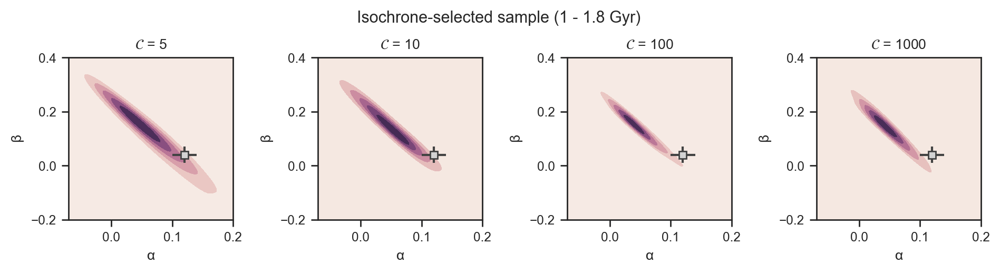

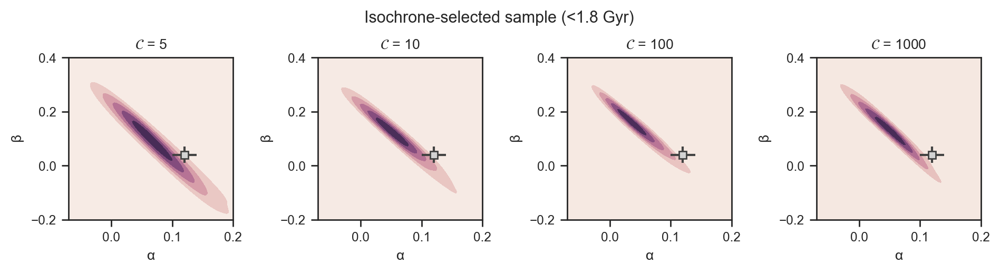

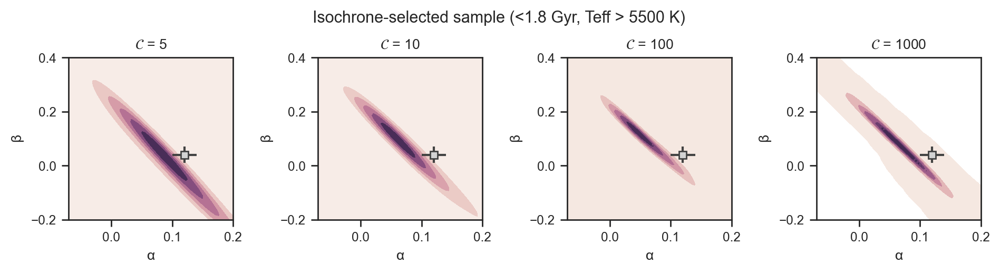

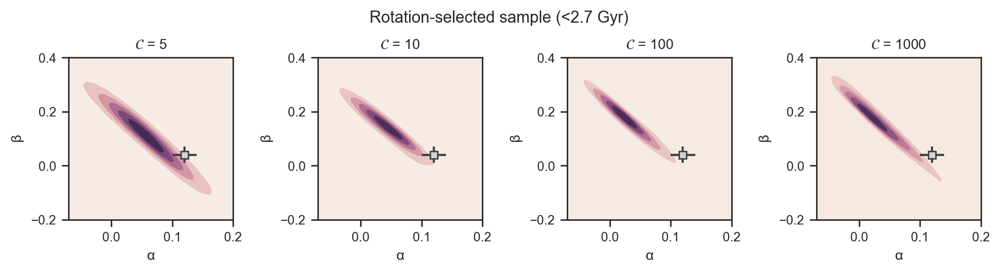

In [16]:
print('Sample A (isoc_fgk_1to2)')
slopes_AA, intercepts_AA, margins_AA = svm_analysis(xdata=ziso, 
                                                    ydata=yiso, 
                                                    flag=flag_iso, 
                                                    fig_title='Isochrone-selected sample (1 - 1.8 Gyr)', 
                                                    plot_lit='sr', xrange=(-0.07,0.2), yrange=(-0.2,0.4))    

print('Sample B (isoc_fgk_lt2)')
slopes_BB, intercepts_BB, margins_BB = svm_analysis(xdata=ziso_all, 
                                                    ydata=yiso_all, 
                                                    flag=flag_iso_all, 
                                                    fig_title='Isochrone-selected sample (<1.8 Gyr)', 
                                                    plot_lit='sr', xrange=(-0.07,0.2), yrange=(-0.2,0.4))    

print('Sample C (isoc_fg_lt2)')
slopes_CC, intercepts_CC, margins_CC = svm_analysis(xdata=zhot, 
                                                    ydata=yhot, 
                                                    flag=flag_hot, 
                                                    fig_title='Isochrone-selected sample (<1.8 Gyr, Teff > 5500 K)', 
                                                    plot_lit='sr', xrange=(-0.07,0.2), yrange=(-0.2,0.4))    

print('Sample D (gyro_gk_lt3)')
slopes_DD, intercepts_DD, margins_DD = svm_analysis(xdata=zgyro, 
                                                    ydata=ygyro, 
                                                    flag=flag_gyro, 
                                                    fig_title='Rotation-selected sample (<2.7 Gyr)', 
                                                    plot_lit='sr', xrange=(-0.07,0.2), yrange=(-0.2,0.4))    


### Plot the results of the SVM bootstrapping simulations (Figure 8)

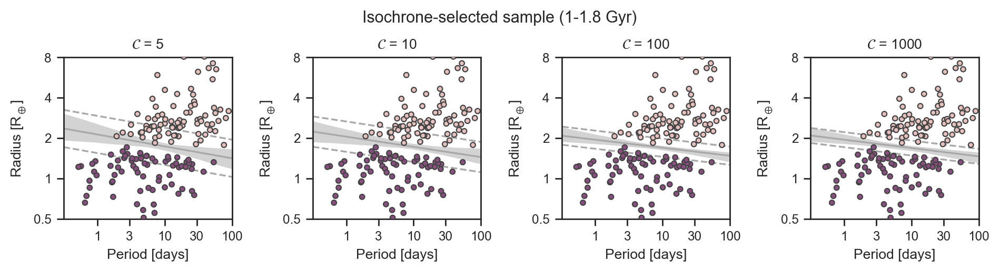

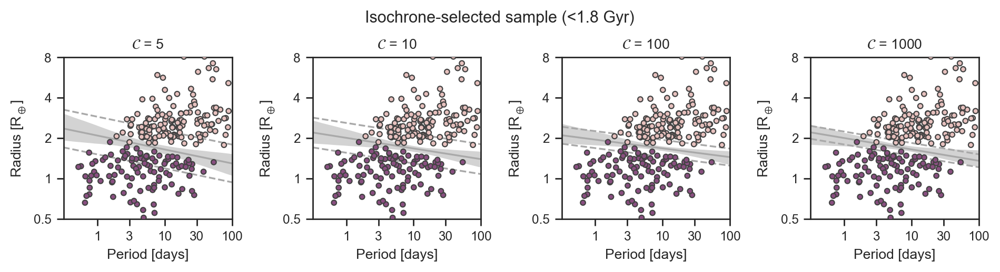

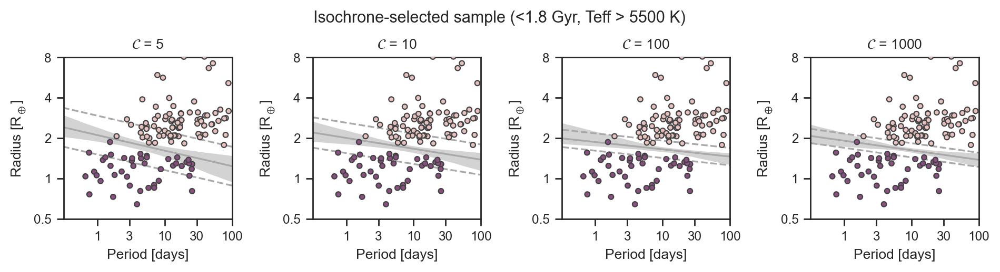

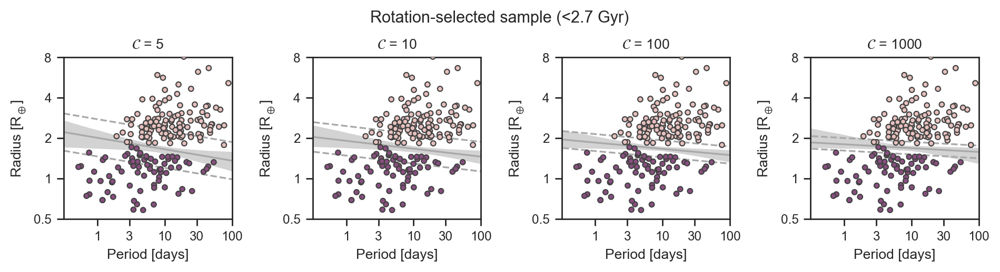

In [17]:
def plot_results(xdata, ydata, flag, 
                 slopes, intercepts, margins,
                 penalty=[5,10,100,1000],
                 xaxis='period',
                 plot_median=True,
                 plot_margins=True,
                 plot_lit=False,
                 fig_title=None,
                 fig_path=None,
                 scatter_kwargs={'rasterized':True}):
    
    #Function for plotting the results of the SVM bootstrapping analysis
    tt_cmap = sns.cubehelix_palette(2, light=0.8, dark=0.4, as_cmap=True)

    
    X = np.array([np.log10(xdata), np.log10(ydata)]).T
    Y = flag

    if xaxis=='period':
        xx = np.linspace(-2,2)
        xmin,xmax = -0.5,2
        xlabel = 'Period [days]'
        xticks = (np.log10([1,3,10,30,100]), ['1','3','10','30','100'])
    elif xaxis=='insolation':
        xx = np.linspace(-2,4)
        xmin,xmax = 3.9,0
        xlabel = 'S [S$_\mathregular{\oplus}$]'
        xticks = (np.log10([1,10,100,1000]), ['1','10','100','1000'])
    
    fig, ax = plt.subplots(nrows=1,ncols=len(penalty),
                           figsize=(2.4*len(penalty),2.4))

    for i,p in enumerate(penalty):

        _slopes = slopes[:][i]
        _intercepts = intercepts[:][i]
        _margins = margins[:][i]

        yy = np.zeros([len(_slopes), len(xx)])
        for j in range(len(_slopes)):
            yy[j,:] = xx*_slopes[j] + _intercepts[j]

        ax[i].fill_between(xx, 
                         np.percentile(yy, 16., axis=0), 
                         np.percentile(yy, 84., axis=0), color='lightgrey')

        if plot_median==True:
            ax[i].plot(xx, np.median(_slopes)*xx + np.median(_intercepts), color='darkgrey')
        else:
            pass


        #Plot margins
        if plot_margins==True:
            ax[i].plot(xx, np.median(_slopes)*xx + np.median(_intercepts) + np.sqrt(1+np.median(_slopes)**2) * np.median(_margins), '--', color='darkgrey')
            ax[i].plot(xx, np.median(_slopes)*xx + np.median(_intercepts) - np.sqrt(1+np.median(_slopes)**2) * np.median(_margins), '--', color='darkgrey')
        else:
            pass


        ax[i].scatter(X[:, 0], 
                      X[:, 1], 
                      c=Y, 
                      s=12, 
                      zorder=10, 
                      cmap=tt_cmap,
                      edgecolors='#424242',
                      **scatter_kwargs)

        ax[i].set_xlabel(xlabel)
        ax[i].set_ylabel(r'Radius [$\mathregular{R_\oplus}$]')
        ax[i].set_xticks(xticks[0])
        ax[i].set_xticklabels(xticks[1])
        ax[i].set_yticks(np.log10([0.5,1,2,4,8]))
        ax[i].set_yticklabels(['0.5','1','2','4','8'])

        #Van Eylen 2018 RV
        if plot_lit==True:
            ax[i].plot(np.log10([0.1,100]),np.log10(v18_valley([0.1,100])),'k')
        else:
            pass

        ax[i].set_xlim(xmin,xmax)
        #ax[i].set_xlim(xdata.min()-0.5,xdata.max()+0.5)
        ax[i].set_ylim(np.log10(0.5),np.log10(8))
        ax[i].set_title(r'$\mathcal{C}$ = '+str(p))

    if fig_title:
        plt.figtext(0.5, 1.02, fig_title, ha='center', va='center', size=11)
    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    return

plot_results(xdata=xiso, ydata=yiso, flag=flag_iso, 
             slopes=slopes_A, intercepts=intercepts_A, margins=margins_A, 
             fig_title='Isochrone-selected sample (1-1.8 Gyr)', fig_path='../figures/errors-a.pdf')    

plot_results(xdata=xiso_all, ydata=yiso_all, flag=flag_iso_all, 
             slopes=slopes_B, intercepts=intercepts_B, margins=margins_B, 
             fig_title='Isochrone-selected sample (<1.8 Gyr)', fig_path='../figures/errors-b.pdf')    

plot_results(xdata=xhot, ydata=yhot, flag=flag_hot, slopes=slopes_C, 
             intercepts=intercepts_C, margins=margins_C, 
             fig_title='Isochrone-selected sample (<1.8 Gyr, Teff > 5500 K)', fig_path='../figures/errors-c.pdf')    

plot_results(xdata=xgyro, ydata=ygyro, flag=flag_gyro, slopes=slopes_D, 
             intercepts=intercepts_D, margins=margins_D, 
             fig_title='Rotation-selected sample (<2.7 Gyr)', fig_path='../figures/errors-d.pdf')    

### Insolation-radius plane (Figure 9)

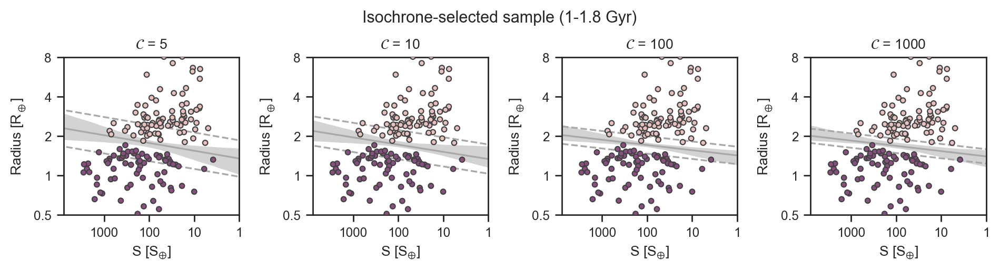

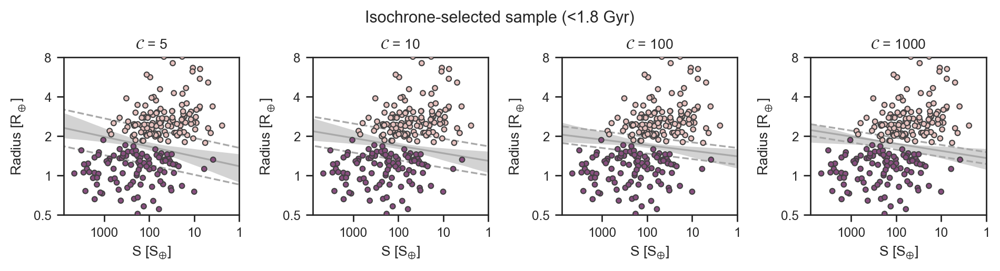

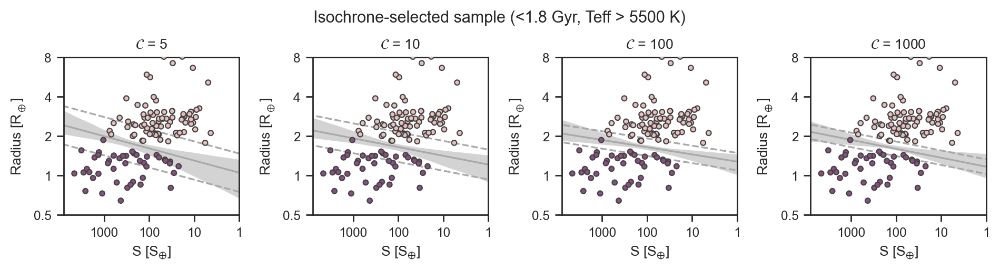

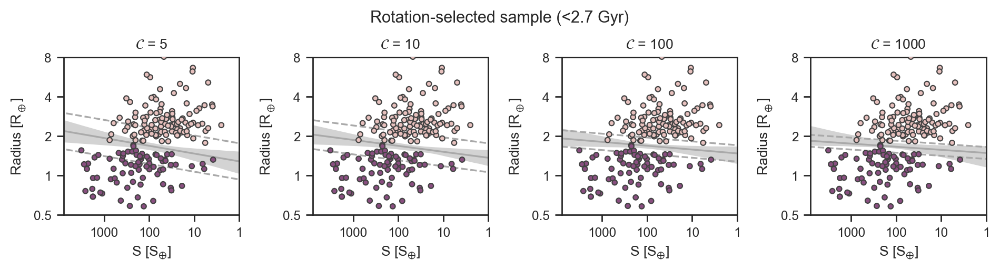

In [18]:
plot_results(xdata=ziso, ydata=yiso, flag=flag_iso, 
             slopes=slopes_AA, intercepts=intercepts_AA, margins=margins_AA, 
             fig_title='Isochrone-selected sample (1-1.8 Gyr)', 
             fig_path='../figures/serrors-a.pdf',
             xaxis='insolation')

plot_results(xdata=ziso_all, ydata=yiso_all, flag=flag_iso_all, 
             slopes=slopes_BB, intercepts=intercepts_BB, margins=margins_BB, 
             fig_title='Isochrone-selected sample (<1.8 Gyr)', 
             fig_path='../figures/serrors-b.pdf',
             xaxis='insolation')

plot_results(xdata=zhot, ydata=yhot, flag=flag_hot, 
             slopes=slopes_CC, intercepts=intercepts_CC, margins=margins_CC, 
             fig_title='Isochrone-selected sample (<1.8 Gyr, Teff > 5500 K)', 
             fig_path='../figures/serrors-c.pdf',
             xaxis='insolation')

plot_results(xdata=zgyro, ydata=ygyro, flag=flag_gyro, 
             slopes=slopes_DD, intercepts=intercepts_DD, margins=margins_DD, 
             fig_title='Rotation-selected sample (<2.7 Gyr)', 
             fig_path='../figures/serrors-d.pdf',
             xaxis='insolation')

### Functions for plotting margins.
These will be called numerous times

In [19]:
def upper_margin(logp, sample='A', reg=3):
    #isoc_fgk_1to2
    if sample=="A":
        smed = np.median(slopes_A[:][reg])
        imed = np.median(intercepts_A[:][reg])
        mmed = np.median(margins_A[:][reg])        
    #isoc_fgk_lt2
    elif sample=="B":
        smed = np.median(slopes_B[:][reg])
        imed = np.median(intercepts_B[:][reg])
        mmed = np.median(margins_B[:][reg])                
    #isoc_fg_lt2
    elif sample=="C":
        smed = np.median(slopes_C[:][reg])
        imed = np.median(intercepts_C[:][reg])
        mmed = np.median(margins_C[:][reg])
    #gyro_gk_lt3
    elif sample=="D":
        smed = np.median(slopes_D[:][reg])
        imed = np.median(intercepts_D[:][reg])
        mmed = np.median(margins_D[:][reg])        
    
    return smed*logp + imed + np.sqrt(1+smed**2) * mmed

def lower_margin(logp, sample='A', reg=3):
    #isoc_fgk_1to2
    if sample=="A":
        smed = np.median(slopes_A[:][reg])
        imed = np.median(intercepts_A[:][reg])
        mmed = np.median(margins_A[:][reg])        
    #isoc_fgk_lt2
    elif sample=="B":
        smed = np.median(slopes_B[:][reg])
        imed = np.median(intercepts_B[:][reg])
        mmed = np.median(margins_B[:][reg])                
    #isoc_fg_lt2
    elif sample=="C":
        smed = np.median(slopes_C[:][reg])
        imed = np.median(intercepts_C[:][reg])
        mmed = np.median(margins_C[:][reg])
    #gyro_gk_lt3    
    elif sample=="D":
        smed = np.median(slopes_D[:][reg])
        imed = np.median(intercepts_D[:][reg])
        mmed = np.median(margins_D[:][reg])        
    
    return smed*logp + imed - np.sqrt(1+smed**2) * mmed

### Effect of regularization parameter on the margins of the radius valley (Figure 11)

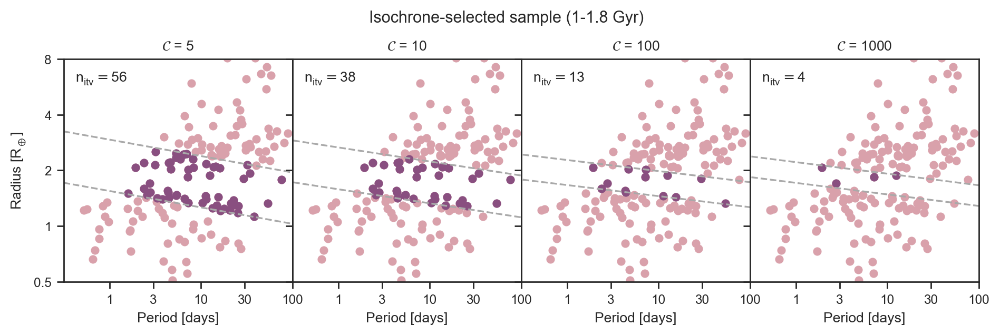

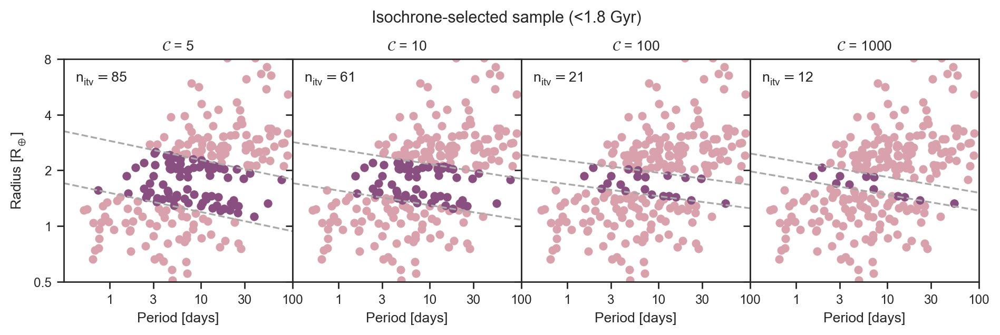

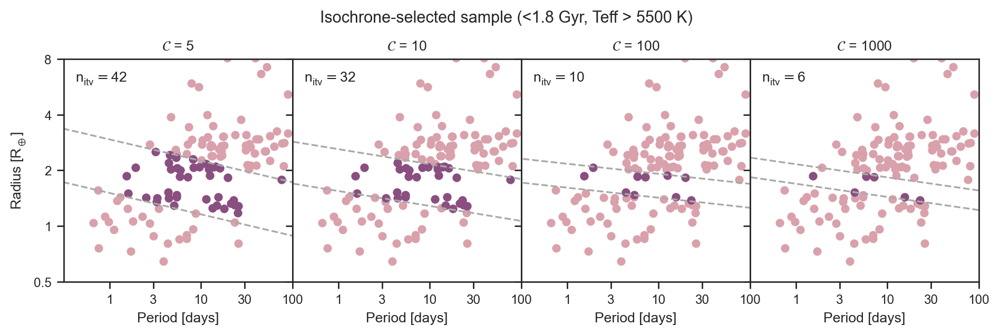

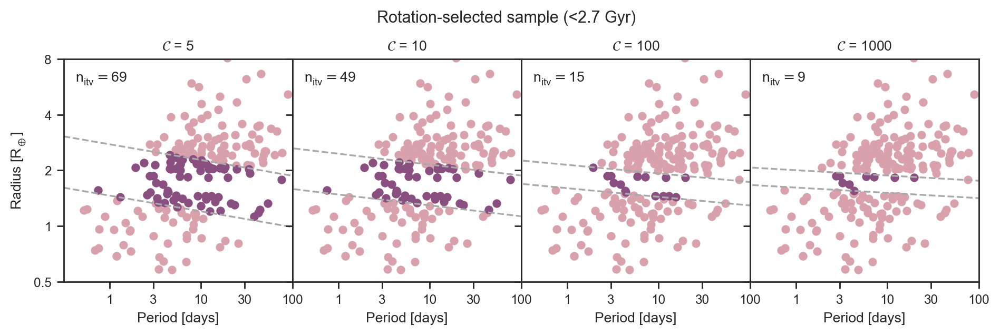

In [20]:
def plot_margins(xdata, 
                 ydata, 
                 slopes, 
                 intercepts, 
                 margins, 
                 penalty=[5,10,100,1000],
                 fig_title=None,
                 fig_path=None,
                 scatter_kwargs={'rasterized':True}):
    
    xx = np.linspace(-2,2)
    npl_itv = np.zeros(len(penalty))
    
    fig, ax = plt.subplots(nrows=1,ncols=len(penalty),
                       figsize=(2.8*len(penalty),2.8), sharey=True)

    for i,p in enumerate(penalty):

        _slopes = slopes[:][i]
        _intercepts = intercepts[:][i]
        _margins = margins[:][i]

        smed = np.median(_slopes)
        imed = np.median(_intercepts)
        mmed = np.median(_margins)

        def up_margin(logp):
            return smed*logp + imed + np.sqrt(1+smed**2) * mmed

        def lo_margin(logp):
            return smed*logp + imed - np.sqrt(1+smed**2) * mmed

        in_the_valley = (np.log10(ydata)>lo_margin(np.log10(xdata))) & (np.log10(ydata)<up_margin(np.log10(xdata)))

        #Record the number of planets in the valley
        npl_itv[i] = len(xdata[in_the_valley])

        ax[i].plot(np.log10(xdata),np.log10(ydata),'o', color=tt_cpal[0], **scatter_kwargs)
        ax[i].plot(np.log10(xdata[in_the_valley]),np.log10(ydata[in_the_valley]),'o', color=tt_cpal[1], **scatter_kwargs)

        ax[i].plot(xx, np.median(_slopes)*xx + np.median(_intercepts) + np.sqrt(1+np.median(_slopes)**2) * np.median(_margins), '--', color='darkgrey')
        ax[i].plot(xx, np.median(_slopes)*xx + np.median(_intercepts) - np.sqrt(1+np.median(_slopes)**2) * np.median(_margins), '--', color='darkgrey')
        ax[i].set_xlim(-0.5,2)
        ax[i].set_ylim(np.log10(0.5),np.log10(8))

        ax[i].set_xticks(np.log10([1,3,10,30,100]))
        ax[i].set_xticklabels(['1','3','10','30','100'])
        ax[i].set_yticks(np.log10([0.5,1,2,4,8]))
        if i==0:
            ax[i].set_yticklabels(['0.5','1','2','4','8'])
            ax[i].set_ylabel(r'Radius [$\mathregular{R_\oplus}$]')

        ax[i].set_xlabel('Period [days]')
        ax[i].set_title(r'$\mathcal{C}$ = '+str(p))
        ax[i].text(0.05,0.9,r'$\mathregular{n_{itv}} = $'+str(int(npl_itv[i])), transform=ax[i].transAxes)

    plt.subplots_adjust(wspace=0)
    if fig_title:
        plt.figtext(0.5, 1.02, fig_title, ha='center', va='center', size=11)
    if fig_path:
        plt.savefig(fig_path)
    plt.show()

    return npl_itv


nitv_iso = plot_margins(xiso, yiso, slopes_A, intercepts_A, margins_A, 
                        fig_title='Isochrone-selected sample (1-1.8 Gyr)',
                        fig_path='../figures/margins-a.pdf')

nitv_iso_all = plot_margins(xiso_all, yiso_all, slopes_B, intercepts_B, margins_B, 
                            fig_title='Isochrone-selected sample (<1.8 Gyr)',
                            fig_path='../figures/margins-b.pdf')

nitv_hot = plot_margins(xhot, yhot, slopes_C, intercepts_C, margins_C, 
                         fig_title='Isochrone-selected sample (<1.8 Gyr, Teff > 5500 K)',
                         fig_path='../figures/margins-c.pdf')

nitv_gyro = plot_margins(xgyro, ygyro, slopes_D, intercepts_D, margins_D, 
                         fig_title='Rotation-selected sample (<2.7 Gyr)',
                         fig_path='../figures/margins-d.pdf')

### The period-radius diagram from a gyrochronology analysis (Figure 5)

/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


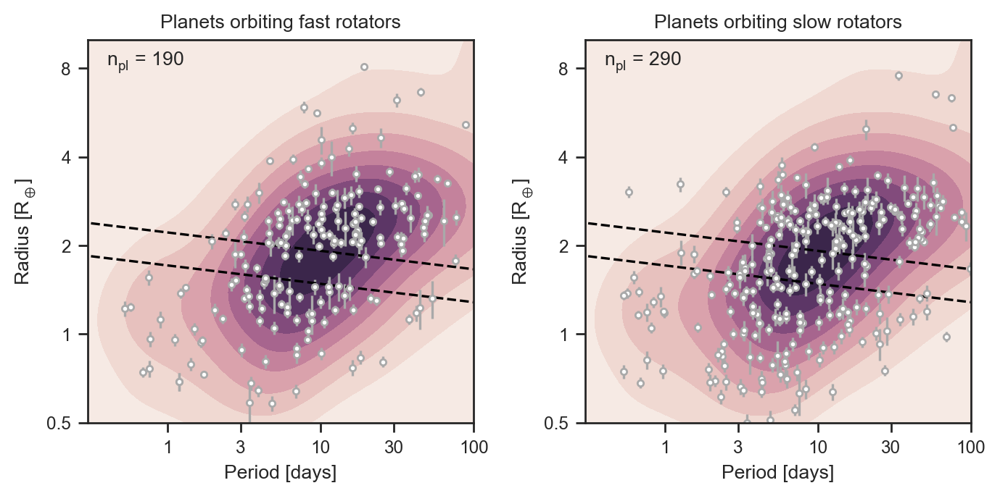

In [21]:
# def upper_margin(p):
#     smed = np.median(slopes_A[3][:])
#     imed = np.median(intercepts_A[3][:])
#     mmed = np.median(margins_A[3][:])
#     return smed*p + imed + np.sqrt(1+smed**2) * mmed

# def lower_margin(p):
#     smed = np.median(slopes_A[3][:])
#     imed = np.median(intercepts_A[3][:])
#     mmed = np.median(margins_A[3][:])    
#     return smed*p + imed - np.sqrt(1+smed**2) * mmed            

def gyro_period_radius(fig_path=None):
    
    cmap = sns.cubehelix_palette(start=3, light=0.95, as_cmap=True)

    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(7,3.5))

    #Examining the radius distribution of the young planets
    _x, _y = np.log10(cks['f18_P']), np.log10(cks['f18_Rp'])
    _yerr = [_y-np.log10(cks['f18_Rp']-cks['f18_e_Rp']), np.log10(cks['f18_Rp']+cks['f18_E_Rp'])-_y]
    _m = (np.isfinite(_x))&(np.isfinite(_y))


    for i,smpl in enumerate([gyro_yng, gyro_old]):
        _ax = ax[i]


        sns.kdeplot(x=_x[_m], y=_y[_m], fill=True, thresh=0, cmap=cmap, ax=_ax)

        _ax.errorbar(_x[smpl], _y[smpl], yerr=[_yerr[0][smpl], _yerr[1][smpl]], 
                 fmt='o', color='white', mec='darkgrey', ms=3, mew=1, ecolor='darkgrey')

        _ax.set_xlabel('Period [days]')
        _ax.set_ylabel(r'Radius [$\mathregular{R_\oplus}$]')


        _ax.set_xticks(np.log10([1,3,10,30,100]))
        _ax.set_xticklabels(['1','3','10','30','100'])


        _ax.set_yticks(np.log10([0.5,1,2,4,8]))
        _ax.set_yticklabels(['0.5','1','2','4','8'])

        _ax.set_xlim(np.log10(0.3),2)
        _ax.set_ylim(np.log10(0.5),1)

        _ax.plot(np.log10([0.1,100]),upper_margin(np.log10([0.1,100])), 'k--')
        _ax.plot(np.log10([0.1,100]),lower_margin(np.log10([0.1,100])), 'k--')
        _ax.text(np.log10(0.4), np.log10(8.2), r"$\mathregular{n_{pl}}$ = "+str(int(len(_x[smpl]))))


    ax[0].set_title('Planets orbiting fast rotators')
    ax[1].set_title('Planets orbiting slow rotators')

    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
    return

gyro_period_radius('../figures/pr-gyro.pdf')

### Figure 12: How many planets are in the valley as a function of bin width and center?

In [22]:
from tqdm import tqdm

def occupancy_grid(parameter, nbins=50):
    
    if parameter=='age':
        par = cks['f18_logAiso']
        bin_centers = np.linspace(8.5,10.5,nbins)
        bin_widths  = np.linspace(0.1,1,nbins)
    elif parameter=='mass':
        par = cks['f18_Miso']
        bin_centers = np.linspace(0.5,1.6,nbins)
        bin_widths  = np.linspace(0.05,0.2,nbins)
    elif parameter=='feh':
        par = cks['f18_[Fe/H]']
        bin_centers = np.linspace(-0.6,0.5,nbins)
        bin_widths  = np.linspace(0.02,0.2,nbins)        
        
    cen,wid = np.meshgrid(bin_centers, bin_widths)
    nitv = np.zeros([nbins,nbins])
    fitv = np.zeros([nbins,nbins])

    for i in tqdm(range(len(bin_centers))):
        for j in range(len(bin_widths)):
        
            mask = m_disp & m_period & m_rp & m_rperr &\
                   (par>=cen[i,j]-wid[i,j])&(par<cen[i,j]+wid[i,j])

            x,y = np.array(cks['f18_P'][mask]), np.array(cks['f18_Rp'][mask])

            arg = (np.log10(y)>lower_margin(np.log10(x))) & (np.log10(y)<upper_margin(np.log10(x)))
            try:
                fitv[i,j] = len(y[arg])/len(y)
            except:
                fitv[i,j] = np.nan

            if len(y[arg])>0:
                nitv[i,j] = len(y[arg])
            else:
                nitv[i,j] = np.nan
                
    return fitv, nitv, cen, wid


fitv_age, nitv_age, cen_age, wid_age = occupancy_grid("age")
fitv_mass, nitv_mass, cen_mass, wid_mass = occupancy_grid("mass")
fitv_feh, nitv_feh, cen_feh, wid_feh = occupancy_grid("feh")

100%|██████████| 50/50 [00:04<00:00, 11.71it/s]


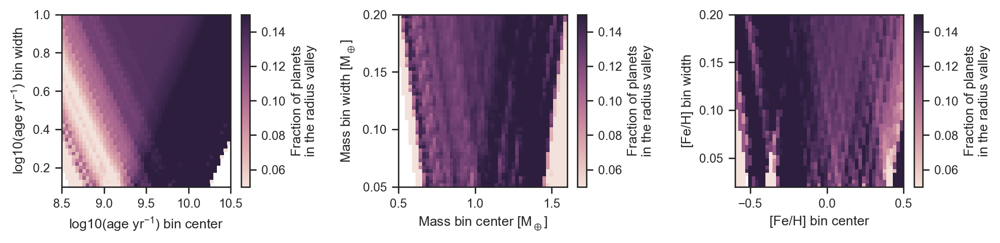

In [23]:
def plot_occupancy_grids(cen_age, wid_age, fitv_age,
                         cen_mass, wid_mass, fitv_mass,
                         cen_feh, wid_feh, fitv_feh, fig_path=None, vmin=0.05, vmax=0.15):
    
    cmap = sns.cubehelix_palette(start=3, light=0.9, as_cmap=True)
    
    plt.subplot(131)
    plt.pcolormesh(cen_age, wid_age, fitv_age, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.colorbar(label="Fraction of planets\nin the radius valley")
    plt.xlabel(r"log10(age yr$^\mathregular{-1}$) bin center")
    plt.ylabel(r"log10(age yr$^\mathregular{-1}$) bin width")
    
    plt.subplot(132)
    plt.pcolormesh(cen_mass, wid_mass, fitv_mass, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.colorbar(label="Fraction of planets\nin the radius valley")
    plt.xlabel(r"Mass bin center $\mathregular{[M_\oplus]}$")
    plt.ylabel(r"Mass bin width $\mathregular{[M_\oplus]}$")
    
    plt.subplot(133)
    plt.pcolormesh(cen_feh, wid_feh, fitv_feh, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.colorbar(label="Fraction of planets\nin the radius valley")
    plt.xlabel(r"[Fe/H] bin center")
    plt.ylabel(r"[Fe/H] bin width")    
    
    plt.gcf().set_size_inches(10,2.5)
    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
    
    return

plot_occupancy_grids(cen_age, wid_age, fitv_age,
                     cen_mass, wid_mass, fitv_mass,
                     cen_feh, wid_feh, fitv_feh, fig_path='../figures/binning.pdf')

### Histogram plot (Figure 13)

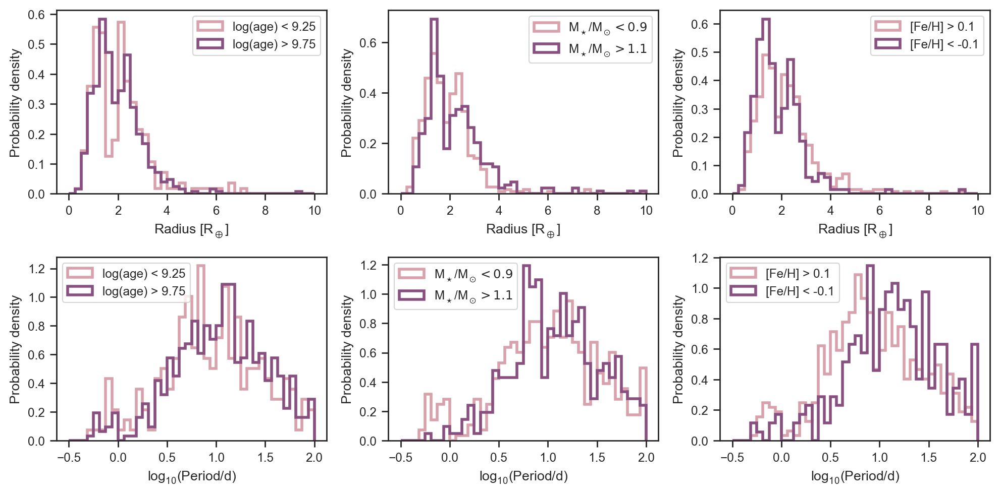

In [24]:
def hist_plot(fig_path=None):

    fig,(ax1,ax2) = plt.subplots(nrows=2,ncols=3, figsize=(10,5))
    rpl = cks['f18_Rp'] #- 10.**(-0.08*np.log10(cks['f18_P']) + 0.31)
    ppl = np.log10(cks['f18_P'])
    rpl_bins = np.linspace(0,10,41)
    ppl_bins = np.linspace(-0.5,2,41)
    hist_kwargs = {'histtype': 'step', 'density': True, 'lw': 2}

    feh_lo, feh_hi = -0.1, 0.1
    age_lo, age_hi = 9.25, 9.75
    mass_lo, mass_hi = 0.9, 1.1

    ax1[0].hist(rpl[common_cuts&(cks['f18_logAiso']<age_lo)], rpl_bins, color=tt_cpal[0], label='log(age) < 9.25', **hist_kwargs)
    ax1[0].hist(rpl[common_cuts&(cks['f18_logAiso']>age_hi)], rpl_bins,color=tt_cpal[1], label='log(age) > 9.75', **hist_kwargs)


    ax1[1].hist(rpl[common_cuts&(cks['f18_Miso']<mass_lo)], rpl_bins, color=tt_cpal[0], label=r'$\mathregular{M_\star/M_\odot} < 0.9$', **hist_kwargs)
    ax1[1].hist(rpl[common_cuts&(cks['f18_Miso']>mass_hi)], rpl_bins,color=tt_cpal[1], label=r'$\mathregular{M_\star/M_\odot} > 1.1$', **hist_kwargs)


    ax1[2].hist(rpl[common_cuts&(cks['f18_[Fe/H]']>feh_hi)], rpl_bins, color=tt_cpal[0], label='[Fe/H] > 0.1', **hist_kwargs)
    ax1[2].hist(rpl[common_cuts&(cks['f18_[Fe/H]']<feh_lo)], rpl_bins,color=tt_cpal[1],  label='[Fe/H] < -0.1', **hist_kwargs)

    ax2[0].hist(ppl[common_cuts&(cks['f18_logAiso']<age_lo)], ppl_bins, color=tt_cpal[0], label='log(age) < 9.25', **hist_kwargs)
    ax2[0].hist(ppl[common_cuts&(cks['f18_logAiso']>age_hi)], ppl_bins,color=tt_cpal[1], label='log(age) > 9.75', **hist_kwargs)

    ax2[1].hist(ppl[common_cuts&(cks['f18_Miso']<mass_lo)], ppl_bins, color=tt_cpal[0], label=r'$\mathregular{M_\star/M_\odot} < 0.9$', **hist_kwargs)
    ax2[1].hist(ppl[common_cuts&(cks['f18_Miso']>mass_hi)], ppl_bins,color=tt_cpal[1], label=r'$\mathregular{M_\star/M_\odot} > 1.1$', **hist_kwargs)

    ax2[2].hist(ppl[common_cuts&(cks['f18_[Fe/H]']>feh_hi)], ppl_bins, color=tt_cpal[0], label='[Fe/H] > 0.1', **hist_kwargs)
    ax2[2].hist(ppl[common_cuts&(cks['f18_[Fe/H]']<feh_lo)], ppl_bins,color=tt_cpal[1], label='[Fe/H] < -0.1', **hist_kwargs)


    for i in range(3):
        ax1[i].legend(loc='best')
        ax2[i].legend(loc='upper left')
        ax1[i].set_xlabel(r'Radius [$\mathregular{R_\oplus}$]')
        ax2[i].set_xlabel(r'$\mathregular{log_{10}}$(Period/d)')
        ax1[i].set_ylabel('Probability density')
        ax2[i].set_ylabel('Probability density')

    plt.tight_layout()

    if fig_path:
        plt.savefig(fig_path)
    
    plt.show()
    return

hist_plot('../figures/hist.pdf')

### Accounting for age uncertainties (Figure 14)
How does the fraction of planets in the valley change with age?

In [25]:
nsim = int(1e3)
bin_centers = np.linspace(8.25,10.25,50)
fitv_012 = np.zeros([len(bin_centers),nsim])
fitv_025 = np.zeros([len(bin_centers),nsim])
fitv_050 = np.zeros([len(bin_centers),nsim])
fitv_100 = np.zeros([len(bin_centers),nsim])


for i in tqdm(range(len(bin_centers))):
    
    for j in range(nsim):
        
        mc_age = np.random.normal(cks['f18_logAiso'], np.max([cks['f18_e_logAiso'], cks['f18_E_logAiso']], axis=0))

        mask_012 = common_cuts & (mc_age>=bin_centers[i]-0.125)&(mc_age<bin_centers[i]+0.125)
        mask_025 = common_cuts & (mc_age>=bin_centers[i]-0.25)&(mc_age<bin_centers[i]+0.25)
        mask_050 = common_cuts & (mc_age>=bin_centers[i]-0.5)&(mc_age<bin_centers[i]+0.5)    
        mask_100 = common_cuts & (mc_age>=bin_centers[i]-1)&(mc_age<bin_centers[i]+1)
        
        x_012,y_012 = np.array(cks['f18_P'][mask_012]), np.array(cks['f18_Rp'][mask_012])
        x_025,y_025 = np.array(cks['f18_P'][mask_025]), np.array(cks['f18_Rp'][mask_025])
        x_050,y_050 = np.array(cks['f18_P'][mask_050]), np.array(cks['f18_Rp'][mask_050])
        x_100,y_100 = np.array(cks['f18_P'][mask_100]), np.array(cks['f18_Rp'][mask_100])
        
        arg_012 = (np.log10(y_012)>lower_margin(np.log10(x_012))) & (np.log10(y_012)<upper_margin(np.log10(x_012)))
        arg_025 = (np.log10(y_025)>lower_margin(np.log10(x_025))) & (np.log10(y_025)<upper_margin(np.log10(x_025)))
        arg_050 = (np.log10(y_050)>lower_margin(np.log10(x_050))) & (np.log10(y_050)<upper_margin(np.log10(x_050)))
        arg_100 = (np.log10(y_100)>lower_margin(np.log10(x_100))) & (np.log10(y_100)<upper_margin(np.log10(x_100)))
        
        try:
            fitv_012[i,j] = len(y_012[arg_012])/len(y_012)
        except:
            fitv_012[i,j] = np.nan
            
        try:
            fitv_025[i,j] = len(y_025[arg_025])/len(y_025)
        except:
            fitv_025[i,j] = np.nan
            
        try:
            fitv_050[i,j] = len(y_050[arg_050])/len(y_050)
        except:
            fitv_050[i,j] = np.nan
            
        try:
            fitv_100[i,j] = len(y_100[arg_100])/len(y_100)
        except:
            fitv_100[i,j] = np.nan
            

100%|██████████| 50/50 [04:08<00:00,  4.97s/it]


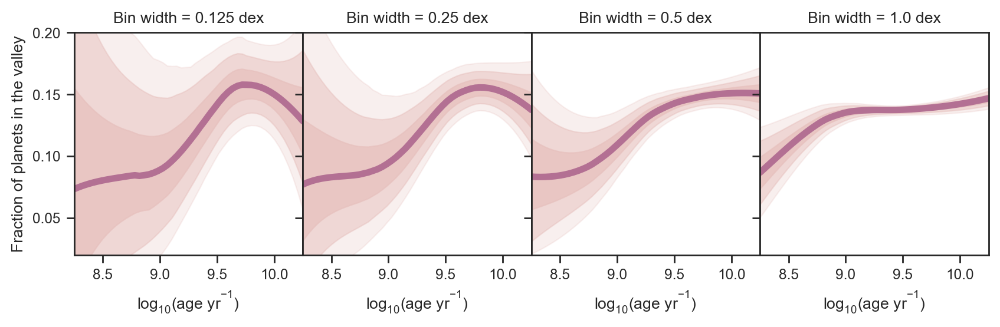

In [26]:
from scipy import signal

def trend_plot(fig_path=None):

    ft_cpal = sns.cubehelix_palette(4, light=0.8, dark=0.4, as_cmap=False)

    fig, ax = plt.subplots(nrows=1,ncols=4,
                           sharex=True,sharey=True,
                           figsize=(10,2.5))

    titles = ['0.125 dex', '0.25 dex', '0.5 dex', '1.0 dex']

    for i,frac in enumerate([fitv_012, fitv_025, fitv_050, fitv_100]):

        y = signal.savgol_filter(np.percentile(frac, [50-0.5*99.7,
                                                      50-0.5*95.4,
                                                      50-0.5*68.3,
                                                      50,
                                                      50+0.5*68.3,
                                                      50+0.5*95.4,
                                                      50+0.5*99.7], axis=1), 25, 3)

        ax[i].fill_between(bin_centers, y[0], y[-1], color=ft_cpal[0], alpha=0.25)
        ax[i].fill_between(bin_centers, y[1], y[-2], color=ft_cpal[0], alpha=0.50)
        ax[i].fill_between(bin_centers, y[2], y[-3], color=ft_cpal[0], alpha=0.75)
        ax[i].plot(bin_centers, y[3], lw=4, color=ft_cpal[2])

        ax[i].set_xlabel(r'$\mathregular{log_{10}(age~yr^{-1})}$')
        ax[i].set_xlim(8.25,10.25)
        ax[i].set_ylim(0.02,0.2)
        ax[i].set_title('Bin width = '+ titles[i])


    ax[0].set_ylabel('Fraction of planets in the valley')
    plt.subplots_adjust(wspace=0)
    if fig_path:
        plt.savefig(fig_path)
        
    return

trend_plot('../figures/trend.pdf')

### How do the stellar properties for stars hosting planets in the valley compare to the overall CKS sample?

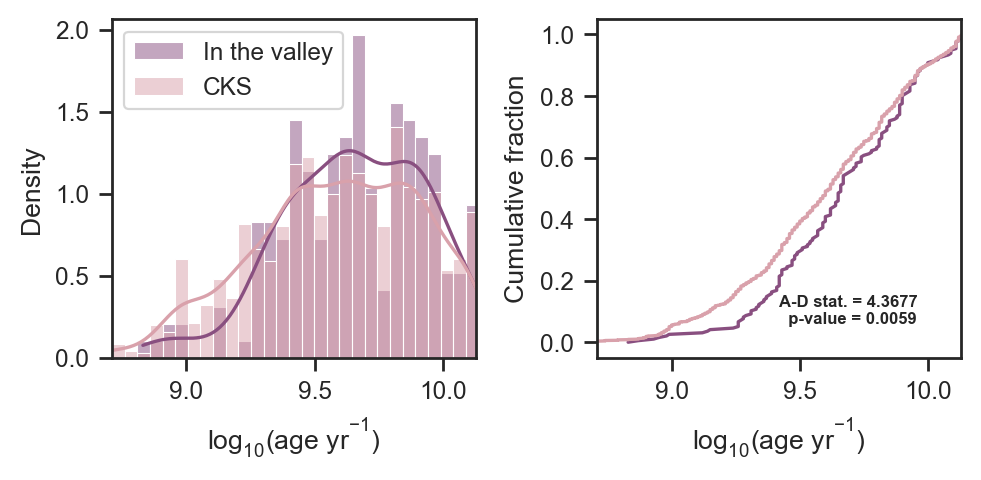

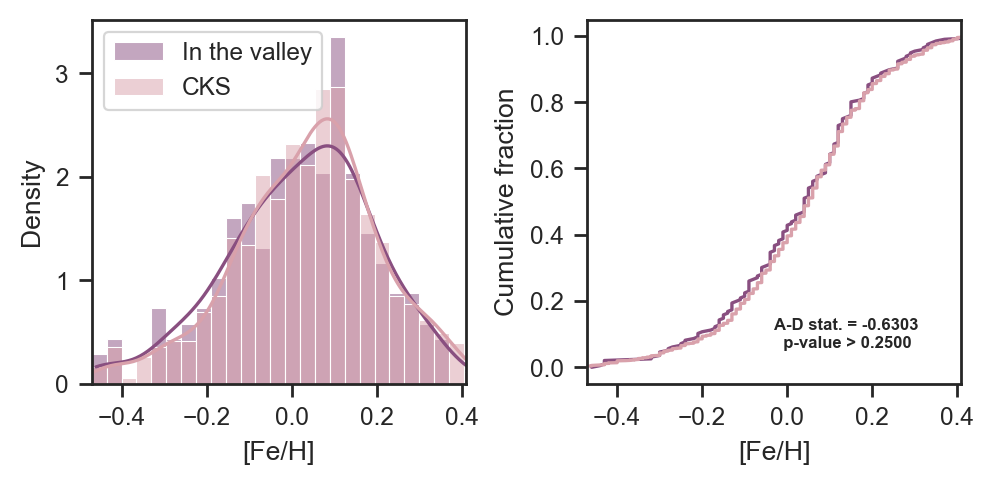

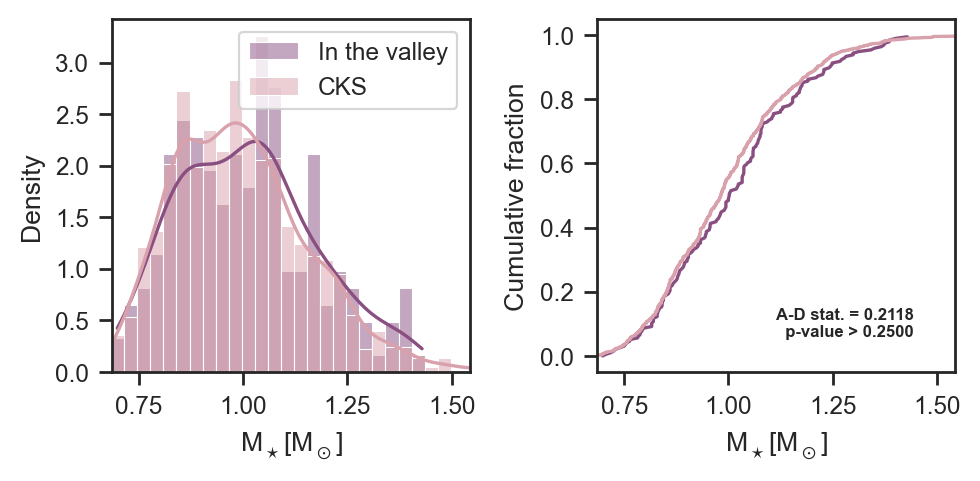

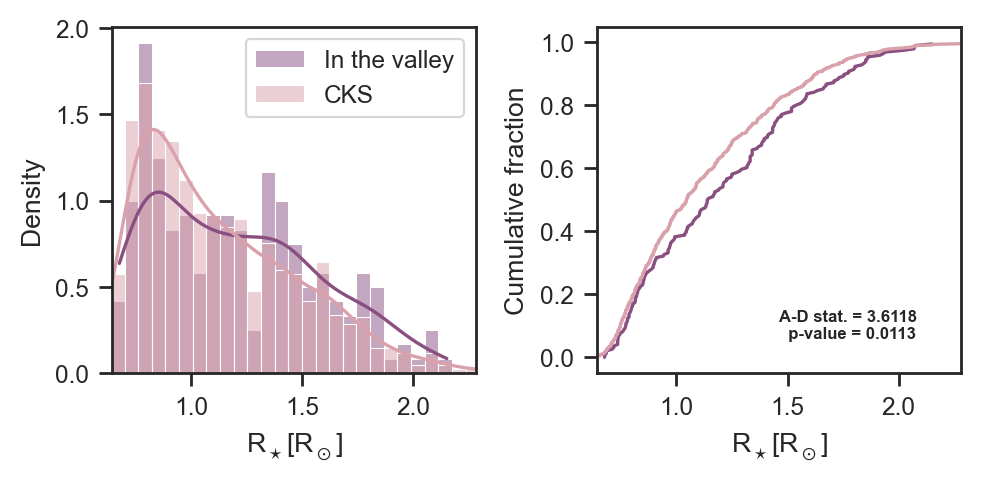

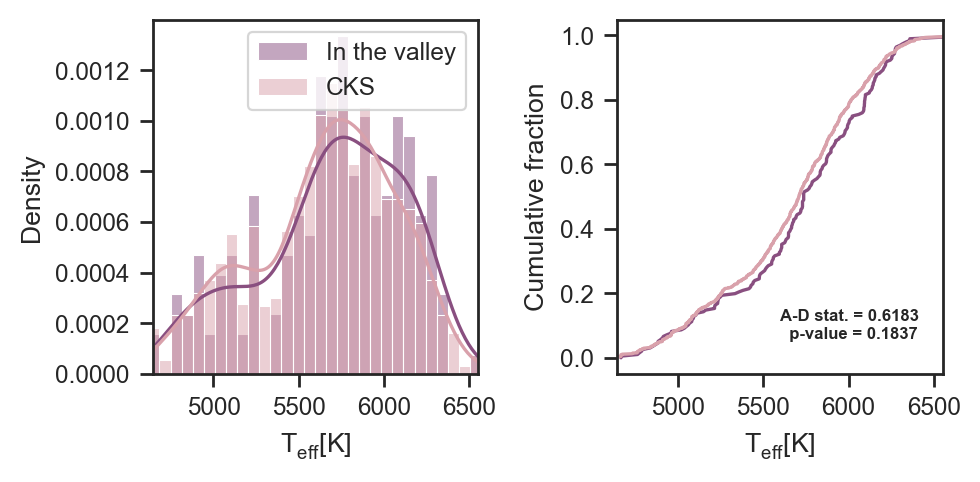

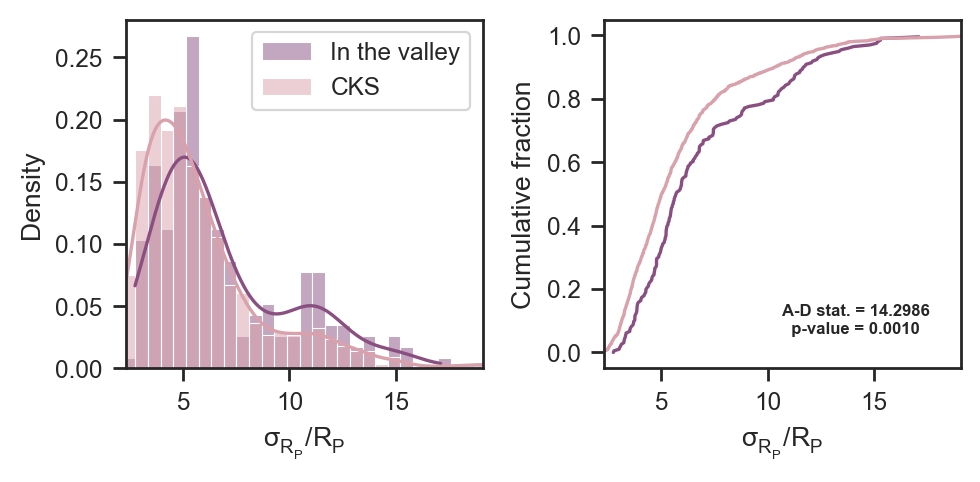

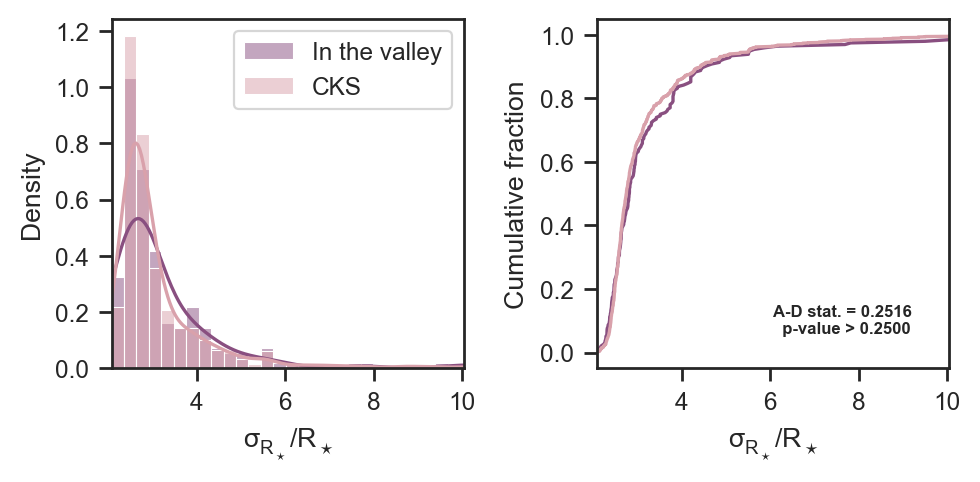

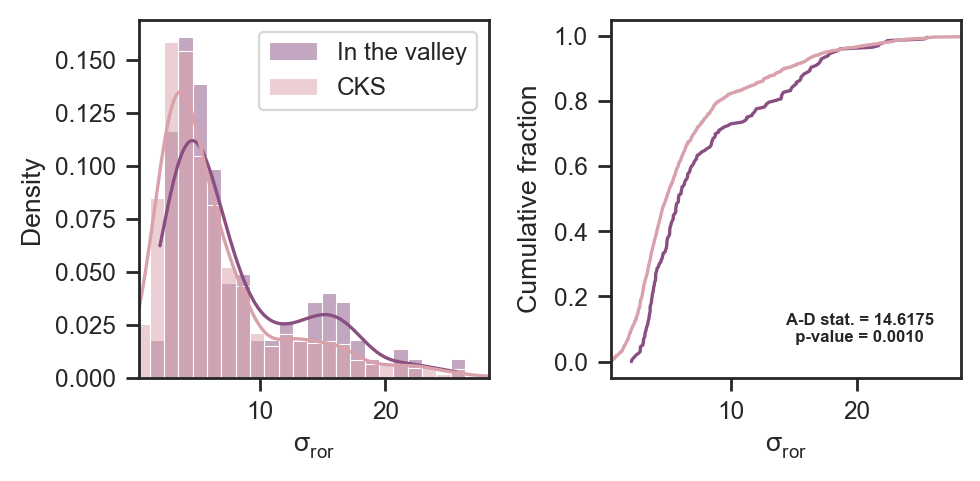

In [27]:
from scipy import stats

def cdf(x, nbins=100, normed=True, method=2):
    
    # Methods 1 & 2 return normalized CDF
    
    if method==1:    
        h,x1 = np.histogram(x, bins = nbins, normed=normed)
        dx = x1[1]-x1[0]
        f1 = np.cumsum(h)*dx
        cdfx, cdfy = x1[1:], f1

    elif method==2:
        x2 = np.sort(x)
        f2 = np.array(range(len(x)))/float(len(x))
        cdfx, cdfy = x2, f2
        
    elif method==3:
        from scipy import stats
        res  = stats.cumfreq(x, numbins=nbins)
        cdfx = res.lowerlimit + np.linspace(0, res.binsize*res.cumcount.size, res.cumcount.size)
        cdfy = res.cumcount
            
    return cdfx, cdfy


def distribution_plot(par, 
           slopes, 
           intercepts, 
           margins, 
           par_label,
           fig_title=None,
           fig_path=None):

    
    fig, ax = plt.subplots(nrows=1,ncols=2,
                       figsize=(2.5*2,2.5))


    _slopes = slopes[:][3]
    _intercepts = intercepts[:][3]
    _margins = margins[:][3]

    smed = np.median(_slopes)
    imed = np.median(_intercepts)
    mmed = np.median(_margins)

    def upper_margin(p):
        return smed*p + imed + np.sqrt(1+smed**2) * mmed

    def lower_margin(p):
        return smed*p + imed - np.sqrt(1+smed**2) * mmed

    if par in ['prot', 'a18_period', 'm13_Prot', 'm15_Prot', 'w13_Per']:
        cc = common_cuts & (np.isfinite(cks[par])) & (cks['f18_Teff']<6000)
        
        cc = (common_cuts) & (np.isfinite(cks[par])) & (cks['f18_Teff']<6000)
    else:
        cc = (common_cuts) & (np.isfinite(cks[par]))
    
    xdata=cks['f18_P'][cc] 
    ydata=cks['f18_Rp'][cc]

    in_the_valley = cc &\
                    (np.log10(ydata)>lower_margin(np.log10(xdata))) &\
                    (np.log10(ydata)<upper_margin(np.log10(xdata)))


    bins = np.linspace(np.min(cks[par][cc]), np.max(cks[par][cc]), 31)
    
    xmin,xmax = np.nanpercentile(cks[par][cc], [0.25,99.75])
    

    sns.histplot(cks[par][in_the_valley], color=tt_cpal[1], ax=ax[0], kde=True, stat='density', bins=bins, label='In the valley')
    sns.histplot(cks[par][cc], color=tt_cpal[0], ax=ax[0], kde=True, stat='density', bins=bins, label='CKS')

    _cdfx_itv,_cdfy_itv = cdf(cks[par][in_the_valley])
    _cdfx, _cdfy = cdf(cks[par][cc])

    ad_result = stats.anderson_ksamp([cks[par][in_the_valley], cks[par][cc]])
    
    if ad_result.significance_level==0.25:
        symbol = ' > '
    else:
        symbol = ' = '
    
    ax[1].text(0.5,0.1,'A-D stat. = '+"%.4f" % ad_result.statistic+
         '\n  p-value'+symbol+"%.4f" % ad_result.significance_level, 
         size=6, weight='bold', transform=ax[1].transAxes)
    
    
    ax[1].plot(_cdfx_itv, _cdfy_itv, color=tt_cpal[1])
    ax[1].plot(_cdfx, _cdfy, color=tt_cpal[0])
    ax[1].set_ylabel('Cumulative fraction')
    
    ax[0].set_xlabel(par_label)
    ax[0].set_xlim(xmin,xmax)
    ax[1].set_xlim(xmin,xmax)
    ax[1].set_xlabel(par_label)
    

    ax[0].legend()
    
    plt.tight_layout()
        
    if fig_title:
        plt.figtext(0.5, 1.02, fig_title, ha='center', va='center', size=11)
    if fig_path:
        plt.savefig(fig_path)
    plt.show()

    return


distribution_plot('f18_logAiso', slopes_A, intercepts_A, margins_A, par_label=r'$\mathregular{log_{10}(age~yr^{-1})}$', fig_path='../figures/dist-age.pdf')
distribution_plot('f18_[Fe/H]', slopes_A, intercepts_A, margins_A, par_label='[Fe/H]', fig_path='../figures/dist-feh.pdf')
distribution_plot('f18_Miso', slopes_A, intercepts_A, margins_A, par_label='$\mathregular{M_\star [M_\odot]}$', fig_path='../figures/dist-mass.pdf')
distribution_plot('f18_R', slopes_A, intercepts_A, margins_A, par_label='$\mathregular{R_\star [R_\odot]}$', fig_path='../figures/dist-rstar.pdf')
distribution_plot('f18_Teff', slopes_A, intercepts_A, margins_A, par_label='$\mathregular{T_{eff} [K]}$')
distribution_plot('rp_prec', slopes_A, intercepts_A, margins_A, par_label='$\mathregular{\sigma_{R_P}/R_P}$', fig_path='../figures/dist-rpprec.pdf')
distribution_plot('rs_prec', slopes_A, intercepts_A, margins_A, par_label='$\mathregular{\sigma_{R_\star}/R_\star}$', fig_path='../figures/dist-rsprec.pdf')
distribution_plot('ror_prec', slopes_A, intercepts_A, margins_A, par_label='$\mathregular{\sigma_{ror}}$')

In [28]:
# distribution_plot(np.log10(cks['l20_Rvar']), slopes_A, intercepts_A, margins_A, par_label='Rvar')
# distribution_plot(np.log10(cks['m15_Rvar']), slopes_A, intercepts_A, margins_A, par_label=r'$\mathregular{log_{10}}$(Rvar/ppm)', fig_path='../figures/dist-rvar.pdf')
# distribution_plot(cks['f18_R'], slopes_A, intercepts_A, margins_A, par_label=r'$\mathregular{R_\star [R_\odot]}$', fig_path='../figures/dist-rstar.pdf')
# distribution_plot(100.*np.max([cks['f18_E_R'],cks['f18_e_R']],axis=0)/cks['f18_R'], slopes_A, intercepts_A, margins_A, par_label='$\mathregular{\sigma_{R_\star}/R_\star}$ [%]', fig_path='../figures/dist-rsprec.pdf')
# distribution_plot('f18_r8', slopes_A, intercepts_A, margins_A, par_label='r8')
# distribution_plot('p20_Rtau', slopes_A, intercepts_A, margins_A, par_label='rtau')
# distribution_plot('single_transit_snr', slopes_A, intercepts_A, margins_A, par_label='snr')
# distribution_plot('a18_period', slopes_A, intercepts_A, margins_A, par_label='A18 Prot')
# distribution_plot('m15_Prot', slopes_A, intercepts_A, margins_A, par_label='M15 Prot')
# distribution_plot('m13_Prot', slopes_A, intercepts_A, margins_A, par_label='M13 Prot')
# distribution_plot('m15_Rvar', slopes_A, intercepts_A, margins_A, par_label='Rvar')
# distribution_plot('l20_Av', slopes_A, intercepts_A, margins_A, par_label=r'$\mathregular{A_G~[mag]}$')
# distribution_plot('d20_ruwe', slopes_A, intercepts_A, margins_A, par_label='RUWE')
# distribution_plot('stlr_rrmscdpp03p0', slopes_A, intercepts_A, margins_A, par_label='CDPP')
# distribution_plot('prot_numflag', slopes_A, intercepts_A, margins_A, par_label='Prot flag')
# distribution_plot('prot', slopes_A, intercepts_A, margins_A, par_label='Prot')

### Table 4 (Anderson-Darling tests)

In [29]:
def ad_table(par, 
             slopes, 
             intercepts, 
             margins):

    
    _slopes = slopes[:][3]
    _intercepts = intercepts[:][3]
    _margins = margins[:][3]

    smed = np.median(_slopes)
    imed = np.median(_intercepts)
    mmed = np.median(_margins)

    def upper_margin(p):
        return smed*p + imed + np.sqrt(1+smed**2) * mmed

    def lower_margin(p):
        return smed*p + imed - np.sqrt(1+smed**2) * mmed


    try:
        if par in ['prot', 'a18_period', 'm13_Prot', 'm15_Prot', 'w13_Per']:
            cc = common_cuts & (np.isfinite(cks[par])) & (cks['f18_Teff']<6000)
        else:
            cc = common_cuts & (np.isfinite(cks[par]))
            
    except:
        cc = common_cuts
        
    
    xdata=cks['f18_P'][cc] 
    ydata=cks['f18_Rp'][cc]

    in_the_valley = cc &\
                    (np.log10(ydata)>lower_margin(np.log10(xdata))) &\
                    (np.log10(ydata)<upper_margin(np.log10(xdata)))

    try:
        ad_result = stats.anderson_ksamp([cks[par][in_the_valley], cks[par][common_cuts & (np.isfinite(cks[par]))]])
        
        #print(par,"&","%.4f" % ad_result.statistic,"&","%.4f" % ad_result.significance_level)
    
        table_row = par+" & "+"%.4f" % ad_result.statistic+\
                " & "+"%.4f" % ad_result.significance_level+\
                " & "+str(len(xdata[in_the_valley]))+" & "+str(len(xdata))+' \\\\'
        
        return table_row, ad_result.statistic, ad_result.significance_level
    
    except:
        return [None,None,None]


pars = ['f18_logAiso', 
        'f18_Miso',         
        'f18_[Fe/H]', 
        'f18_Teff', 
        'rs_prec', 
        'rp_prec',
        'prot',
        'prot_numflag',
        'm15_Rvar',
        'gaia_phot_g_mean_mag',
        'dr25_koi_kepmag',
        'p20_Rtau',
        'd20_ruwe',
        'single_transit_snr',
        'stlr_rrmscdpp03p0',
        'f18_r8',
        'f18_RCF',
        'f18_plx',
        'f18_R',
        'b20_iso_avs',
        'l20_Av',
        'a18_period',
        'm13_Prot',
        'm15_Prot',
        'w13_Per',
        'b20_log10_iso_age']

for par in pars:
    row, ad_stat, ad_siglevel = ad_table(par, slopes_A, intercepts_A, margins_A)
    print(row)

f18_logAiso & 4.3677 & 0.0059 & 196 & 1443 \\
f18_Miso & 0.2118 & 0.2500 & 196 & 1443 \\
f18_[Fe/H] & -0.6303 & 0.2500 & 196 & 1443 \\
f18_Teff & 0.6183 & 0.1837 & 196 & 1443 \\
rs_prec & 0.2516 & 0.2500 & 196 & 1443 \\
rp_prec & 14.2986 & 0.0010 & 196 & 1443 \\
prot & 1.9495 & 0.0511 & 55 & 592 \\
prot_numflag & 6.9994 & 0.0010 & 196 & 1443 \\
m15_Rvar & 4.6740 & 0.0045 & 180 & 1334 \\
gaia_phot_g_mean_mag & -0.5572 & 0.2500 & 190 & 1420 \\
dr25_koi_kepmag & -0.2810 & 0.2500 & 190 & 1420 \\
p20_Rtau & 0.2980 & 0.2500 & 190 & 1415 \\
d20_ruwe & -0.6390 & 0.2500 & 190 & 1418 \\
single_transit_snr & 0.6517 & 0.1778 & 190 & 1420 \\
stlr_rrmscdpp03p0 & -0.1594 & 0.2500 & 190 & 1420 \\
f18_r8 & 2.5298 & 0.0298 & 196 & 1443 \\
f18_RCF & -0.9397 & 0.2500 & 55 & 423 \\
f18_plx & 0.0956 & 0.2500 & 196 & 1443 \\
f18_R & 3.6118 & 0.0113 & 196 & 1443 \\
b20_iso_avs & -0.5039 & 0.2500 & 188 & 1390 \\
l20_Av & -0.5705 & 0.2500 & 187 & 1382 \\
a18_period & 0.6685 & 0.1749 & 109 & 873 \\
m13_Prot & 2.

#### Repeat A-D test for entire dataframe, printing only significant correlations

In [30]:
for col in cks.columns:
    row, ad_stat, ad_siglevel = ad_table(col, slopes_A, intercepts_A, margins_A)
    if (ad_siglevel!=None):
        if (ad_siglevel<0.01):
            print(row)
        else:
            pass
    else:
        pass

f18_P & 5.7296 & 0.0019 & 196 & 1443 \\
f18_Rp/R* & 22.2823 & 0.0010 & 196 & 1443 \\
f18_e_Rp/R* & 8.1763 & 0.0010 & 196 & 1443 \\
f18_Rp & 67.6319 & 0.0010 & 196 & 1443 \\
f18_E_Rp & 9.9568 & 0.0010 & 196 & 1443 \\
f18_e_Rp & 9.9568 & 0.0010 & 196 & 1443 \\
f18_a & 5.2983 & 0.0027 & 196 & 1443 \\
f18_Sinc & 8.2843 & 0.0010 & 196 & 1443 \\
f18_E_Sinc & 8.4575 & 0.0010 & 196 & 1443 \\
f18_e_Sinc & 8.4575 & 0.0010 & 196 & 1443 \\
f18_E_R & 4.0175 & 0.0079 & 196 & 1443 \\
f18_e_R & 4.0656 & 0.0076 & 196 & 1443 \\
f18_rhoiso & 3.8176 & 0.0095 & 196 & 1443 \\
f18_logAiso & 4.3677 & 0.0059 & 196 & 1443 \\
f18_E_logAiso & 5.2996 & 0.0027 & 196 & 1443 \\
dr25_koi_num_transits & 6.3201 & 0.0012 & 190 & 1420 \\
dr25_koi_max_sngle_ev & 15.1251 & 0.0010 & 190 & 1420 \\
dr25_koi_max_mult_ev & 6.2405 & 0.0013 & 190 & 1420 \\
dr25_koi_model_snr & 6.0575 & 0.0015 & 190 & 1420 \\
dr25_koi_prad & 40.2816 & 0.0010 & 190 & 1420 \\
dr25_koi_prad_err1 & 11.4073 & 0.0010 & 190 & 1420 \\
dr25_koi_prad_err2 & 

### What are the fractions of young/old planets in the valley as a function of radius precision?

/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


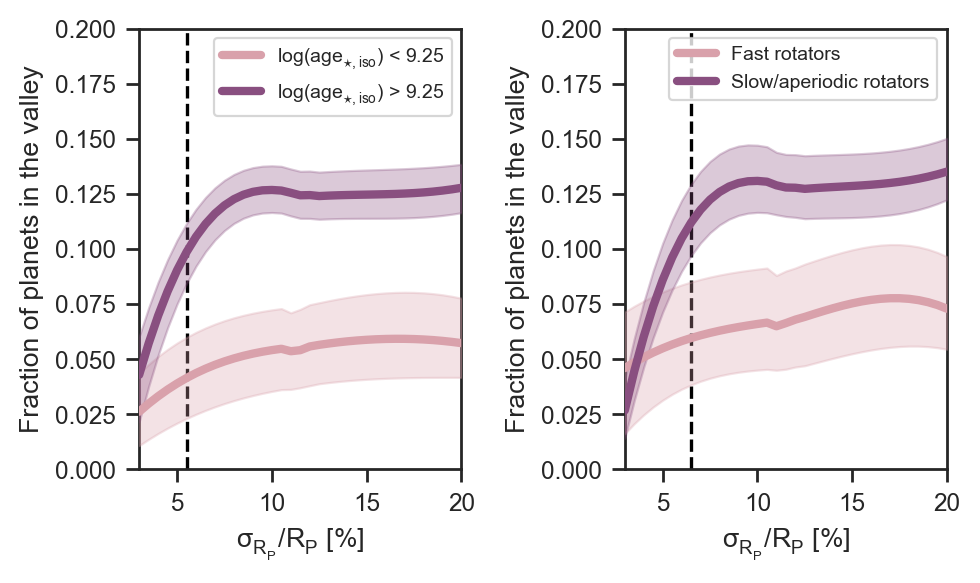

In [31]:
from scipy import signal

def fitv_precision_plot(fig_path=None):

    #Bootstrapping
    _x, _y = np.array(np.log10(cks['f18_P'])), np.array(np.log10(cks['f18_Rp']))  
    _yerr = np.max([_y-np.log10(cks['f18_Rp']-cks['f18_e_Rp']), np.log10(cks['f18_Rp']+cks['f18_E_Rp'])-_y],axis=0)
    _z = np.array(cks['rp_prec'])

    prec = np.arange(3.0,20.5,0.5)

    fitv_yng = [[] for i in range(len(prec))]
    fitv_old = [[] for i in range(len(prec))]
    fitv_base = [[] for i in range(len(prec))]
    fitv_frac = [[] for i in range(len(prec))]
    fitv_gyng = [[] for i in range(len(prec))]
    fitv_gold = [[] for i in range(len(prec))]

    nst_yng = [[] for i in range(len(prec))]
    nst_old = [[] for i in range(len(prec))]
    nst_base = [[] for i in range(len(prec))]
    nst_gyng = [[] for i in range(len(prec))]
    nst_gold = [[] for i in range(len(prec))]

    for i,pr in enumerate(prec):
        for __ in range(100):

            smpl1 = iso_allyng & (cks['rp_prec']<pr) 
            smpl2 = iso_old & (cks['rp_prec']<pr) #& (cks['f18_logAiso']-cks['f18_e_logAiso']>9.25)
            smpl3 = common_cuts & (cks['rp_prec']<pr)

            x1 = _x[smpl1]
            x2 = _x[smpl2]
            x3 = _x[smpl3]

            y1 = np.random.normal(_y[smpl1], _yerr[smpl1])
            y2 = np.random.normal(_y[smpl2], _yerr[smpl2])
            y3 = np.random.normal(_y[smpl3], _yerr[smpl3])

            z1 = _z[smpl1]
            z2 = _z[smpl2]

            bsarg1 = np.random.choice(len(x1), len(x1), replace=True)
            bsarg2 = np.random.choice(len(x2), len(x2), replace=True)
            bsarg3 = np.random.choice(len(x3), len(x3), replace=True)

            _itv1 = (y1[bsarg1]>lower_margin(x1[bsarg1], sample='B'))&(y1[bsarg1]<upper_margin(x1[bsarg1], sample='B'))
            _itv2 = (y2[bsarg2]>lower_margin(x2[bsarg2], sample='B'))&(y2[bsarg2]<upper_margin(x2[bsarg2], sample='B'))
            _itv3 = (y3[bsarg3]>lower_margin(x3[bsarg3], sample='B'))&(y3[bsarg3]<upper_margin(x3[bsarg3], sample='B'))

            fitv_yng[i].append(len(x1[bsarg1][_itv1])/len(x1[bsarg1]))
            fitv_old[i].append(len(x2[bsarg2][_itv2])/len(x2[bsarg2]))
            fitv_base[i].append(len(x3[bsarg3][_itv3])/len(x3[bsarg3]))

            try:
                fitv_frac[i].append( (len(x2[bsarg2][_itv2])/len(x2[bsarg2])) / (len(x1[bsarg1][_itv1])/len(x1[bsarg1])))
            except:
                fitv_frac[i].append(np.nan)

            nst_yng[i].append(len(x1[bsarg1]))
            nst_old[i].append(len(x2[bsarg2]))
            nst_base[i].append(len(x3[bsarg3]))

            # Gyro sample
            smpl1 = gyro_yng & (cks['rp_prec']<pr) 
            smpl2 = np.any([gyro_old, gyro_nop], axis=0) & (cks['rp_prec']<pr)

            x1 = _x[smpl1]
            x2 = _x[smpl2]

            y1 = np.random.normal(_y[smpl1], _yerr[smpl1])
            y2 = np.random.normal(_y[smpl2], _yerr[smpl2])

            z1 = _z[smpl1]
            z2 = _z[smpl2]

            bsarg1 = np.random.choice(len(x1), len(x1), replace=True)
            bsarg2 = np.random.choice(len(x2), len(x2), replace=True)

            _itv1 = (y1[bsarg1]>lower_margin(x1[bsarg1], sample='C'))&(y1[bsarg1]<upper_margin(x1[bsarg1], sample='C'))
            _itv2 = (y2[bsarg2]>lower_margin(x2[bsarg2], sample='C'))&(y2[bsarg2]<upper_margin(x2[bsarg2], sample='C'))

            fitv_gyng[i].append(len(x1[bsarg1][_itv1])/len(x1[bsarg1]))
            fitv_gold[i].append(len(x2[bsarg2][_itv2])/len(x2[bsarg2]))

            nst_gyng[i].append(len(x1[bsarg1]))
            nst_gold[i].append(len(x2[bsarg2]))
    
    
    
    y1 = signal.savgol_filter(np.percentile(fitv_yng, [50-0.5*68.3,
                                                      50,
                                                      50+0.5*68.3], axis=1), 31, 3)

    y2 = signal.savgol_filter(np.percentile(fitv_old, [50-0.5*68.3,
                                                      50,
                                                      50+0.5*68.3], axis=1), 31, 3)

    y3 = signal.savgol_filter(np.percentile(fitv_gyng, [50-0.5*68.3,
                                                      50,
                                                      50+0.5*68.3], axis=1), 31, 3)

    y4 = signal.savgol_filter(np.percentile(fitv_gold, [50-0.5*68.3,
                                                      50,
                                                      50+0.5*68.3], axis=1), 31, 3)


    plt.subplot(121)
    
    plt.plot(prec, y1[1], lw=3, color=tt_cpal[0], label=r'$\mathregular{log(age_{\star,iso})}$ < 9.25', zorder=999)
    plt.fill_between(prec, y1[0], y1[2], color=tt_cpal[0], alpha=0.3, zorder=999)

    plt.plot(prec, y2[1], lw=3, color=tt_cpal[1], label=r'$\mathregular{log(age_{\star,iso})}$ > 9.25', zorder=999)
    plt.fill_between(prec, y2[0], y2[2], color=tt_cpal[1], alpha=0.3, zorder=999)


    _arg = np.array(np.mean(nst_yng, axis=1)>150)*np.array(np.mean(nst_old, axis=1)>150)
    plt.axvline(prec[_arg][0], color='k', ls='--')

    plt.xlabel(r'$\mathregular{\sigma_{R_P}/R_P}$ [%]')
    plt.ylabel('Fraction of planets in the valley')
    plt.xlim(3,20)
    plt.ylim(0,0.2)
    plt.legend(prop={'size': 7})


    plt.subplot(122)

    plt.plot(prec, y3[1], lw=3, color=tt_cpal[0], label='Fast rotators', zorder=999)
    plt.fill_between(prec, y3[0], y3[2], color=tt_cpal[0], alpha=0.3, zorder=999)

    plt.plot(prec, y4[1], lw=3, color=tt_cpal[1], label='Slow/aperiodic rotators', zorder=999)
    plt.fill_between(prec, y4[0], y4[2], color=tt_cpal[1], alpha=0.3, zorder=999)


    _arg = np.array(np.mean(nst_gyng, axis=1)>150)*np.array(np.mean(nst_gold, axis=1)>150)
    plt.axvline(prec[_arg][0], color='k', ls='--')

    plt.legend(prop={'size': 7})
    plt.xlabel(r'$\mathregular{\sigma_{R_P}/R_P}$ [%]')
    plt.ylabel('Fraction of planets in the valley')
    plt.xlim(3,20)
    plt.ylim(0,0.2)
    plt.gcf().set_size_inches(5,3)
    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    plt.show()    

    
fitv_precision_plot('../figures/fitv-precision.pdf')

### 1d radius distributions with precision cuts

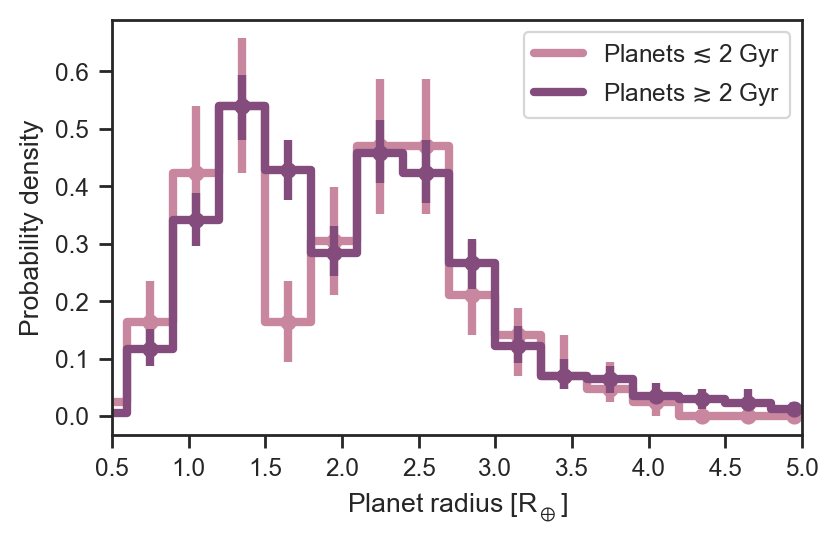

In [32]:
def precision_radii_plot(thresh=5, fig_path=None):

    x1 = cks['f18_Rp'][iso_allyng&(cks['rp_prec']<thresh)]
    x1err = cks['f18_E_Rp'][iso_allyng&(cks['rp_prec']<thresh)]
    x2 = cks['f18_Rp'][iso_old&(cks['rp_prec']<thresh)]
    x2err = cks['f18_E_Rp'][iso_old&(cks['rp_prec']<thresh)]

    rpbins = np.arange(0,10.3,0.3)

    nboot = 1000
    hist1 = []
    hist2 = []

    np.random.seed(1701)

    for i in range(nboot):

        arg1 = np.random.choice(len(x1), len(x1), replace=True)
        arg2 = np.random.choice(len(x2), len(x2), replace=True)

        x1sim = np.random.normal(x1, x1err)
        x2sim = np.random.normal(x2, x2err)

        _hist1, bin_edges = np.histogram(x1sim[arg1], bins=rpbins, density=True)
        _hist2, bin_edges = np.histogram(x2sim[arg2], bins=rpbins, density=True)

        hist1.append(_hist1)
        hist2.append(_hist2)


    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    hist1_e = np.median(hist1, axis=0)-np.percentile(hist1, 16., axis=0)
    hist1_E = np.percentile(hist1, 84., axis=0)-np.median(hist1, axis=0)

    hist2_e = np.median(hist2, axis=0)-np.percentile(hist2, 16., axis=0)
    hist2_E = np.percentile(hist2, 84., axis=0)-np.median(hist2, axis=0)

    plt.plot(bin_centers, np.median(hist1, axis=0), drawstyle='steps-mid', lw=3, color=cpal[1], label=r'Planets $\lesssim$ 2 Gyr', zorder=1)
    plt.errorbar(bin_centers, np.median(hist1, axis=0), yerr=[hist1_e, hist1_E], fmt='o', color=cpal[1], lw=3, zorder=1)
    plt.plot(bin_centers, np.median(hist2, axis=0), drawstyle='steps-mid', lw=3, color=cpal[2], label=r'Planets $\gtrsim$ 2 Gyr', zorder=2)
    plt.errorbar(bin_centers, np.median(hist2, axis=0), yerr=[hist2_e, hist2_E], fmt='o', color=cpal[2], lw=3, zorder=2)

    plt.xlim(0.5,5)    
    plt.xlabel(r'Planet radius [$\mathregular{R_\oplus}$]')
    plt.ylabel('Probability density')
    plt.legend()
    plt.gcf().set_size_inches(2.75*1.618,2.75)
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
    
precision_radii_plot(thresh=5, fig_path='../figures/fivepct.pdf')

### Van Eylen et al. 2018 sample

In [33]:
vans = pd.read_csv('../data/vaneylen2018_params_table_final.csv') #Single planet systems
vanm = pd.read_csv('../data/vaneylen2018_params_table_multis_final.csv') #Multi-planet systems

frames = [vans, vanm]
van = pd.concat(frames)

#Merge with CKS
van['koiname'] = van['koiname'].astype('object')

vv = van.merge(cks, left_on='koiname', right_on='f18_KOI')
vv.head()

vv['cks_age'] = 10.**vv['f18_logAiso']/1.0e9
vv['cks_age_E'] = 10.**(vv['f18_logAiso']+vv['f18_E_logAiso'])/1.0e9 - vv['cks_age']
vv['cks_age_e'] = vv['cks_age'] - 10.**(vv['f18_logAiso']-vv['f18_e_logAiso'])/1.0e9

van.head()

,Kepler,koiname,Ecc,Ecc_low,Ecc_upp,Period,U_Per,Rp,U_Rp,Rovera,...,Temperature,Temperature_low,Temperature_upp,Metl,Metl_low,Metl_upp,Kepmag,relrho,relrho_low,relrho_upp
0,TrES-2,K00001.01,0.008503,4.607463e-07,0.101349,2.470613,2.470613,13.208982,13.486926,0.126034,...,5850.0,5800.0,5900.0,-0.15,-0.25,-0.05,11.338,1.002694,0.978500,1.027940
1,HAT-P-7,K00002.01,0.011169,3.354116e-06,0.125706,2.204735,2.204735,16.883074,17.137615,0.240748,...,6350.0,6270.0,6430.0,0.26,0.18,0.34,10.463,1.003814,0.961054,1.046348
2,HAT-P-11,K00003.01,0.091153,6.389376e-02,0.274010,4.887802,4.887803,4.887142,4.951733,0.066093,...,5101.0,5051.0,5151.0,0.31,0.26,0.36,9.174,0.784597,0.759733,0.808826
3,Kepler-4,K00007.01,0.023892,3.386884e-07,0.211062,3.213671,3.213672,4.220782,4.337596,0.164712,...,5781.0,5705.0,5857.0,0.09,-0.01,0.19,12.211,1.022489,0.875866,1.124959
4,Kepler-410,K00042.01,0.184489,1.259499e-01,0.415954,17.833613,17.833659,2.786468,2.831038,0.043962,...,6325.0,6250.0,6400.0,0.01,-0.09,0.11,9.364,1.633498,1.484729,1.777530


### What are the ages of the stars in the Van Eylen et al. 2018 asteroseismic sample?

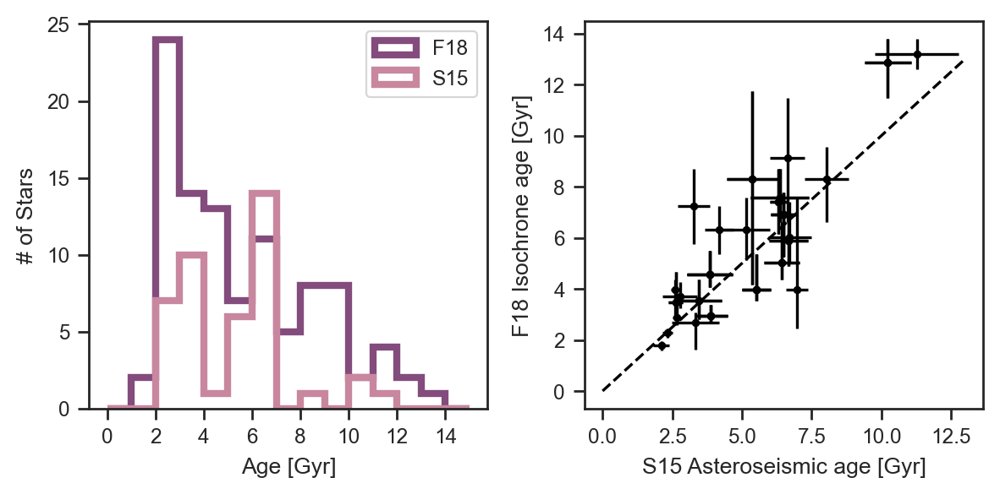

In [34]:
plt.subplot(121)
plt.hist(10.**vv['f18_logAiso']/1.0e9, bins=np.arange(0,16), histtype='step', lw=3, label='F18', color=cpal[2])
plt.hist(vv['s15_Age'], bins=np.arange(0,16), histtype='step', lw=3, label='S15', color=cpal[1])
plt.xticks(np.arange(0,16,2))
plt.xlabel('Age [Gyr]')
plt.ylabel('# of Stars')
plt.legend()

plt.subplot(122)
plt.errorbar(vv['s15_Age'], vv['cks_age'], xerr=vv['s15_E_Age'], yerr=[vv['cks_age_e'],vv['cks_age_E']], fmt='.', color='k')
plt.plot([0,13],[0,13],'k--')
plt.xlabel('S15 Asteroseismic age [Gyr]')
plt.ylabel('F18 Isochrone age [Gyr]')

plt.gcf().set_size_inches(6,3)
plt.tight_layout()
plt.show()

### Gold sample (Figure 18)

385 planets in gold sample
54 planets in gold young sample
167 planets in gold old sample
101 planets in asteroseismic sample


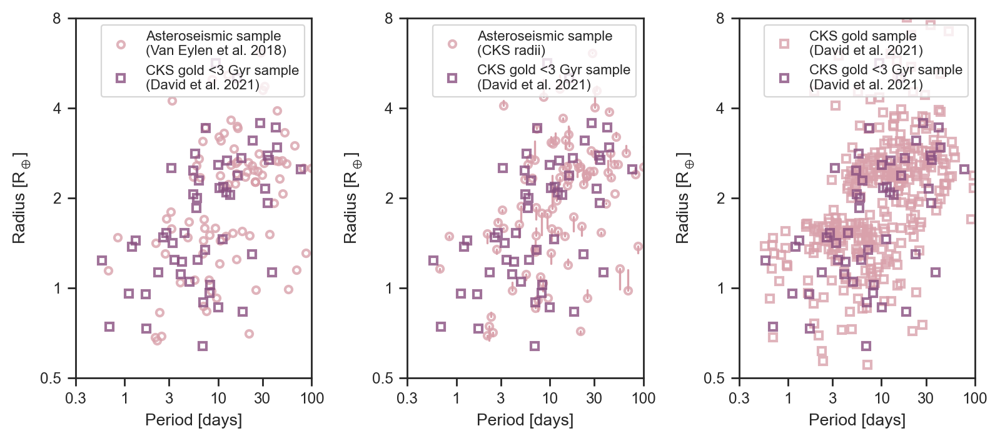

In [35]:
def gold_sample(fig_path=None):

    gold = common_cuts&\
           (cks['rp_prec']<6.)&(cks['ror_prec']<6.)&\
           (cks['dr25_koi_score']>0.99)&\
           m_nongrazing & m_rcf & m_r8 & m_red & (cks['d20_ruwe']<1.1) & m_plx #& m_deltamag

    gold_yng = gold & gyro_yng & (cks['f18_age_gyr']<3)
    gold_old = gold & ~gyro_yng & (cks['f18_agelo_gyr']>3)

    print(len(cks[gold]), 'planets in gold sample')
    print(len(cks[gold_yng]), 'planets in gold young sample')
    print(len(cks[gold_old]), 'planets in gold old sample')
    print(len(vv), 'planets in asteroseismic sample')

    kws = {'alpha':0.8, 'mew':1.5, 'mfc':'None', 'ms':4, 'rasterized':True}

    fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(9*0.9,4*0.9))

    ax1.plot(np.log10(vv['Period']), np.log10(vv['Rp']), 'o', label='Asteroseismic sample\n(Van Eylen et al. 2018)', color=tt_cpal[0], **kws)
    ax1.plot(np.log10(cks['f18_P'][gold_yng]),np.log10(cks['f18_Rp'][gold_yng]), 's', label='CKS gold <3 Gyr sample\n(David et al. 2021)', color=tt_cpal[1], **kws)

    ax2.plot([np.log10(vv['Period']), np.log10(vv['Period'])], 
            [np.log10(vv['Rp']),np.log10(vv['f18_Rp'])], color=tt_cpal[0])
    ax2.plot(np.log10(vv['Period']), np.log10(vv['f18_Rp']), 'o', label='Asteroseismic sample\n(CKS radii)', color=tt_cpal[0], **kws)
    ax2.plot(np.log10(cks['f18_P'][gold_yng]),np.log10(cks['f18_Rp'][gold_yng]), 's', label='CKS gold <3 Gyr sample\n(David et al. 2021)', color=tt_cpal[1], **kws)


    ax3.plot(np.log10(cks['f18_P'][gold&(~gold_yng)]),np.log10(cks['f18_Rp'][gold&(~gold_yng)]), 's', label='CKS gold sample\n(David et al. 2021)', color=tt_cpal[0], **kws)
    ax3.plot(np.log10(cks['f18_P'][gold_yng]),np.log10(cks['f18_Rp'][gold_yng]), 's', label='CKS gold <3 Gyr sample\n(David et al. 2021)', color=tt_cpal[1], **kws)

    for ax in [ax1,ax2,ax3]:
        ax.set_xlim(-0.5,2)
        ax.set_ylim(np.log10(0.5),np.log10(8))
        ax.set_xticks(np.log10([0.3,1,3,10,30,100]))
        ax.set_xticklabels(['0.3','1','3','10','30','100'])
        ax.set_yticks(np.log10([0.5,1,2,4,8]))
        ax.set_yticklabels(['0.5','1','2','4','8'])
        ax.legend(prop={'size':8})
        ax.set_xlabel('Period [days]')
        ax.set_ylabel('Radius [$\mathregular{R_\oplus}$]')

    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
    
    return gold, gold_yng, gold_old
    
    
gold, gold_yng, gold_old = gold_sample(fig_path='../figures/gold.pdf')

### Do the old/young gold samples have different precision/SNR distributions?

In [36]:
print(stats.anderson_ksamp([cks['ror_prec'][gold_yng],cks['ror_prec'][gold_old]]))
print(stats.anderson_ksamp([cks['ror_prec'][gold_yng],cks['ror_prec'][gold]]))
print(stats.anderson_ksamp([cks['ror_prec'][gold_old],cks['ror_prec'][gold]]))

print(stats.anderson_ksamp([cks['rp_prec'][gold_yng],cks['rp_prec'][gold_old]]))
print(stats.anderson_ksamp([cks['rp_prec'][gold_yng],cks['rp_prec'][gold]]))
print(stats.anderson_ksamp([cks['rp_prec'][gold_old],cks['rp_prec'][gold]]))

Anderson_ksampResult(statistic=-0.38896708990782997, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752, 4.592, 6.546]), significance_level=0.25)
Anderson_ksampResult(statistic=-0.5349931992348163, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752, 4.592, 6.546]), significance_level=0.25)
Anderson_ksampResult(statistic=-1.1811136537622406, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752, 4.592, 6.546]), significance_level=0.25)
Anderson_ksampResult(statistic=-0.8397224919828417, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752, 4.592, 6.546]), significance_level=0.25)
Anderson_ksampResult(statistic=-0.9920980119207874, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752, 4.592, 6.546]), significance_level=0.25)
Anderson_ksampResult(statistic=-1.0504220504605808, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752, 4.592, 6.546]), significance_level=0.25)


gold sample
 & 5 & $-0.18^{+0.09}_{-0.07}$ & $0.42^{+0.07}_{-0.07}$ & $0.15^{+0.01}_{-0.02}$\\
 & 10 & $-0.12^{+0.07}_{-0.06}$ & $0.37^{+0.05}_{-0.06}$ & $0.11^{+0.01}_{-0.01}$\\
 & 100 & $-0.05^{+0.06}_{-0.04}$ & $0.31^{+0.04}_{-0.05}$ & $0.06^{+0.01}_{-0.01}$\\
 & 1000 & $-0.02^{+0.05}_{-0.05}$ & $0.28^{+0.04}_{-0.06}$ & $0.03^{+0.01}_{-0.01}$\\
--------------------------------------------------------------------------------
gold_gt3 sample
 & 5 & $-0.22^{+0.09}_{-0.11}$ & $0.49^{+0.1}_{-0.1}$ & $0.16^{+0.02}_{-0.02}$\\
 & 10 & $-0.13^{+0.09}_{-0.08}$ & $0.4^{+0.07}_{-0.09}$ & $0.12^{+0.01}_{-0.02}$\\
 & 100 & $-0.03^{+0.05}_{-0.04}$ & $0.29^{+0.04}_{-0.05}$ & $0.06^{+0.01}_{-0.01}$\\
 & 1000 & $-0.01^{+0.04}_{-0.03}$ & $0.27^{+0.04}_{-0.04}$ & $0.04^{+0.01}_{-0.01}$\\
--------------------------------------------------------------------------------
gold_lt3 sample
 & 5 & $-0.14^{+0.06}_{-0.07}$ & $0.34^{+0.06}_{-0.05}$ & $0.15^{+0.01}_{-0.02}$\\
 & 10 & $-0.1^{+0.03}_{-0.04}$ & $0.33

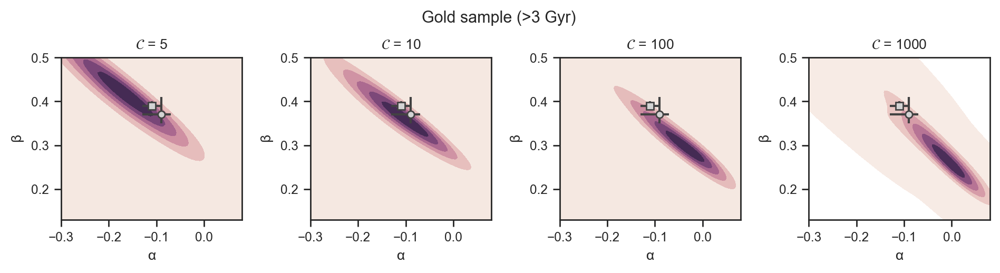

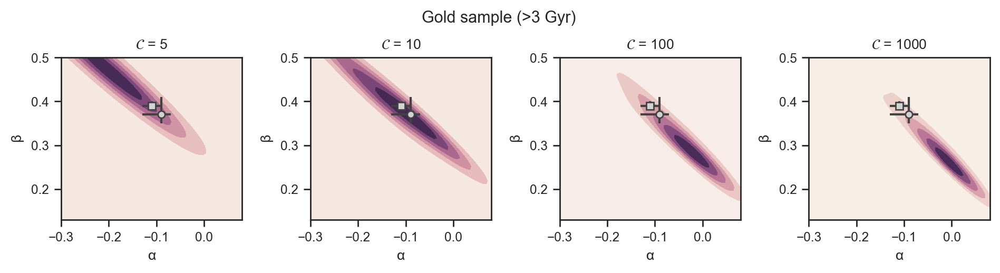

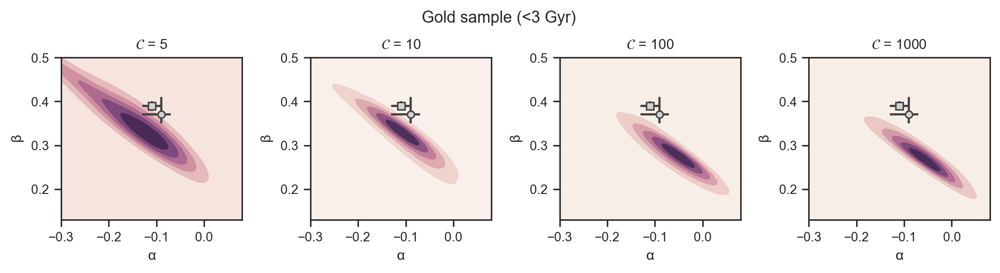

In [37]:
def new_sample(mask):
    x = np.array(cks['f18_P'][mask]); ex = np.array(cks['f18_e_P'][mask])
    y = np.array(cks['f18_Rp'][mask]); ey = np.array(cks['f18_e_Rp'][mask])
    z = np.array(cks['f18_Sinc'][mask]); ez = np.array(cks['f18_e_Sinc'][mask]) 
    flag = np.zeros(len(x), dtype=bool)
    flag[y<1.8] = 1
    
    return x,ex,y,ey,z,ez,flag
    
xgold,exgold,ygold,eygold,zgold,ezgold,flag_gold = new_sample(gold)
xgold_yng,exgold_yng,ygold_yng,eygold_yng,zgold_yng,ezgold_yng,flag_gold_yng = new_sample(gold_yng)
xgold_old,exgold_old,ygold_old,eygold_old,zgold_old,ezgold_old,flag_gold_old = new_sample(gold_old)

print('gold sample')
slopes_gold, intercepts_gold, margins_gold = svm_analysis(xdata=xgold, ydata=ygold, flag=flag_gold, nboot=1000, fig_title='Gold sample (>3 Gyr)')    
print('gold_gt3 sample')
slopes_gold_old, intercepts_gold_old, margins_gold_old = svm_analysis(xdata=xgold_old, ydata=ygold_old, flag=flag_gold_old, nboot=1000, fig_title='Gold sample (>3 Gyr)')    
print('gold_lt3 sample')
slopes_gold_yng, intercepts_gold_yng, margins_gold_yng = svm_analysis(xdata=xgold_yng, ydata=ygold_yng, flag=flag_gold_yng, nboot=1000, fig_title='Gold sample (<3 Gyr)')    


### Repeat for insolation

gold sample
 & 5 & $0.11^{+0.05}_{-0.05}$ & $0.02^{+0.13}_{-0.07}$ & $0.15^{+0.01}_{-0.02}$\\
 & 10 & $0.07^{+0.04}_{-0.04}$ & $0.11^{+0.11}_{-0.08}$ & $0.11^{+0.01}_{-0.01}$\\
 & 100 & $0.03^{+0.03}_{-0.04}$ & $0.19^{+0.1}_{-0.05}$ & $0.06^{+0.01}_{-0.01}$\\
 & 1000 & $0.01^{+0.02}_{-0.04}$ & $0.24^{+0.05}_{-0.07}$ & $0.03^{+0.01}_{-0.01}$\\
--------------------------------------------------------------------------------
gold_gt3 sample
 & 5 & $0.15^{+0.04}_{-0.06}$ & $-0.04^{+0.12}_{-0.11}$ & $0.16^{+0.02}_{-0.02}$\\
 & 10 & $0.09^{+0.03}_{-0.06}$ & $0.06^{+0.13}_{-0.08}$ & $0.12^{+0.01}_{-0.02}$\\
 & 100 & $0.03^{+0.03}_{-0.03}$ & $0.2^{+0.08}_{-0.06}$ & $0.06^{+0.01}_{-0.01}$\\
 & 1000 & $0.01^{+0.03}_{-0.02}$ & $0.24^{+0.04}_{-0.06}$ & $0.04^{+0.01}_{-0.01}$\\
--------------------------------------------------------------------------------
gold_lt3 sample
 & 5 & $0.07^{+0.03}_{-0.04}$ & $0.08^{+0.11}_{-0.05}$ & $0.14^{+0.01}_{-0.02}$\\
 & 10 & $0.06^{+0.02}_{-0.02}$ & $0.11^{+0.04

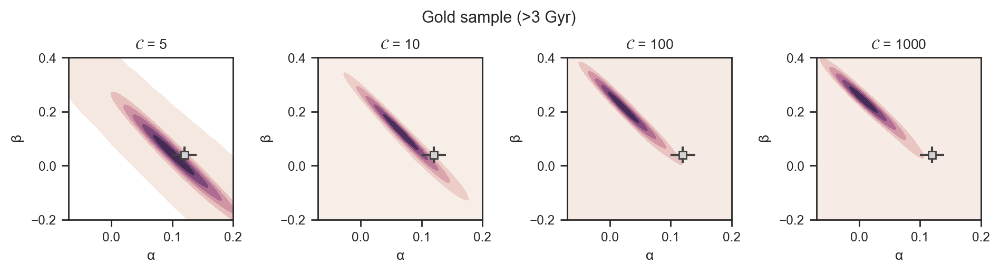

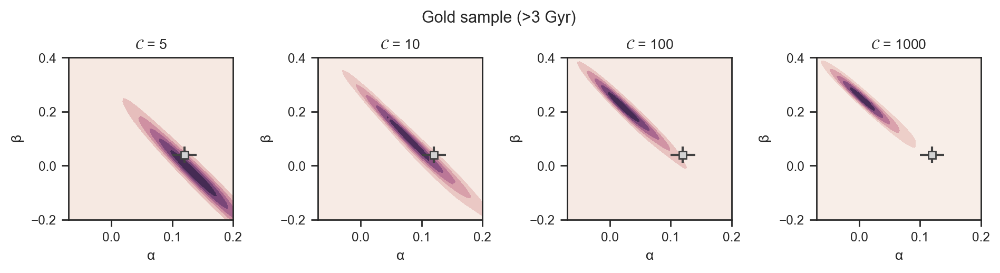

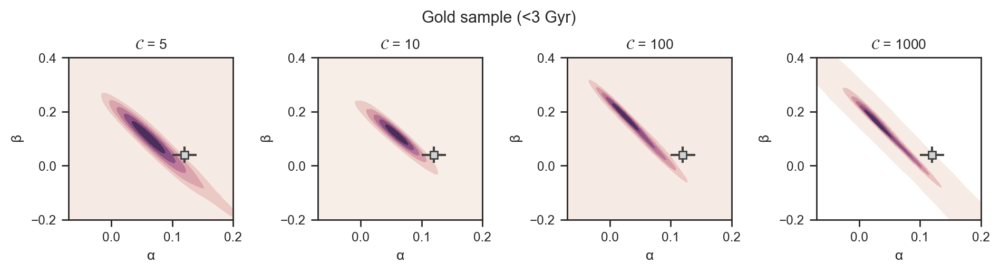

In [38]:
print('gold sample')
sslopes_gold, sintercepts_gold, smargins_gold = svm_analysis(xdata=zgold, ydata=ygold, flag=flag_gold, nboot=1000, plot_lit='sr', xrange=(-0.07,0.2), yrange=(-0.2,0.4), fig_title='Gold sample (>3 Gyr)')    
print('gold_gt3 sample')
sslopes_gold_old, sintercepts_gold_old, smargins_gold_old = svm_analysis(xdata=zgold_old, ydata=ygold_old, flag=flag_gold_old, nboot=1000, plot_lit='sr', xrange=(-0.07,0.2), yrange=(-0.2,0.4), fig_title='Gold sample (>3 Gyr)')    
print('gold_lt3 sample')
sslopes_gold_yng, sintercepts_gold_yng, smargins_gold_yng = svm_analysis(xdata=zgold_yng, ydata=ygold_yng, flag=flag_gold_yng, nboot=1000, plot_lit='sr', xrange=(-0.07,0.2), yrange=(-0.2,0.4), fig_title='Gold sample (<3 Gyr)')

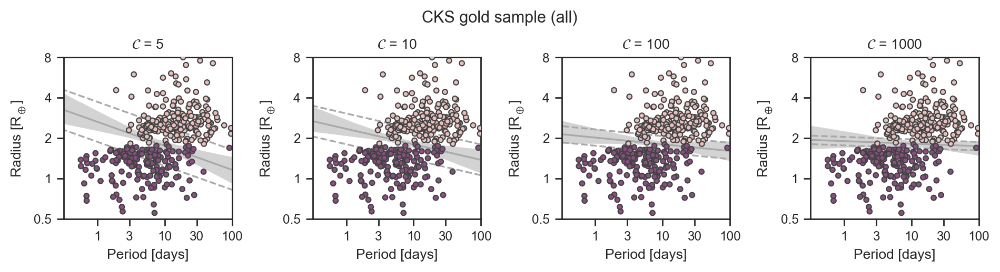

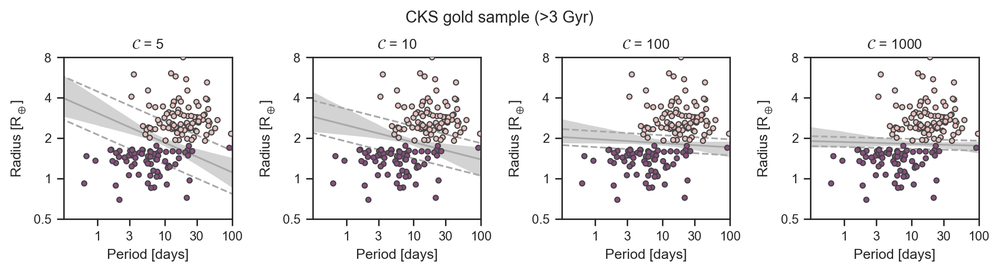

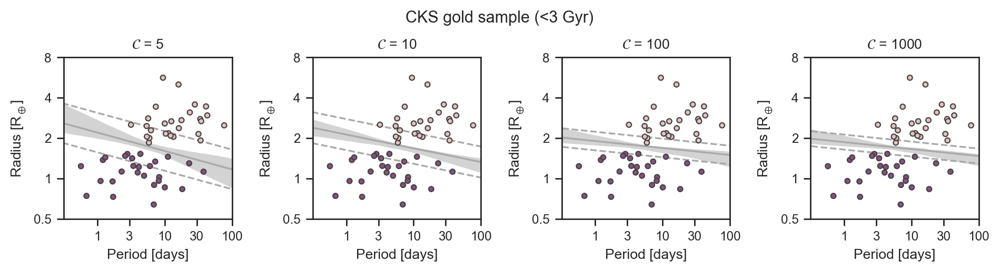

In [39]:
plot_results(xdata=xgold, ydata=ygold, flag=flag_gold, slopes=slopes_gold, 
             intercepts=intercepts_gold, margins=margins_gold, 
             fig_title='CKS gold sample (all)')

plot_results(xdata=xgold_old, ydata=ygold_old, flag=flag_gold_old, slopes=slopes_gold_old, 
             intercepts=intercepts_gold_old, margins=margins_gold_old, 
             fig_title='CKS gold sample (>3 Gyr)')

plot_results(xdata=xgold_yng, ydata=ygold_yng, flag=flag_gold_yng, slopes=slopes_gold_yng, 
             intercepts=intercepts_gold_yng, margins=margins_gold_yng, 
             fig_title='CKS gold sample (<3 Gyr)')

### What is the significance of the lack of large super-Earths at young ages?

In [40]:
r_yng   = np.array(ygold_yng[ygold_yng<v18_valley(xgold_yng)])
e_r_yng = np.array(eygold_yng[ygold_yng<v18_valley(xgold_yng)])

r_gold   = np.array(ygold[ygold<v18_valley(xgold)])
e_r_gold = np.array(eygold[ygold<v18_valley(xgold)])

r_v18 = np.array(vv['Rp'][vv['Rp']<v18_valley(vv['Period'])])
e_r_v18 = np.array(vv['U_Rp'][vv['Rp']<v18_valley(vv['Period'])]) - np.array(vv['Rp'][vv['Rp']<v18_valley(vv['Period'])])

print(len(r_yng), 'super-Earths in young sample')
print(len(r_gold), 'super-Earths in control sample')
print(len(r_v18), 'super-Earths in V18 sample')

nsim = int(1e4)
nfal = 0
nfal_v = 0
np.random.seed(1701)

for i in range(nsim):
    
    ryng = np.random.normal(r_yng, e_r_yng)    
    _rc = np.random.choice(len(r_gold), len(r_yng), replace=False)
    rall = np.random.normal(r_gold[_rc], e_r_gold[_rc])
    
    _rcv = np.random.choice(len(r_v18), len(r_yng), replace=False)
    rast = np.random.normal(r_v18[_rcv], e_r_v18[_rcv])
    
    if len(rall[rall>1.5])<=len(ryng[ryng>1.5]):
        nfal += 1
        
    if len(rast[rast>1.5])<=len(ryng[ryng>1.5]):
        nfal_v += 1        
        
    else:
        pass
    
print('Percent of simulations where number of large super-Earths in young sample exceeds gold sample:',  100.*nfal/nsim)
print('Percent of simulations where number of large super-Earths in young sample exceeds V18 sample:', 100.*nfal_v/nsim)
print(stats.anderson_ksamp([r_yng, r_gold]))

28 super-Earths in young sample
184 super-Earths in control sample
40 super-Earths in V18 sample
Percent of simulations where number of large super-Earths in young sample exceeds gold sample: 1.87
Percent of simulations where number of large super-Earths in young sample exceeds V18 sample: 2.07
Anderson_ksampResult(statistic=3.5959782557938977, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752, 4.592, 6.546]), significance_level=0.011470113681196688)


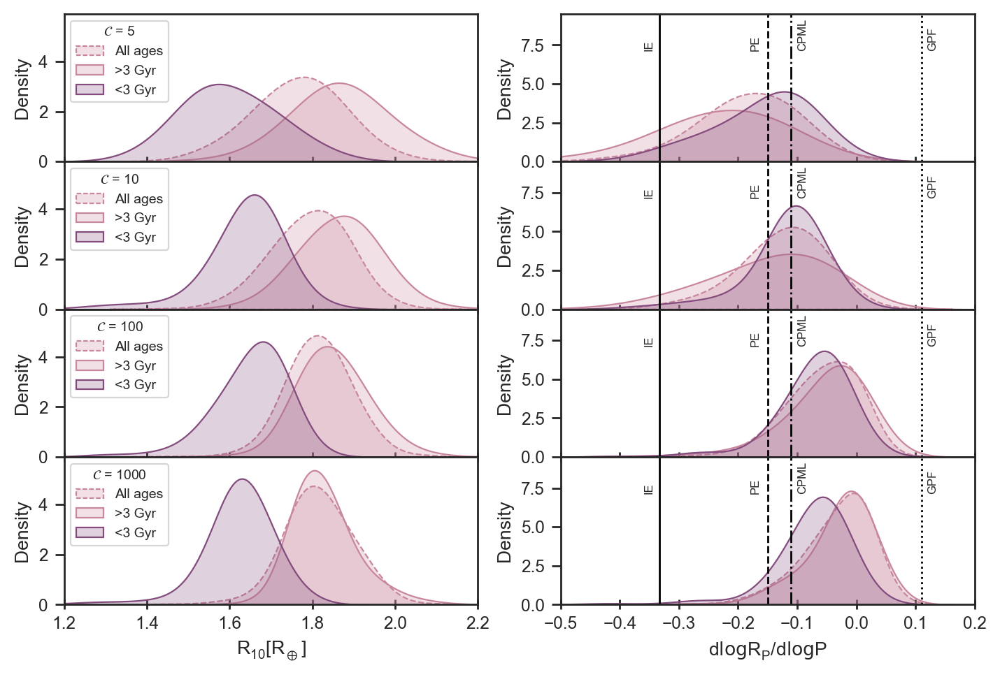

In [41]:
def plot_gold_results(fig_path=None):

    from matplotlib import gridspec
    cpal = sns.cubehelix_palette(4)
    sns.set_style({"xtick.direction": "inout"})

    dist_kws = {'kde':True, 'rug':False, 'hist':False}
    kde_kws = {'shade':True, 'bw_adjust':2.5}
    text_kws = {'size':6, 'weight':'regular', 'rotation':90}
    reg_label = [5,10,100,1000]
    fig = plt.figure(constrained_layout=False, figsize=(6*1.4,4*1.4))
    spec = gridspec.GridSpec(ncols=2, nrows=4, figure=fig, hspace=0, wspace=0.2)

    for i,cidx in enumerate(range(4)):

        ax1 = fig.add_subplot(spec[i, 0])
        ax2 = fig.add_subplot(spec[i, 1])

        r10_all = 10.**(np.array(slopes_gold[cidx][:])+np.array(intercepts_gold[cidx][:]))
        r10_old = 10.**(np.array(slopes_gold_old[cidx][:])+np.array(intercepts_gold_old[cidx][:]))
        r10_yng = 10.**(np.array(slopes_gold_yng[cidx][:])+np.array(intercepts_gold_yng[cidx][:]))

        sns.distplot(r10_all, color=cpal[1], ax=ax1, **dist_kws, label='All ages', kde_kws={'shade':True, 'bw_adjust':2, 'linestyle':'--'})
        sns.distplot(r10_old, color=cpal[1], ax=ax1, **dist_kws, label='>3 Gyr', kde_kws=kde_kws)
        sns.distplot(r10_yng, color=cpal[2], ax=ax1, **dist_kws, label='<3 Gyr', kde_kws=kde_kws)
        ax1.set_xlabel('$\mathregular{R_{10} [R_\oplus]}$')
        ax1.set_xlim(1.2,2.2)
        ax1.legend(loc='upper left', title='$\mathcal{C}$ = '+str(reg_label[i]), prop={'size':7}, title_fontsize=7)

        sns.distplot(np.array(slopes_gold[cidx][:]), color=cpal[1], ax=ax2, **dist_kws, label='All ages', kde_kws={'shade':True, 'bw_adjust':2, 'linestyle':'--'})
        sns.distplot(np.array(slopes_gold_old[cidx][:]), color=cpal[1], ax=ax2, **dist_kws, label='>3 Gyr', kde_kws=kde_kws)
        sns.distplot(np.array(slopes_gold_yng[cidx][:]), color=cpal[2], ax=ax2, **dist_kws, label='<3 Gyr', kde_kws=kde_kws)
        ax2.set_xlim(-0.5,0.2)
        ax2.set_xlabel('$\mathregular{d\log{R_{P}}/d\log{P}}$')

        ax2.axvline(0.11, ls=':', lw=1, color='k'); ax2.text(0.12, 7.25, 'GPF', **text_kws)
        ax2.axvline(-1./9., ls='-.', lw=1, color='k'); ax2.text(-0.1, 7.25, 'CPML', **text_kws)
        ax2.axvline(-0.15, ls='--', lw=1, color='k'); ax2.text(-0.18, 7.25, 'PE', **text_kws)
        ax2.axvline(-1./3., ls='-', lw=1, color='k'); ax2.text(-0.36, 7.25, 'IE', **text_kws)

        ax1.set_ylim(0,5.9)
        ax2.set_ylim(0,9.5)
        ax2.set_ylabel('Density')

        if i<3:
            ax1.set_xticklabels([])
            ax2.set_xticklabels([])

    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
    
    return 
    
    
plot_gold_results(fig_path='../figures/gold-results.pdf')

### Mass, age, and [Fe/H] trends among the high-precision filtered sample (Figure 20)

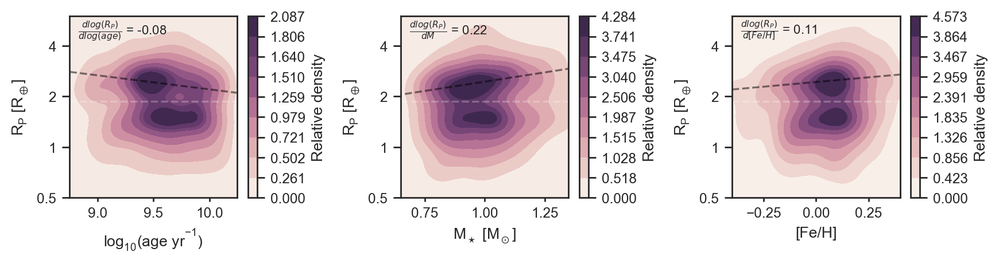

In [42]:
def triptych(samples, fig_path=None, cbar_kws=None):

    fig,ax = plt.subplots(nrows=1, ncols=3, figsize=(0.8*11,0.8*3))

    arg = samples
    sns.kdeplot(cks['f18_logAiso'][arg], np.log10(cks['f18_Rp'][arg]), fill=True, thresh=0, cmap=cmap, ax=ax[0], cbar=True, cbar_kws=cbar_kws)
    sns.kdeplot(cks['f18_Miso'][arg], np.log10(cks['f18_Rp'][arg]), fill=True, thresh=0, cmap=cmap, ax=ax[1], cbar=True, cbar_kws=cbar_kws)
    sns.kdeplot(cks['f18_[Fe/H]'][arg], np.log10(cks['f18_Rp'][arg]), fill=True, thresh=0, cmap=cmap, ax=ax[2], cbar=True, cbar_kws=cbar_kws)
        
    for j in range(3):
        ax[j].set_ylabel(r'$\mathregular{R_P~[R_\oplus]}$')
        ax[j].set_ylim(np.log10(0.5),np.log10(6))
        ax[j].axhline(np.log10(1.87),color='white',ls='--',alpha=0.25)
        ax[j].set_yticks(np.log10([0.5,1,2,4]))
        ax[j].set_yticklabels(['0.5','1','2','4'])        
     

    ax[0].set_xlabel(r'$\mathregular{log_{10}(age~yr^{-1})}$')
    ax[1].set_xlabel(r'$\mathregular{M_\star~[M_\odot]}$')
    ax[2].set_xlabel(r'[Fe/H]')

    ax[0].set_xlim(8.75,10.25)
    ax[1].set_xlim(0.65,1.35)
    ax[2].set_xlim(-0.4,0.4)

    x1min,x1max = 8,11
    y1min,y1max = 0.51,0.26
    
    x2min,x2max = 0.5,1.4
    y2min,y2max = np.log10(1.9),np.log10(3)
    
    x3min,x3max = -0.4,0.4
    y3min,y3max = np.log10(2.2),np.log10(2.7)
    
    ax[0].plot([x1min,x1max],[y1min,y1max],'k--',alpha=0.5)
    ax[1].plot([x2min,x2max],[y2min,y2max],'k--',alpha=0.5)
    ax[2].plot([x3min,x3max],[y3min,y3max],'k--',alpha=0.5)

    ax[0].text(0.05,0.9,r'$\frac{dlog(R_P)}{dlog(age)}$ = '+ "%.2f" % float((y1min-y1max)/(x1min-x1max)), transform=ax[0].transAxes, size=8)
    ax[1].text(0.05,0.9,r'$\frac{dlog(R_P)}{dM}$ = '+ "%.2f" % float((y2min-y2max)/(x2min-x2max)), transform=ax[1].transAxes, size=8)
    ax[2].text(0.05,0.9,r'$\frac{dlog(R_P)}{d[Fe/H]}$ = '+ "%.2f" % float((y3min-y3max)/(x3min-x3max)), transform=ax[2].transAxes, size=8)    
    
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.5)
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
        
cbar_kwargs = {'label': 'Relative density'}
    
triptych(common_cuts&(cks['rp_prec']<6), cbar_kws=cbar_kwargs, fig_path='../figures/triptych.pdf')

### What is the likelihood that the sparsity of the observed gap is due to random chance? (Section 3.4)

Accounting for RV uncertainties
Sample A (isoc_fgk_1to2)
5 27.3
10 11.17
100 0.24
1000 0.04
--------------------------------------------------------------------------------
Sample B (isoc_fgk_lt2)
5 31.36
10 16.33
100 0.68
1000 4.06
--------------------------------------------------------------------------------
Sample C (isoc_fg_lt2)
5 21.2
10 21.5
100 0.84
1000 3.82
--------------------------------------------------------------------------------
Sample D (gyro_gk_lt3)
5 33.45
10 16.03
100 0.34
1000 4.58
--------------------------------------------------------------------------------
Not accounting for RV uncertainties
Sample A (isoc_fgk_1to2)
5 30.16
10 3.03
100 0.09
1000 0.0
--------------------------------------------------------------------------------
Sample B (isoc_fgk_lt2)
5 18.4
10 6.5
100 0.08
1000 0.01
--------------------------------------------------------------------------------
Sample C (isoc_fg_lt2)
5 15.1
10 13.56
100 0.23
1000 0.12
------------------------------------

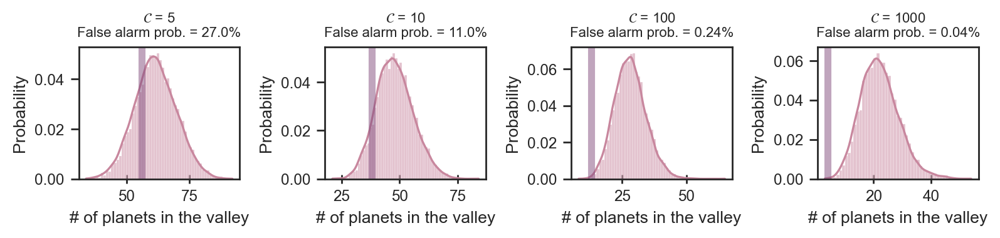

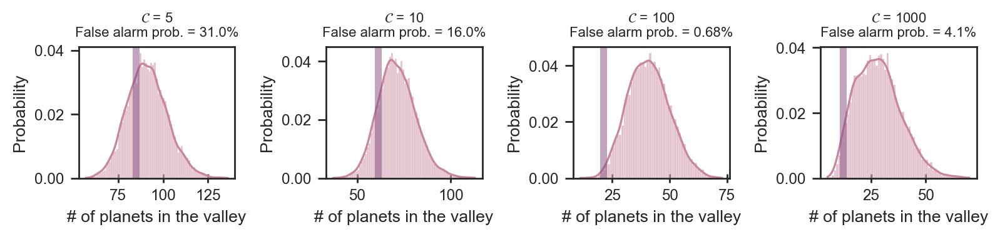

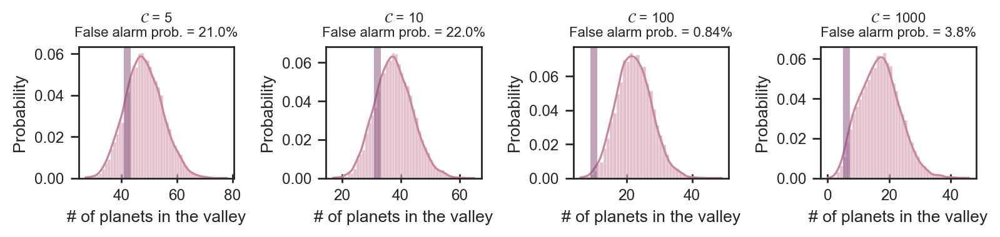

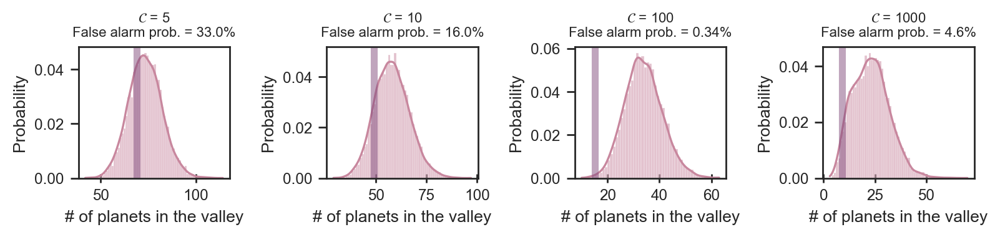

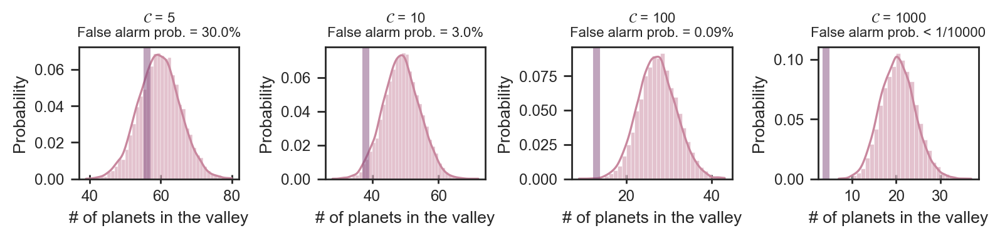

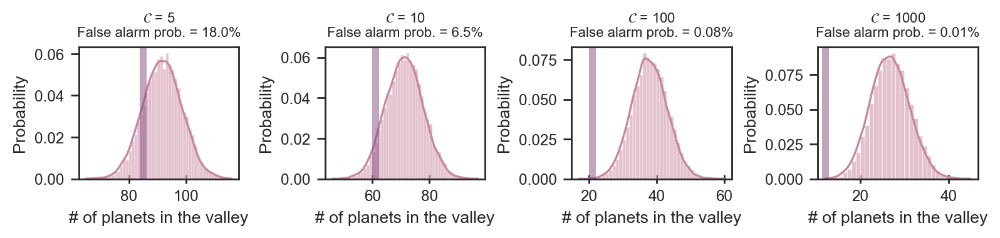

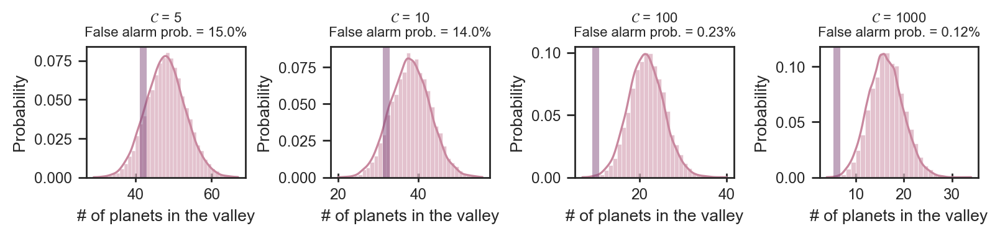

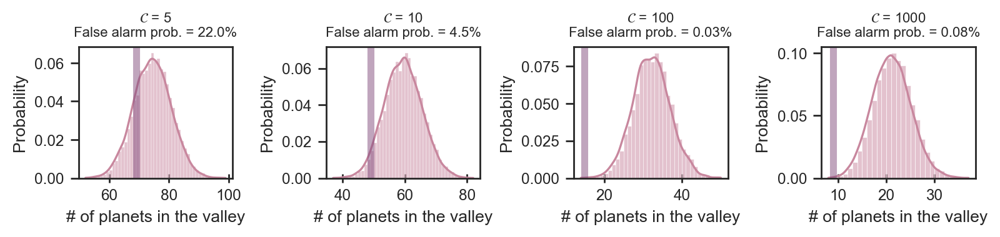

In [43]:
from tqdm import tqdm

def false_alarm_prob(xdata, ydata, slopes, intercepts, margins,
                     npl_itv,
                     penalty=[5,10,100,1000],
                     nsim=int(1e4),
                     control='cks',
                     rv_uncertainty=False,
                     fig_title=None,
                     fig_path=None):
    
    
    np.random.seed(1701)
    

    fig, ax = plt.subplots(nrows=1,ncols=4)

    for i in range(len(penalty)):

        _slopes = slopes[:][i]
        _intercepts = intercepts[:][i]
        _margins = margins[:][i]

        p = penalty[i]

        def up_margin(logp):
            return smed*logp + imed + np.sqrt(1+smed**2) * mmed

        def lo_margin(logp):
            return smed*logp + imed - np.sqrt(1+smed**2) * mmed

        
        if control=='cks':
            mask = common_cuts
                    
        elif control=='cks-old':
            mask = common_cuts & (cks['f18_logAiso']>9.25)

        #Simulate 
        x_cks = np.random.normal(cks['f18_P'][mask], np.max([cks['f18_e_P'][mask], cks['f18_E_P'][mask]],axis=0))
        y_cks = np.random.normal(cks['f18_Rp'][mask], np.max([cks['f18_e_Rp'][mask], cks['f18_E_Rp'][mask]],axis=0))

        itv = []

        for j in range(nsim):

            arg = np.random.choice(len(x_cks), len(xdata), replace=False)
            _x = x_cks[arg]
            _y = y_cks[arg]
            
            
            if rv_uncertainty==True:
                rvarg = np.random.choice(len(_slopes))
            
                smed = _slopes[rvarg]
                imed = _intercepts[rvarg]
                mmed = _margins[rvarg]
            else:
                smed = np.median(_slopes)
                imed = np.median(_intercepts)
                mmed = np.median(_margins)

            def upper_margin(p):
                return smed*p + imed + np.sqrt(1+smed**2) * mmed

            def lower_margin(p):
                return smed*p + imed - np.sqrt(1+smed**2) * mmed            
              

            in_the_valley = (np.log10(_y)>lo_margin(np.log10(_x))) & (np.log10(_y)<up_margin(np.log10(_x)))
            itv.append(len(_y[in_the_valley]))

        itv = np.array(itv)  

        sns.histplot(itv, bins=np.arange(itv.min(),itv.max()), kde=True, color=cpal[1], stat='probability', ax=ax[i])
        ax[i].axvline(npl_itv[i], color=cpal[2], lw=4, alpha=0.5)
        ax[i].set_xlabel('# of planets in the valley')

        if i==0:
            ax[i].set_ylabel('Probability')

        if len(itv[itv<=npl_itv[i]])>0:
            ax[i].set_title(r'$\mathcal{C}$ = '+str(int(p))+'\n'+
                              'False alarm prob. = '+ str(round(100.*float(len(itv[itv<=npl_itv[i]])/len(itv)),
                                                                      int(abs(np.log10(len(itv[itv<=npl_itv[i]])/len(itv))))))+'%', size=8)

        elif len(itv[itv<=npl_itv[i]])==0:
            ax[i].set_title(r'$\mathcal{C}$ = '+str(int(p))+'\n'+
                              'False alarm prob. < 1/'+ str(len(itv)), size=8)

        
        #print(p, 100.*len(itv[itv<=npl_itv[i]])/len(itv), npl_itv[i], len(itv[itv<=npl_itv[i]]), len(itv))
        print(p, 100.*len(itv[itv<=npl_itv[i]])/len(itv))
        
    print('--'*40)
    plt.subplots_adjust()
    plt.gcf().set_size_inches(8,2)
    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    
    return


print('Accounting for RV uncertainties')
print('Sample A (isoc_fgk_1to2)')
false_alarm_prob(xiso, yiso, slopes_A, intercepts_A, margins_A, npl_itv=nitv_iso, rv_uncertainty=True)
print('Sample B (isoc_fgk_lt2)')
false_alarm_prob(xiso_all, yiso_all, slopes_B, intercepts_B, margins_B, npl_itv=nitv_iso_all, rv_uncertainty=True)
print('Sample C (isoc_fg_lt2)')
false_alarm_prob(xhot, yhot, slopes_C, intercepts_C, margins_C, npl_itv=nitv_hot, rv_uncertainty=True)
print('Sample D (gyro_gk_lt3)')
false_alarm_prob(xgyro, ygyro, slopes_D, intercepts_D, margins_D, npl_itv=nitv_gyro, rv_uncertainty=True)

print('Not accounting for RV uncertainties')
print('Sample A (isoc_fgk_1to2)')
false_alarm_prob(xiso, yiso, slopes_A, intercepts_A, margins_A, npl_itv=nitv_iso, rv_uncertainty=False)
print('Sample B (isoc_fgk_lt2)')
false_alarm_prob(xiso_all, yiso_all, slopes_B, intercepts_B, margins_B, npl_itv=nitv_iso_all, rv_uncertainty=False)
print('Sample C (isoc_fg_lt2)')
false_alarm_prob(xhot, yhot, slopes_C, intercepts_C, margins_C, npl_itv=nitv_hot, rv_uncertainty=False)
print('Sample D (gyro_gk_lt3)')
false_alarm_prob(xgyro, ygyro, slopes_D, intercepts_D, margins_D, npl_itv=nitv_gyro, rv_uncertainty=False)

### What is the probability the gyro valley is so empty?

/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 5.78


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 1.29


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 0.2


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 0.11


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 0.02


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 1.65


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 1.38


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 0.07


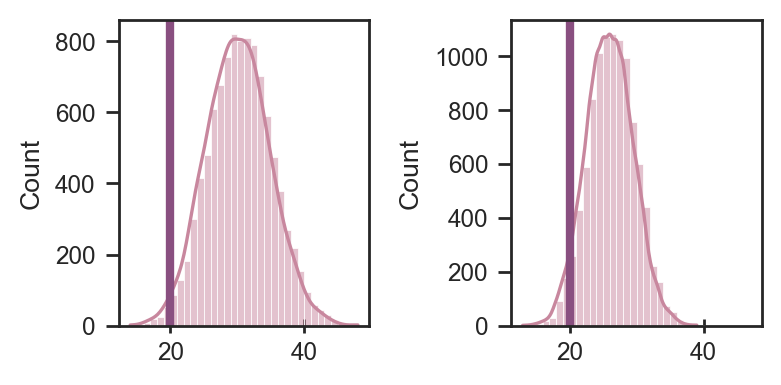

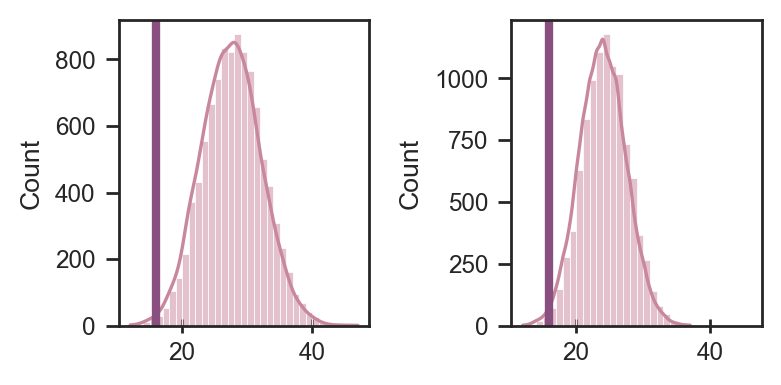

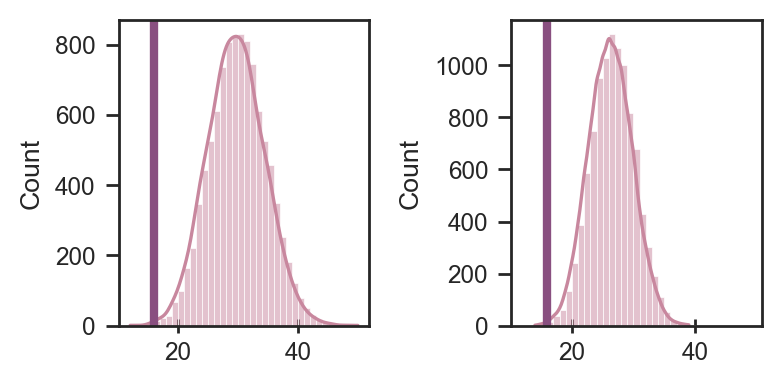

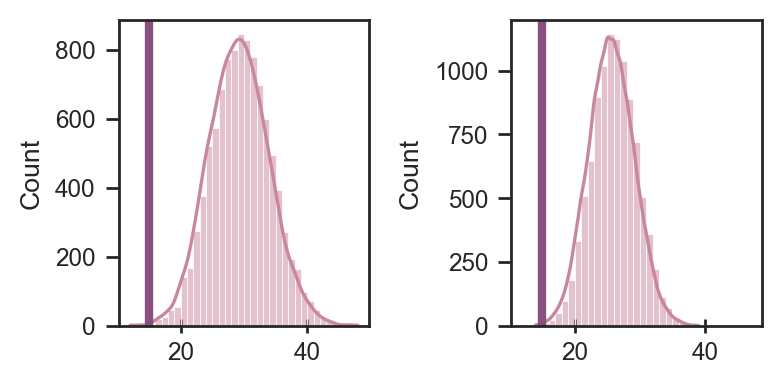

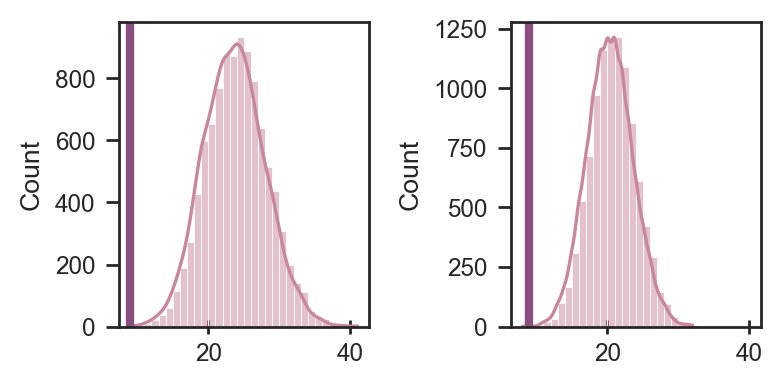

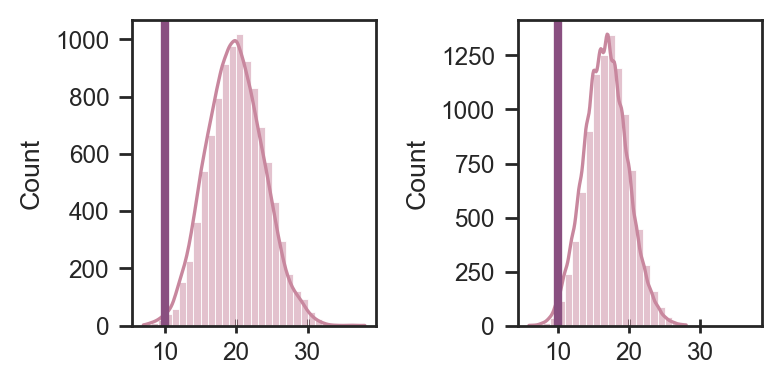

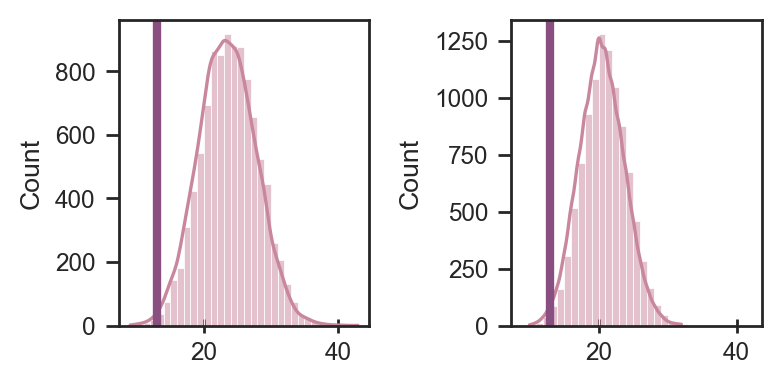

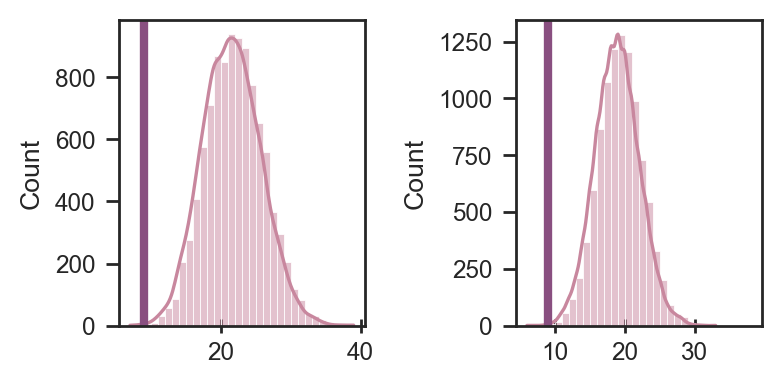

In [44]:
def false_alarm_prob_gyro(slopes, intercepts, margins):
    
    smed = np.median(slopes)
    imed = np.median(intercepts)
    mmed = np.median(margins)

    def up_margin(logp):
        return smed*logp + imed + np.sqrt(1+smed**2) * mmed

    def lo_margin(logp):
        return smed*logp + imed - np.sqrt(1+smed**2) * mmed


    x, y = np.array(np.log10(cks['f18_P'])), np.array(np.log10(cks['f18_Rp']))
    xerr = np.max([cks['f18_e_P'], cks['f18_E_P']], axis=0)
    yerr = np.max([y-np.log10(cks['f18_Rp']-cks['f18_e_Rp']), 
                   np.log10(cks['f18_Rp']+cks['f18_E_Rp'])-y], axis=0)

    gyro_mask = m_ms & m_disp & m_period & m_rp & m_rperr & m_ruwe & (cks['f18_Teff']<6000.)

    gyro_young = gyro_mask & (cks['prot']<curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))&\
                             (cks['prot']>curtis_teff_gyrochrone(cks['f18_Teff'], kind='pleiades-quad'))&\
                             (cks['Prot_flag']=='a')

    gyro_old = gyro_mask & (cks['prot']>=curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))


    npl_young = len(x[gyro_young])
    npl_old   = len(x[gyro_old])

    itv_true = (y[gyro_young]<up_margin(x[gyro_young])) & (y[gyro_young]>lo_margin(x[gyro_young]))
    nitv_true = len(x[gyro_young][itv_true])


    #What is the probability of recovering a valley so empty from the overall CKS sample with the same
    #initial masks applied to the gyro sample?

    np.random.seed(1701)
    nsim = int(1e4)
    nitv_sim = []
    nitv_sim_old = []

    for n in range(nsim):

        xsim = np.random.normal(x[gyro_mask], xerr[gyro_mask])
        ysim = np.random.normal(y[gyro_mask], yerr[gyro_mask])

        xsim_old = np.random.normal(x[gyro_old], xerr[gyro_old])
        ysim_old = np.random.normal(y[gyro_old], yerr[gyro_old])

        arg = np.random.choice(len(xsim), npl_young, replace=False)
        arg_old = np.random.choice(len(xsim_old), npl_young, replace=False)

        itv_sim = (ysim[arg] > lo_margin(xsim[arg])) & (ysim[arg] < up_margin(xsim[arg]))
        itv_old_sim = (ysim_old[arg_old] > lo_margin(xsim_old[arg_old])) & (ysim_old[arg_old] < up_margin(xsim_old[arg_old]))

        nitv_sim.append(len(ysim[arg][itv_sim]))
        nitv_sim_old.append(len(ysim_old[arg_old][itv_old_sim]))


    nitv_sim = np.array(nitv_sim)
    nitv_sim_old = np.array(nitv_sim_old)


    fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(4,2))

    sns.histplot(nitv_sim, bins=np.arange(nitv_sim.min(), nitv_sim.max()), kde=True, ax=ax1, color=cpal[1])
    ax1.axvline(nitv_true, color=tt_cpal[1], lw=3)

    sns.histplot(nitv_sim_old, bins=np.arange(nitv_sim.min(), nitv_sim.max()), kde=True, ax=ax2, color=cpal[1])
    ax2.axvline(nitv_true, color=tt_cpal[1], lw=3)

    plt.tight_layout()

    print('Probability of recovering a comparably empty void from old gyro sample (%) =', 
          100.*len(nitv_sim_old[nitv_sim_old<=nitv_true])/len(nitv_sim_old))
    
    
for i in range(2,4):
    false_alarm_prob_gyro(slopes_A[:][i], intercepts_A[:][i], margins_A[:][i])
    false_alarm_prob_gyro(slopes_B[:][i], intercepts_B[:][i], margins_B[:][i])
    false_alarm_prob_gyro(slopes_C[:][i], intercepts_C[:][i], margins_C[:][i])
    false_alarm_prob_gyro(slopes_D[:][i], intercepts_D[:][i], margins_D[:][i])

### What parameters are most correlated with the age differences in CKS and GKSPC? (Fig. 24)

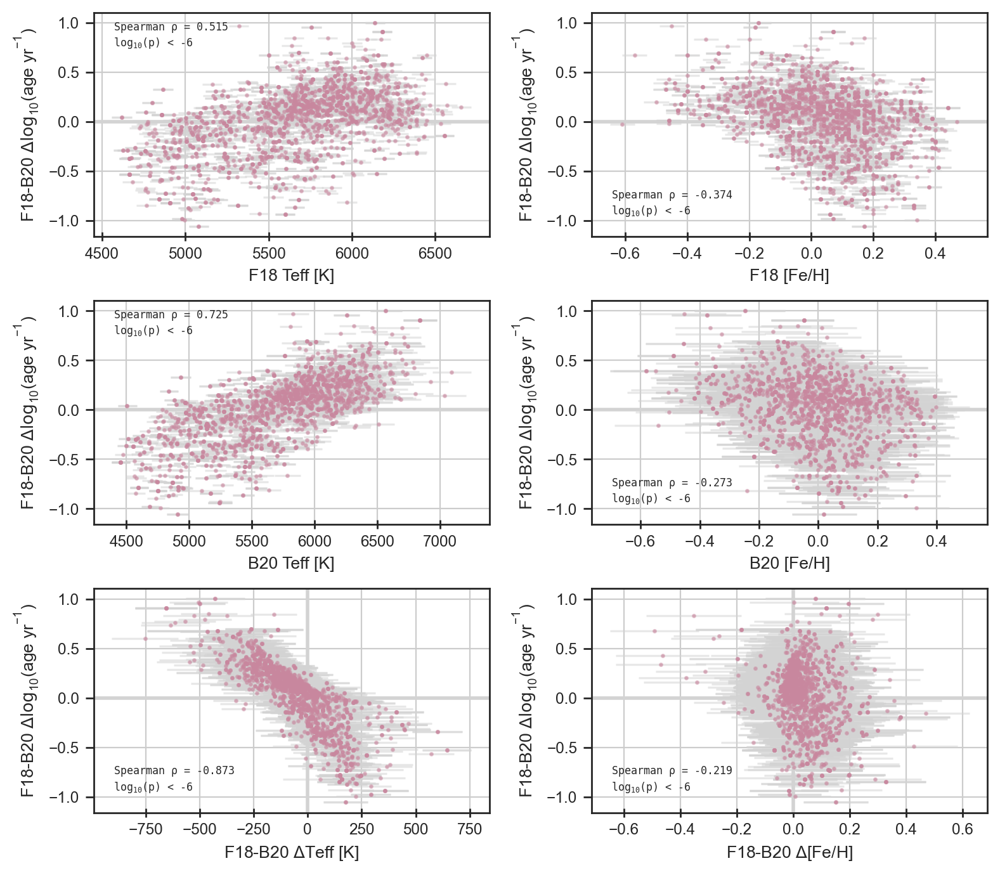

In [45]:
def age_diff_trends(fig_path=None):
    
    ebar_kwargs = {'ecolor': 'lightgrey', 
                   'mfc':cpal[1], 
                   'ms': 3, 
                   'fmt':'.', 
                   'color':cpal[1], 
                   'alpha':0.5,
                   'rasterized':True}


    plt.subplot(321)
    plt.grid(True)
    plt.errorbar(cks['f18_Teff'], cks['f18_logAiso']-cks['b20_log10_iso_age'], 
                 xerr=cks['f18_e_Teff'], **ebar_kwargs)

    x, y = cks['f18_Teff'], cks['f18_logAiso']-cks['b20_log10_iso_age']
    _ = (np.isfinite(x))&(np.isfinite(y))
    rho,pval = stats.spearmanr(x[_],y[_])    

    plt.text(0.05,0.85,r'Spearman $\mathregular{\rho}$ = '+str(rho.round(3))+'\n'+
             r'log$_\mathregular{10}$(p) < -6 ',
             family='monospace', 
             weight='light',
             size=6,
             transform=plt.gca().transAxes)     

    plt.axhline(0, color='lightgrey', lw=2)
    plt.xlabel('F18 Teff [K]')
    plt.ylabel(r'F18-B20 $\mathregular{\Delta \log_{10}(age~yr^{-1})}$')

    plt.subplot(322)
    plt.grid(True)
    plt.errorbar(cks['f18_[Fe/H]'], cks['f18_logAiso']-cks['b20_log10_iso_age'], 
                 xerr=cks['f18_e_[Fe/H]'],
                 **ebar_kwargs)


    x, y = cks['f18_[Fe/H]'], cks['f18_logAiso']-cks['b20_log10_iso_age']
    _ = (np.isfinite(x))&(np.isfinite(y))
    rho,pval = stats.spearmanr(x[_],y[_])    

    plt.text(0.05,0.1,r'Spearman $\mathregular{\rho}$ = '+str(rho.round(3))+'\n'+
             r'log$_\mathregular{10}$(p) < -6',
             family='monospace', 
             weight='light',
             size=6,
             transform=plt.gca().transAxes)     

    plt.axhline(0, color='lightgrey', lw=2)
    plt.xlabel('F18 [Fe/H]')
    plt.ylabel(r'F18-B20 $\mathregular{\Delta \log_{10}(age~yr^{-1})}$')



    plt.subplot(323)
    plt.grid(True)
    plt.errorbar(cks['b20_iso_teff'], cks['f18_logAiso']-cks['b20_log10_iso_age'], 
                 xerr=[-cks['b20_iso_teff_err2'],cks['b20_iso_teff_err1']],
                **ebar_kwargs)

    x, y = cks['b20_iso_teff'], cks['f18_logAiso']-cks['b20_log10_iso_age']
    _ = (np.isfinite(x))&(np.isfinite(y))
    rho,pval = stats.spearmanr(x[_],y[_])    

    plt.text(0.05,0.85,r'Spearman $\mathregular{\rho}$ = '+str(rho.round(3))+'\n'+
             r'log$_\mathregular{10}$(p) < -6',
             family='monospace', 
             weight='light',
             size=6,
             transform=plt.gca().transAxes)     

    plt.axhline(0, color='lightgrey', lw=2)
    plt.xlabel('B20 Teff [K]')
    plt.ylabel(r'F18-B20 $\mathregular{\Delta \log_{10}(age~yr^{-1})}$')

    plt.subplot(324)
    plt.grid(True)
    plt.errorbar(cks['b20_iso_feh'], cks['f18_logAiso']-cks['b20_log10_iso_age'], 
                 xerr=[-cks['b20_iso_feh_err2'],cks['b20_iso_feh_err1']],
                **ebar_kwargs)


    x, y = cks['b20_iso_feh'], cks['f18_logAiso']-cks['b20_log10_iso_age']
    _ = (np.isfinite(x))&(np.isfinite(y))
    rho,pval = stats.spearmanr(x[_],y[_])    

    plt.text(0.05,0.1,r'Spearman $\mathregular{\rho}$ = '+str(rho.round(3))+'\n'+
             r'log$_\mathregular{10}$(p) < -6',
             family='monospace', 
             weight='light',
             size=6,
             transform=plt.gca().transAxes)     

    plt.axhline(0, color='lightgrey', lw=2)
    plt.xlabel('B20 [Fe/H]')
    plt.ylabel(r'F18-B20 $\mathregular{\Delta \log_{10}(age~yr^{-1})}$')


    plt.subplot(325)
    plt.grid(True)
    x, y = cks['f18_Teff']-cks['b20_iso_teff'], cks['f18_logAiso']-cks['b20_log10_iso_age']

    plt.errorbar(x,y, 
                 xerr=np.sqrt(cks['f18_e_Teff']**2+cks['b20_iso_teff_err2']**2),
                 **ebar_kwargs)

    _ = (np.isfinite(x))&(np.isfinite(y))
    rho,pval = stats.spearmanr(x[_],y[_])    

    plt.text(0.05,0.1,r'Spearman $\mathregular{\rho}$ = '+str(rho.round(3))+'\n'+
             r'log$_\mathregular{10}$(p) < -6',
             family='monospace', 
             weight='light',
             size=6,
             transform=plt.gca().transAxes)     

    plt.axhline(0, color='lightgrey', lw=2)
    plt.axvline(0, color='lightgrey', lw=2)
    plt.xlabel(r'F18-B20 $\mathregular{\Delta Teff~[K]}$')
    plt.ylabel(r'F18-B20 $\mathregular{\Delta \log_{10}(age~yr^{-1})}$')

    plt.subplot(326)
    plt.grid(True)
    x, y = cks['f18_[Fe/H]']-cks['b20_iso_feh'], cks['f18_logAiso']-cks['b20_log10_iso_age']

    plt.errorbar(x,y, 
                 xerr=np.sqrt(cks['f18_e_[Fe/H]']**2+cks['b20_iso_feh_err2']**2),
                 **ebar_kwargs)

    _ = (np.isfinite(x))&(np.isfinite(y))
    rho,pval = stats.spearmanr(x[_],y[_])    

    plt.text(0.05,0.1,r'Spearman $\mathregular{\rho}$ = '+str(rho.round(3))+'\n'+
             r'log$_\mathregular{10}$(p) < -6',
             family='monospace', 
             weight='light',
             size=6,
             transform=plt.gca().transAxes)     

    plt.axhline(0, color='lightgrey', lw=2)
    plt.axvline(0, color='lightgrey', lw=2)
    plt.xlabel(r'F18-B20 $\mathregular{\Delta [Fe/H]}$')
    plt.ylabel(r'F18-B20 $\mathregular{\Delta \log_{10}(age~yr^{-1})}$')

    plt.gcf().set_size_inches(8,7)
    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
    

age_diff_trends(fig_path="../figures/agediff-trends.pdf")

### Visualizing the rotation period reliability flags in the H-R diagram

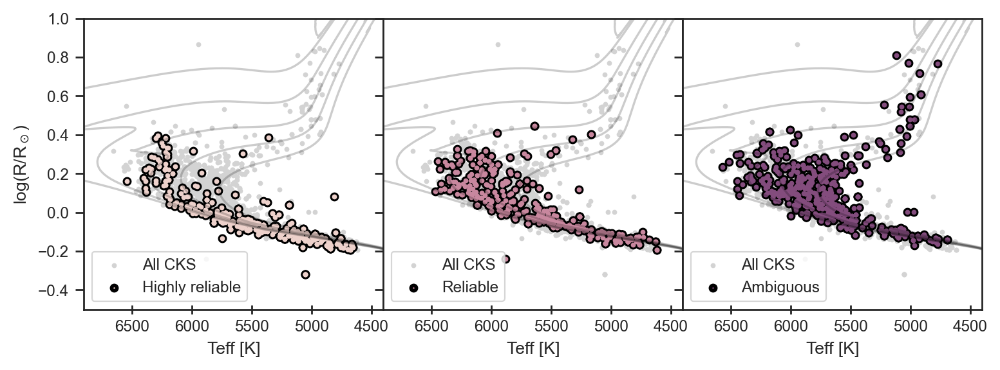

In [46]:
fig, ax = plt.subplots(nrows=1,ncols=3, sharey=True, figsize=(9,3))

labels = ['Highly reliable', 'Reliable', 'Ambiguous']

for i,_ in enumerate(['a','b','m']):
    ca = ax[i]
    ca.scatter(cks['f18_Teff'], np.log10(cks['f18_R']), color='lightgrey', s=4, label='All CKS')
    ca.scatter(cks['f18_Teff'][cks['Prot_flag']==_], np.log10(cks['f18_R'][cks['Prot_flag']==_]), color=cpal[i], edgecolor='k', lw=3, s=4, label=labels[i])
    ca.scatter(cks['f18_Teff'][cks['Prot_flag']==_], np.log10(cks['f18_R'][cks['Prot_flag']==_]), color=cpal[i], s=4)
    ca.set_xlim(6900,4400)
    ca.set_ylim(-0.5,1)
    ca.set_xlabel('Teff [K]')
    ca.legend()
    
    
    for la in [9.,9.25,9.5,9.75,10]:
        __ = mist['log10_isochrone_age_yr']==la
        ca.plot(10.**mist['log_Teff'][__], mist['log_R'][__], color='k', alpha=0.2)
    
    
    if i==0:
        ca.set_ylabel(r'log(R/R$_\odot$)')


plt.subplots_adjust(wspace=0)
plt.show()

### Signal-to-noise vs. age plot

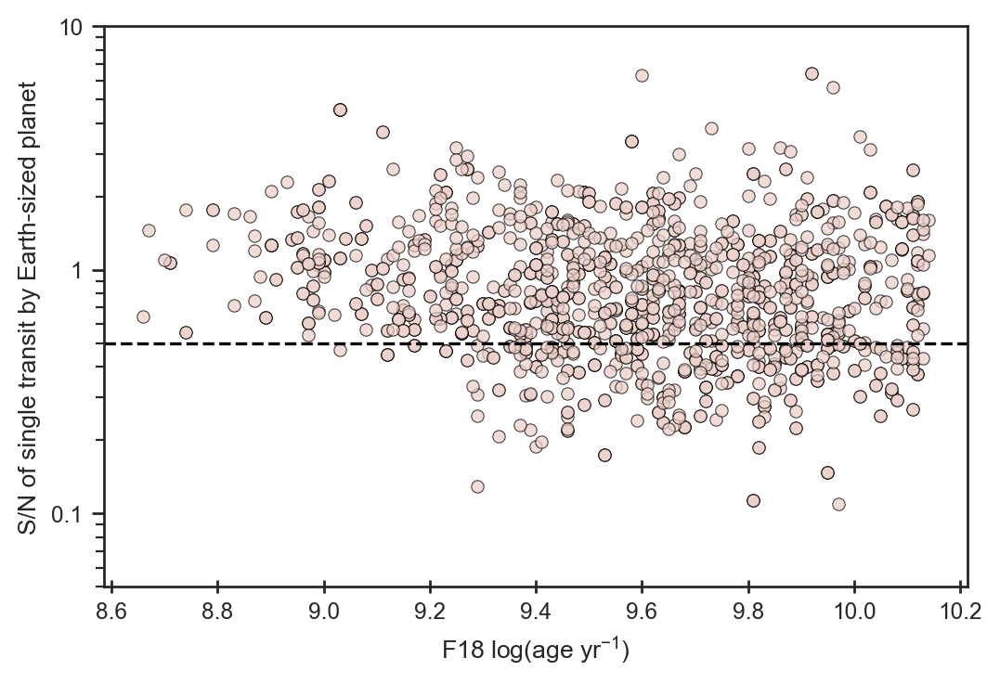

In [47]:
sns.scatterplot(cks['f18_logAiso'][common_cuts], cks['single_transit_snr'][common_cuts], edgecolor='k', alpha=0.75)
plt.axhline(0.5, color='k', ls='--')
plt.xlabel(r'F18 log(age yr$^\mathregular{-1}$)')
plt.ylabel('S/N of single transit by Earth-sized planet')
plt.semilogy()
plt.ylim(5e-2,10)
plt.yticks([0.1,1,10],['0.1','1','10'])
plt.show()

### What are the young planets in the void?

In [48]:
in_the_void = iso_allyng &\
      (np.log10(cks['f18_Rp'])>lower_margin(np.log10(cks['f18_P']), sample='A')) &\
      (np.log10(cks['f18_Rp'])<upper_margin(np.log10(cks['f18_P']), sample='A'))

itv_df = cks[in_the_void].copy()
pd.reset_option('max_columns')
#pd.set_option('max_columns', 999)
itv_df.head(np.shape(itv_df)[0])

,f18_KOI,f18_P,f18_E_P,f18_e_P,f18_Rp/R*,f18_E_Rp/R*,f18_e_Rp/R*,f18_Rp,f18_E_Rp,f18_e_Rp,...,f18_depth_ppm,single_transit_snr,Rcut,rs_prec,rp_prec,ror_prec,nkoi,f18_age_gyr,f18_agelo_gyr,f18_agehi_gyr
213,K00299.01,1.541677,0.000001,0.000001,0.018805,0.000133,0.002241,1.870,0.127,0.127,...,353.628025,1.444580,1.840301,2.417582,6.791444,11.917043,1,0.954993,0.371535,3.162278
234,K00323.01,5.835983,0.000005,0.000005,0.021113,0.000664,0.000254,1.851,0.060,0.060,...,445.758769,1.710482,1.804864,2.366127,3.241491,3.144982,1,0.676083,0.524807,1.905461
247,K00338.01,7.010627,0.000012,0.000012,0.018662,0.000392,0.002210,1.587,0.118,0.118,...,348.270244,1.734718,1.390308,2.570694,7.435413,11.842246,2,0.891251,0.524807,3.019952
399,K00534.02,2.735903,0.000005,0.000005,0.019056,0.000658,0.000370,1.708,0.066,0.066,...,363.131136,0.846309,1.570363,2.801462,3.864169,3.452981,2,1.737801,0.741310,4.466836
986,K01781.02,3.005156,0.000002,0.000002,0.023155,0.000724,0.000184,1.866,0.061,0.061,...,536.154025,1.813816,1.349653,2.710027,3.269025,3.126754,3,0.977237,0.309030,3.981072
1152,K02035.01,1.931560,0.000002,0.000002,0.022266,0.000506,0.001901,2.067,0.123,0.123,...,495.774756,1.110275,1.831846,2.470588,5.950653,8.537681,1,1.318257,0.389045,2.511886
1157,K02038.02,12.513668,0.000055,0.000055,0.020182,0.003440,0.001176,1.879,0.219,0.219,...,407.313124,0.626074,1.796571,3.048066,11.655136,17.044891,4,1.380384,0.407380,3.019952
1203,K02111.02,7.186453,0.000018,0.000018,0.018768,0.001013,0.000322,1.844,0.086,0.086,...,352.237824,0.563916,1.875474,3.111111,4.663774,5.397485,2,1.412538,0.446684,3.388442
1419,K02678.01,3.833091,0.000005,0.000005,0.019496,0.000341,0.000680,1.675,0.059,0.059,...,380.094016,2.296002,1.703465,2.414231,3.522388,3.487895,1,0.851138,0.251189,1.513561
1671,K03876.01,19.577766,0.000161,0.000161,0.018818,0.001693,0.001272,1.828,0.150,0.150,...,354.117124,1.198204,1.990164,2.471910,8.205689,8.996705,1,0.741310,0.295121,1.445440


### Determine the number of planets in the valley resulting from each mask

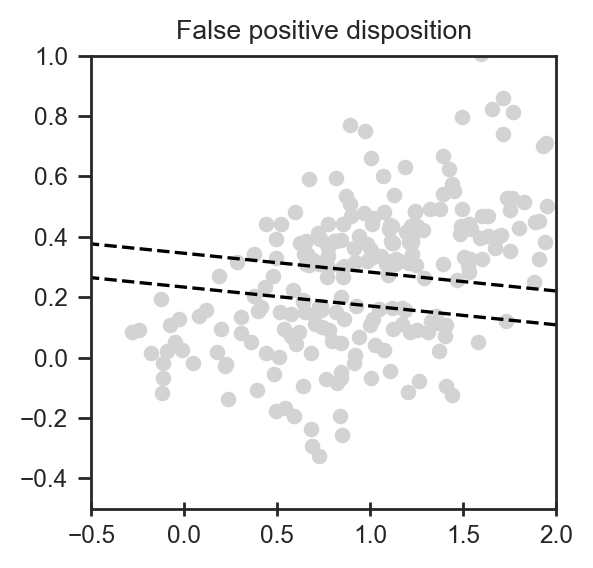

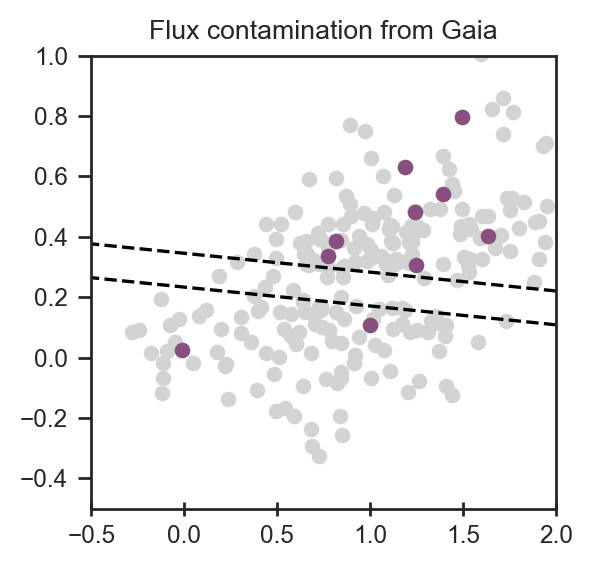

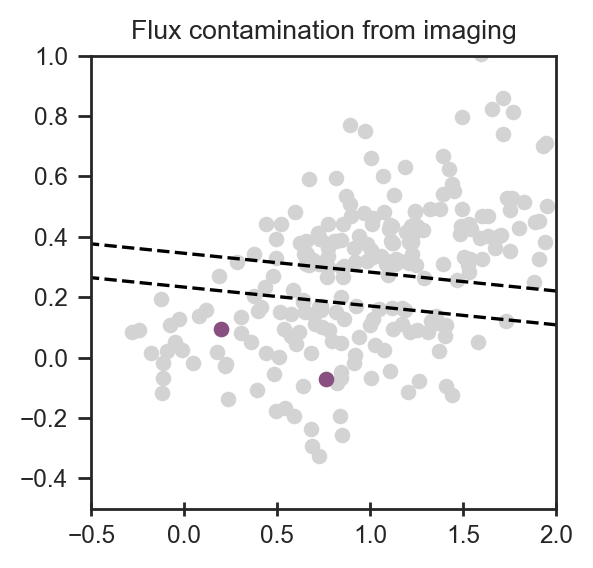

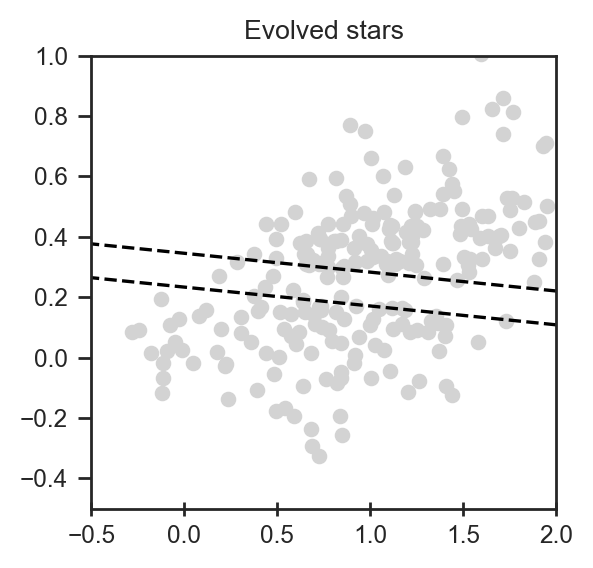

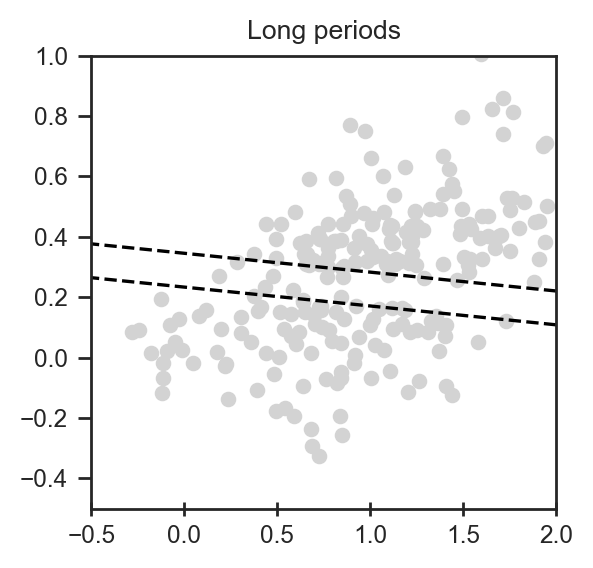

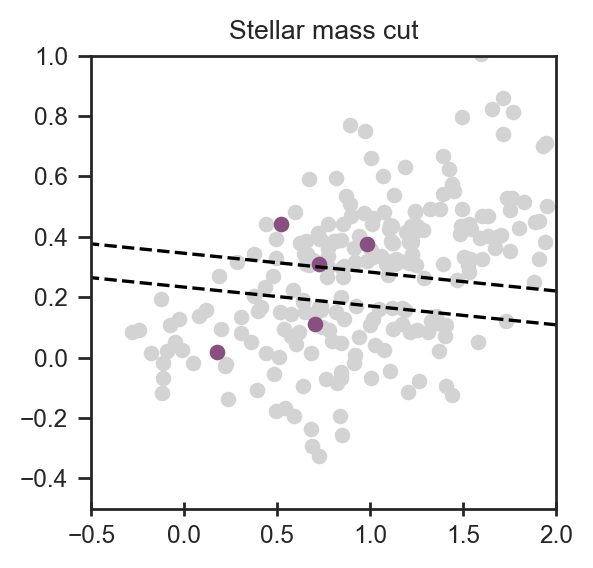

247    K00338.01
Name: f18_KOI, dtype: object


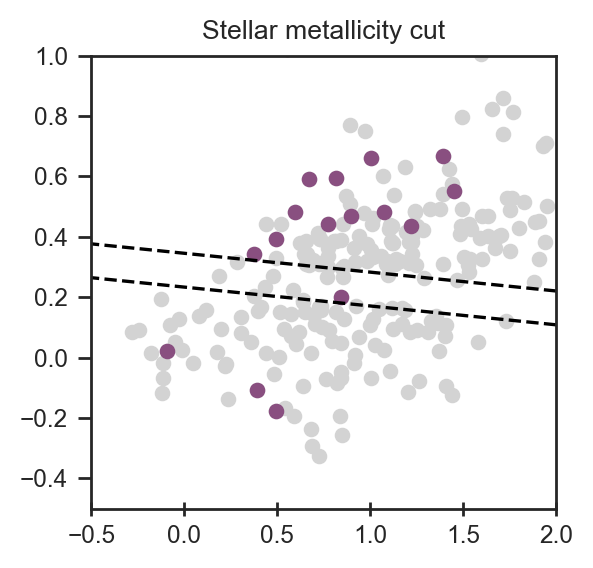

1462    K02768.02
Name: f18_KOI, dtype: object


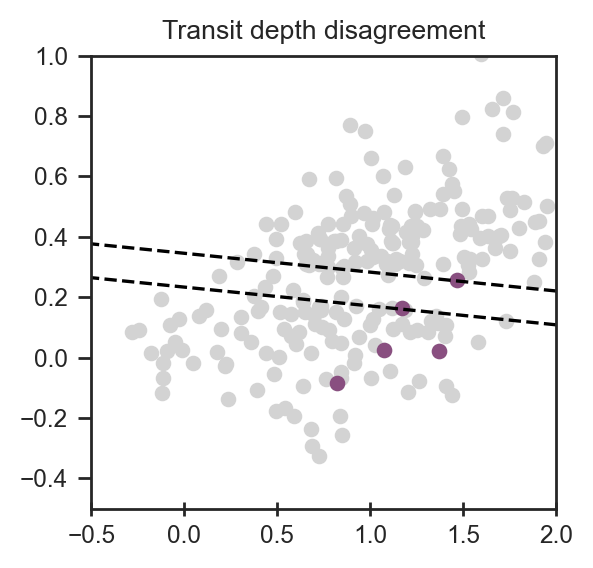

1462    K02768.02
Name: f18_KOI, dtype: object


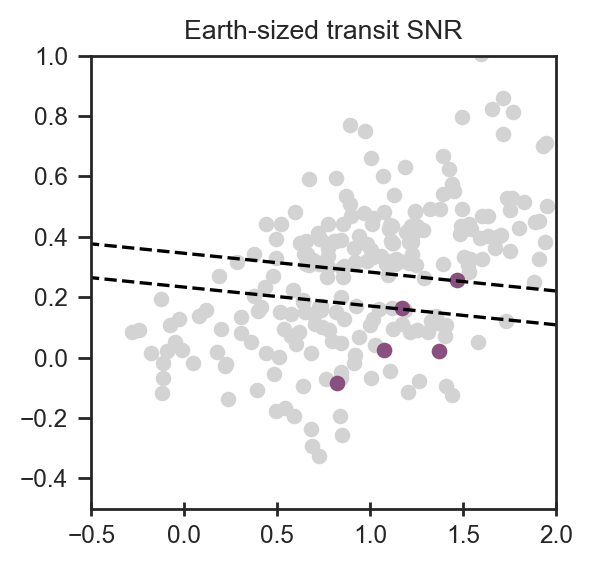

986     K01781.02
1462    K02768.02
Name: f18_KOI, dtype: object


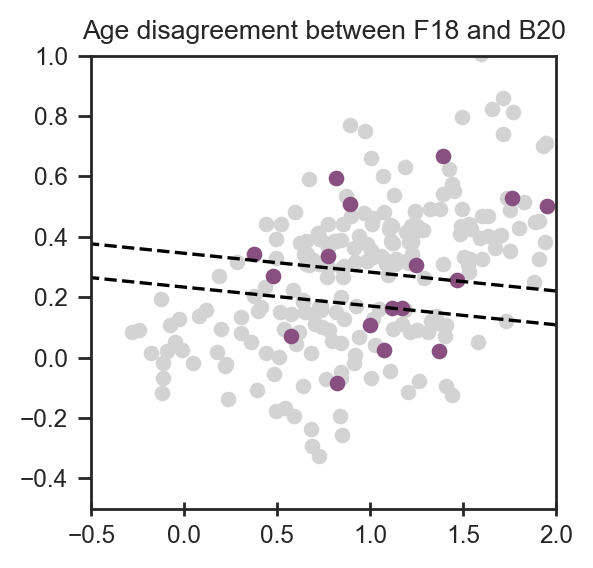

1462    K02768.02
Name: f18_KOI, dtype: object


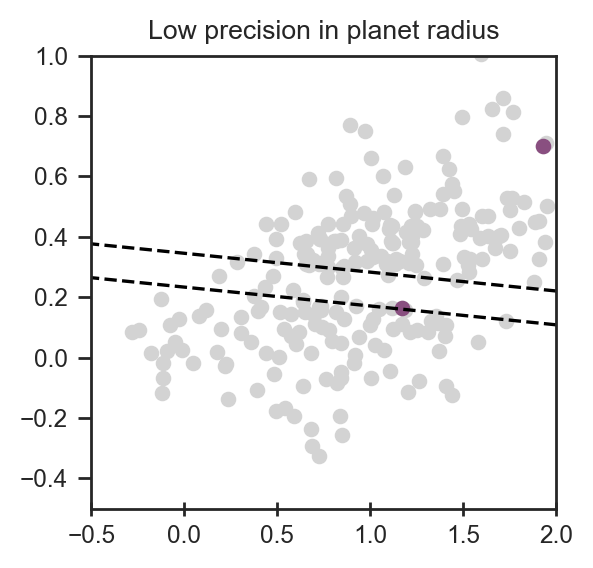

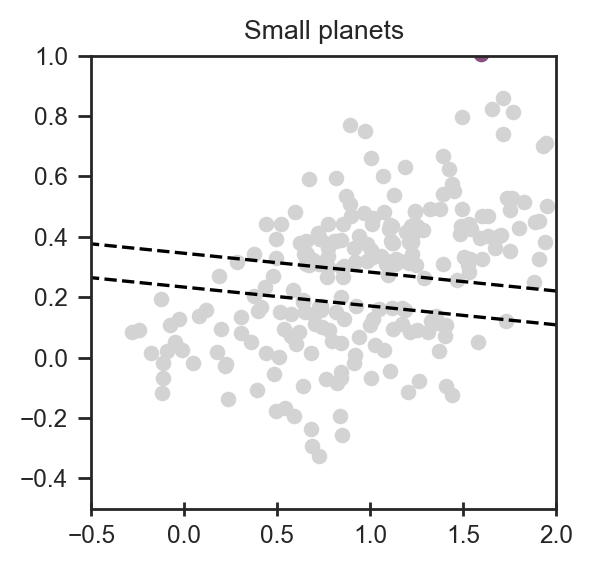

1462    K02768.02
Name: f18_KOI, dtype: object


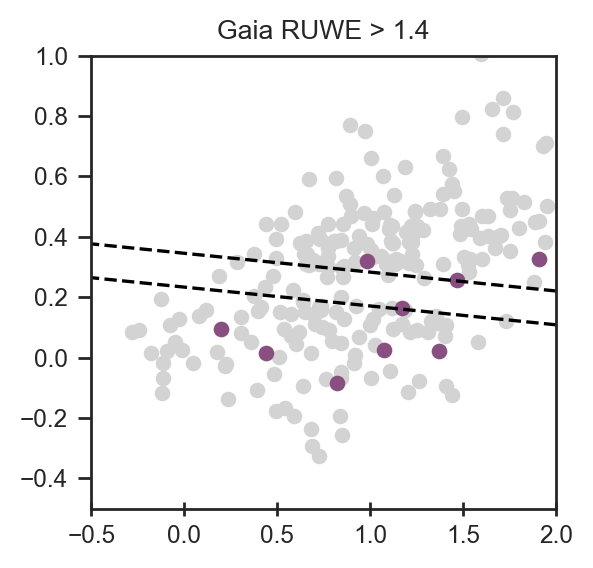

1462    K02768.02
Name: f18_KOI, dtype: object


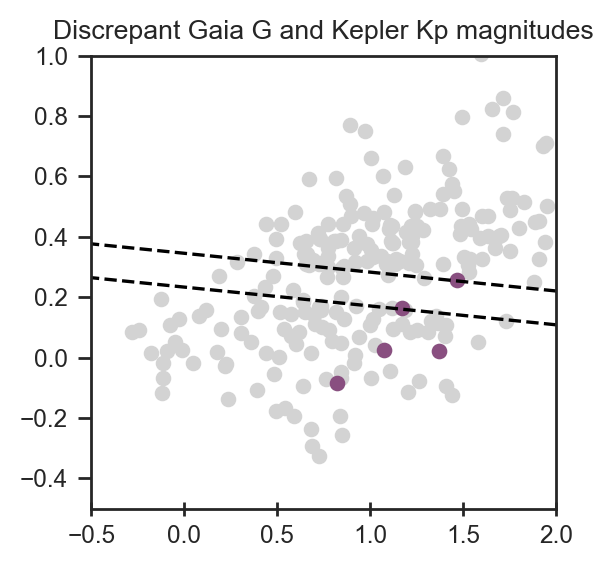

986     K01781.02
1462    K02768.02
Name: f18_KOI, dtype: object


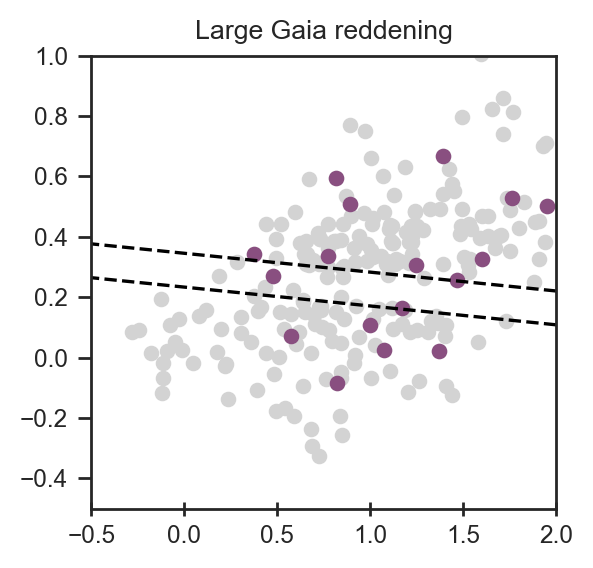

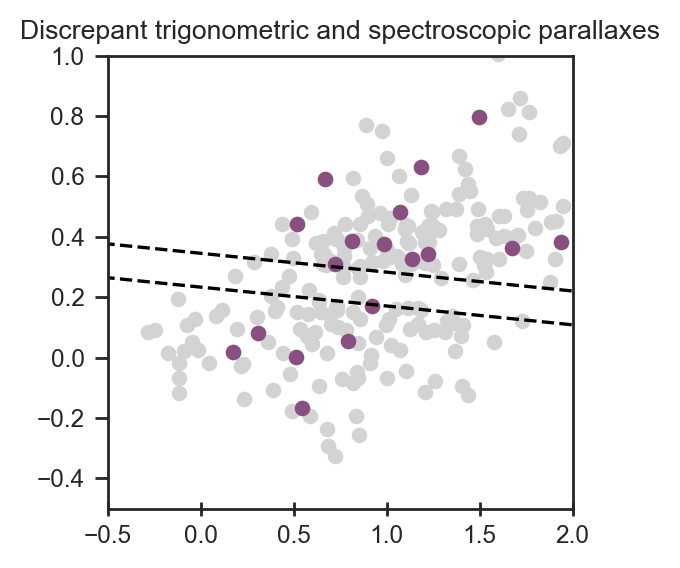

1203    K02111.02
1419    K02678.01
1462    K02768.02
1671    K03876.01
Name: f18_KOI, dtype: object


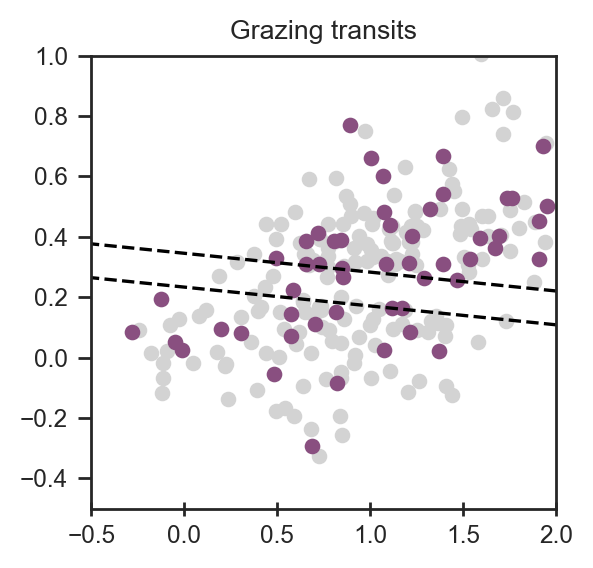

In [49]:
masks = [
         m_disp,
         m_r8,
         m_rcf,
         m_ms,
         m_period,
         m_mass,
         m_feh,
         m_depth,
         m_snr,
         m_deltaage,
         m_rperr,
         m_rp,
         m_ruwe,
         m_deltamag,
         m_red,
         m_plx,
         m_nongrazing
        ]


for i,_m in enumerate(masks):
    _arg  = (~_m) & (cks['f18_logAiso']<9.25) & (cks['p17_Disp']!='FP')
    _arg0 = (cks['f18_logAiso']<9.25) & (cks['p17_Disp']!='FP')
    
    _argitv = (~_m) & (cks['f18_logAiso']<9.25) & (cks['p17_Disp']!='FP') &\
              (np.log10(cks['f18_Rp'])>lower_margin(np.log10(cks['f18_P']), sample='A')) &\
              (np.log10(cks['f18_Rp'])<upper_margin(np.log10(cks['f18_P']), sample='A'))
    
    if len(cks[_argitv])>0:
        print(cks['f18_KOI'][_argitv])
    
    plt.scatter(np.log10(cks['f18_P'][_arg0]), np.log10(cks['f18_Rp'][_arg0]), color='lightgrey')
    plt.scatter(np.log10(cks['f18_P'][_arg]), np.log10(cks['f18_Rp'][_arg]), color=tt_cpal[1])
    plt.plot(np.log10([0.1,100]),upper_margin(np.log10([0.1,100]), sample='A'), 'k--')
    plt.plot(np.log10([0.1,100]),lower_margin(np.log10([0.1,100]), sample='A'), 'k--')
    plt.xlim(-0.5,2)
    plt.ylim(-0.5,1)
    plt.title(mask_dict[i+1])
    plt.gcf().set_size_inches(3,3)
    plt.show()